<a href="https://colab.research.google.com/github/dolmani38/Summary2/blob/main/en_multi-discriminator%20GAN%200925.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# English Multi-Discriminator GAN


ABSTRACT

----


#4. Implementation


## 4.1 기본 설정...

In [1]:
if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#!pip install keybert
!pip3 install transformers
!pip3 install sentence-transformers

#!pip install sentence-transformers

     |████████████████████████████████| 2.8 MB 7.1 MB/s 
     |████████████████████████████████| 895 kB 39.1 MB/s 
     |████████████████████████████████| 636 kB 73.6 MB/s 
     |████████████████████████████████| 3.3 MB 61.3 MB/s 
     |████████████████████████████████| 52 kB 1.9 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
     |████████████████████████████████| 85 kB 321 kB/s 
     |████████████████████████████████| 1.2 MB 17.7 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.0.0-py3-none-any.whl size=126710 sha256=15faeab534fab8aa266b03574697829b34de1a8f25bb7cf9b332308dd026a239
  Stored in directory: /root/.cache/pip/wheels/d1/c1/0f/faafd427f705c4b012274ba60d9a91d75830306811e1355293
Successfully built sentence-transformers


In [3]:
import matplotlib.pyplot as plt
# set seeds for reproducability
from numpy.random import seed
#seed(1)

import pandas as pd
import numpy as np
import string, os 

import urllib.request
import nltk
nltk.download('punkt')

import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [4]:
import torch

# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

logout = True

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [5]:
# Print iterations progress
class ProgressBar:

    def __init__(self,total=20, prefix = '', suffix = '', decimals = 1, length = 20, fill = '|', printEnd = "\r"):
        self.total = total
        self.prefix = prefix
        self.suffix = suffix
        self.decimals = decimals
        self.length = length
        self.fill = fill
        self.printEnd = printEnd
        self.ite = 0
        self.back_filledLength = 0

    def printProgress(self,iteration, text):
        self.ite += iteration
        percent = ("{0:." + str(self.decimals) + "f}").format(100 * (self.ite / float(self.total)))
        filledLength = int(self.length * self.ite // self.total)
        bar = self.fill * filledLength + '.' * (self.length - filledLength)
        if filledLength > self.back_filledLength or percent == 100:
            if logout:
                print(f'\r{self.prefix} |{bar}| {percent}% {self.suffix}  {text}', end="", flush=True)
            # Print New Line on Complete
            if self.ite == self.total: 
                if logout:
                    print()
        self.back_filledLength = filledLength    

In [6]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms

##4.2 Grammar Discriminator Class

In [7]:
from transformers import BertTokenizer, BertTokenizerFast,AutoTokenizer, BertForSequenceClassification, AdamW, BertConfig, get_linear_schedule_with_warmup
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler, TensorDataset, random_split

import time
import random
import datetime
import pickle

# 간단한 전처리
def clean_text(txt):
    txt = txt.replace('\n',' ')
    txt = txt.replace('\r',' ')    
    txt = txt.replace('=','')
    txt = txt.replace('\"','')   
    txt = txt.replace('\'','')
    #txt = txt.replace(',','')
    txt = txt.replace('..','')
    txt = txt.replace('...','')
    txt = txt.replace(' .','.')
    txt = txt.replace('.','. ')
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')           
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')             
    return txt.strip()

def shuffling(txt):
    txt_list = txt.split(' ')
    random.shuffle(txt_list)
    return ' '.join(txt_list)

def collect_training_dataset_for_grammar_discriminator(sentences_dataset):

    sentences = []
    labels = []

    for txtss in sentences_dataset:
        txtss = clean_text(txtss)
        txts = txtss.strip().split('.')
        for txt in txts:  
            txt = txt.strip()
            if len(txt) > 10:
                #ko_grammar_dataset.append([txt,1])
                txt = txt.replace('.','')
                tf = random.choice([True,False])
                # 정상 또는 비정상 둘중에 하나만 데이터셋에 추가
                if (tf):
                    sentences.append(txt) # '.'의 위치를 보고 True, False를 판단 하기 땜에...
                    labels.append(1)
                else:
                    sentences.append(shuffling(txt))
                    labels.append(0)

    return sentences,labels

# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))
    
    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))

class Grammar_Discriminator:


    def __init__(self, pretraoned_kobert_model_name='bert-base-v2', input_dir=None):

        if input_dir is None:
            self.tokenizer = BertTokenizerFast.from_pretrained(pretraoned_kobert_model_name)
            self.discriminator = BertForSequenceClassification.from_pretrained(
                                    pretraoned_kobert_model_name, # Use the 12-layer BERT model, with an uncased vocab.
                                    num_labels = 2, # The number of output labels--2 for binary classification.
                                                    # You can increase this for multi-class tasks.   
                                    output_attentions = False, # Whether the model returns attentions weights.
                                    output_hidden_states = False, # Whether the model returns all hidden-states.
                                )            
        else:
            self.__load_model(input_dir)




    def set_dataset(self, sentences,labels):
        # Print the original sentence.
        print(' Original: ', sentences[0])

        # Tokenize all of the sentences and map the tokens to thier word IDs.
        input_ids = []
        attention_masks = []

        # For every sentence...
        for i, sent in enumerate(sentences):
            print(f'\r Tokenize {i+1}/{len(sentences)}', end="", flush=True)            
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])
            
            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])

        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0)
        attention_masks = torch.cat(attention_masks, dim=0)
        labels = torch.tensor(labels)

        # Print sentence 0, now as a list of IDs.
        print('Original: ', sentences[0])
        print('Token IDs:', input_ids[0])

        # Training & Validation Split
        # Divide up our training set to use 90% for training and 10% for validation.

        # Combine the training inputs into a TensorDataset.
        dataset = TensorDataset(input_ids, attention_masks, labels)

        # Create a 90-10 train-validation split.

        # Calculate the number of samples to include in each set.
        train_size = int(0.9 * len(dataset))
        val_size = len(dataset) - train_size

        # Divide the dataset by randomly selecting samples.
        train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

        print('{:>5,} training samples'.format(train_size))
        print('{:>5,} validation samples'.format(val_size))

        # The DataLoader needs to know our batch size for training, so we specify it 
        # here. For fine-tuning BERT on a specific task, the authors recommend a batch 
        # size of 16 or 32.
        self.batch_size = 32

        # Create the DataLoaders for our training and validation sets.
        # We'll take training samples in random order. 
        self.train_dataloader = DataLoader(
                    train_dataset,  # The training samples.
                    sampler = RandomSampler(train_dataset), # Select batches randomly
                    batch_size = self.batch_size # Trains with this batch size.
                )

        # For validation the order doesn't matter, so we'll just read them sequentially.
        self.validation_dataloader = DataLoader(
                    val_dataset, # The validation samples.
                    sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
                    batch_size = self.batch_size # Evaluate with this batch size.
                )        


    def train(self,epochs=4):
        # Tell pytorch to run this model on the GPU.
        self.discriminator.cuda()

        # Get all of the model's parameters as a list of tuples.
        params = list(self.discriminator.named_parameters())

        print('The BERT model has {:} different named parameters.\n'.format(len(params)))

        print('==== Embedding Layer ====\n')

        for p in params[0:5]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== First Transformer ====\n')

        for p in params[5:21]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== Output Layer ====\n')

        for p in params[-4:]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))  

        # Note: AdamW is a class from the huggingface library (as opposed to pytorch) 
        # I believe the 'W' stands for 'Weight Decay fix"
        self.optimizer = AdamW(self.discriminator.parameters(),
                        lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )

        # Number of training epochs. The BERT authors recommend between 2 and 4. 
        # We chose to run for 4, but we'll see later that this may be over-fitting the
        # training data.
        #epochs = 2

        # Total number of training steps is [number of batches] x [number of epochs]. 
        # (Note that this is not the same as the number of training samples).
        total_steps = len(self.train_dataloader) * epochs

        # Create the learning rate scheduler.
        scheduler = get_linear_schedule_with_warmup(self.optimizer, 
                                                    num_warmup_steps = 0, # Default value in run_glue.py
                                                    num_training_steps = total_steps)
            
        # This training code is based on the `run_glue.py` script here:
        # https://github.com/huggingface/transformers/blob/5bfcd0485ece086ebcbed2d008813037968a9e58/examples/run_glue.py#L128

        # Set the seed value all over the place to make this reproducible.
        seed_val = 42

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)

        # We'll store a number of quantities such as training and validation loss, 
        # validation accuracy, and timings.
        training_stats = []

        # Measure the total training time for the whole run.
        total_t0 = time.time()

        # For each epoch...
        for epoch_i in range(0, epochs):
            
            # ========================================
            #               Training
            # ========================================
            
            # Perform one full pass over the training set.

            print("")
            print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
            print('Training...')

            # Measure how long the training epoch takes.
            t0 = time.time()

            # Reset the total loss for this epoch.
            total_train_loss = 0

            # Put the model into training mode. Don't be mislead--the call to 
            # `train` just changes the *mode*, it doesn't *perform* the training.
            # `dropout` and `batchnorm` layers behave differently during training
            # vs. test (source: https://stackoverflow.com/questions/51433378/what-does-model-train-do-in-pytorch)
            self.discriminator.train()

            # For each batch of training data...
            for step, batch in enumerate(self.train_dataloader):

                # Progress update every 40 batches.
                if step % 40 == 0 and not step == 0:
                    # Calculate elapsed time in minutes.
                    elapsed = format_time(time.time() - t0)
                    
                    # Report progress.
                    print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(self.train_dataloader), elapsed))

                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using the 
                # `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)

                # Always clear any previously calculated gradients before performing a
                # backward pass. PyTorch doesn't do this automatically because 
                # accumulating the gradients is "convenient while training RNNs". 
                # (source: https://stackoverflow.com/questions/48001598/why-do-we-need-to-call-zero-grad-in-pytorch)
                self.discriminator.zero_grad()        

                # Perform a forward pass (evaluate the model on this training batch).
                # The documentation for this `model` function is here: 
                # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                # It returns different numbers of parameters depending on what arguments
                # arge given and what flags are set. For our useage here, it returns
                # the loss (because we provided labels) and the "logits"--the model
                # outputs prior to activation.
                outputs = self.discriminator(b_input_ids, 
                                    token_type_ids=None, 
                                    attention_mask=b_input_mask, 
                                    labels=b_labels)
                loss, logits = outputs.loss, outputs.logits
                # Accumulate the training loss over all of the batches so that we can
                # calculate the average loss at the end. `loss` is a Tensor containing a
                # single value; the `.item()` function just returns the Python value 
                # from the tensor.
                total_train_loss += loss.item()

                # Perform a backward pass to calculate the gradients.
                loss.backward()

                # Clip the norm of the gradients to 1.0.
                # This is to help prevent the "exploding gradients" problem.
                torch.nn.utils.clip_grad_norm_(self.discriminator.parameters(), 1.0)

                # Update parameters and take a step using the computed gradient.
                # The optimizer dictates the "update rule"--how the parameters are
                # modified based on their gradients, the learning rate, etc.
                self.optimizer.step()

                # Update the learning rate.
                scheduler.step()

            # Calculate the average loss over all of the batches.
            avg_train_loss = total_train_loss / len(self.train_dataloader)            
            
            # Measure how long this epoch took.
            training_time = format_time(time.time() - t0)

            print("")
            print("  Average training loss: {0:.2f}".format(avg_train_loss))
            print("  Training epcoh took: {:}".format(training_time))
                
            # ========================================
            #               Validation
            # ========================================
            # After the completion of each training epoch, measure our performance on
            # our validation set.

            print("")
            print("Running Validation...")

            t0 = time.time()

            # Put the model in evaluation mode--the dropout layers behave differently
            # during evaluation.
            self.discriminator.eval()

            # Tracking variables 
            total_eval_accuracy = 0
            total_eval_loss = 0
            nb_eval_steps = 0

            # Evaluate data for one epoch
            for batch in self.validation_dataloader:
                
                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using 
                # the `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)
                
                # Tell pytorch not to bother with constructing the compute graph during
                # the forward pass, since this is only needed for backprop (training).
                with torch.no_grad():        

                    # Forward pass, calculate logit predictions.
                    # token_type_ids is the same as the "segment ids", which 
                    # differentiates sentence 1 and 2 in 2-sentence tasks.
                    # The documentation for this `model` function is here: 
                    # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                    # Get the "logits" output by the model. The "logits" are the output
                    # values prior to applying an activation function like the softmax.
                    outputs = self.discriminator(b_input_ids, 
                                        token_type_ids=None, 
                                        attention_mask=b_input_mask,
                                        labels=b_labels)
                loss, logits = outputs.loss, outputs.logits
                # Accumulate the validation loss.
                total_eval_loss += loss.item()

                # Move logits and labels to CPU
                logits = logits.detach().cpu().numpy()
                label_ids = b_labels.to('cpu').numpy()

                # Calculate the accuracy for this batch of test sentences, and
                # accumulate it over all batches.
                total_eval_accuracy += flat_accuracy(logits, label_ids)
                

            # Report the final accuracy for this validation run.
            avg_val_accuracy = total_eval_accuracy / len(self.validation_dataloader)
            print("  Accuracy: {0:.2f}".format(avg_val_accuracy))

            # Calculate the average loss over all of the batches.
            avg_val_loss = total_eval_loss / len(self.validation_dataloader)
            
            # Measure how long the validation run took.
            validation_time = format_time(time.time() - t0)
            
            print("  Validation Loss: {0:.2f}".format(avg_val_loss))
            print("  Validation took: {:}".format(validation_time))

            # Record all statistics from this epoch.
            training_stats.append(
                {
                    'epoch': epoch_i + 1,
                    'Training Loss': avg_train_loss,
                    'Valid. Loss': avg_val_loss,
                    'Valid. Accur.': avg_val_accuracy,
                    'Training Time': training_time,
                    'Validation Time': validation_time
                }
            )

        print("")
        print("Training complete!")

        print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))
            

        return training_stats

    def save_model(self, output_dir = './model_save/'):
        # Create output directory if needed
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)

        print("Saving model to %s" % output_dir)

        # Save a trained model, configuration and tokenizer using `save_pretrained()`.
        # They can then be reloaded using `from_pretrained()`
        model_to_save = self.discriminator.module if hasattr(self.discriminator, 'module') else self.discriminator  # Take care of distributed/parallel training
        model_to_save.save_pretrained(output_dir)
        self.tokenizer.save_pretrained(output_dir)

        # Good practice: save your training arguments together with the trained model
        # torch.save(args, os.path.join(output_dir, 'training_args.bin'))

    def __load_model(self, input_dir = './drive/MyDrive/Colab Notebooks/summary/en_grammar_check_model'):
        print('Loading BERT tokenizer...')
        self.tokenizer = BertTokenizerFast.from_pretrained(input_dir)
        self.discriminator = BertForSequenceClassification.from_pretrained(input_dir)

    def transfer_learning(self, sentences, train_for = True):
        
        input_ids = []
        attention_masks = []

        # For every sentence...
        for sent in sentences:
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])

            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])
        
        if train_for:
            b_labels = torch.ones(len(sentences),dtype=torch.long).to(device)
        else:
            b_labels = torch.zeros(len(sentences),dtype=torch.long).to(device)
        #print(b_labels)
        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0).to(device)
        attention_masks = torch.cat(attention_masks, dim=0).to(device)    
        #if str(discriminator1.device) == 'cpu':
        #    pass
        #else:
        #    input_ids = input_ids.to(device)
        #    attention_masks = attention_masks.to(device)        

        outputs = self.discriminator(input_ids, 
                            token_type_ids=None, 
                            attention_mask=attention_masks, 
                                labels=b_labels)

        #print(outputs)
        #return torch.sigmoid(outputs[0][:,1])
        #return outputs[0][:,1]
        return outputs['loss'], outputs['logits']


# 문법 discriminator 활용

In [8]:
g_discriminator = Grammar_Discriminator(input_dir = '/content/drive/MyDrive/Colab Notebooks/summary/en_grammar_model')

Loading BERT tokenizer...


In [9]:
txt = ['Her friends sadly never heard from her after they parted company.','Her friends sadly never from her after heard they parted company.']
g_discriminator.discriminator.to(device)
g_discriminator.transfer_learning(txt)

(tensor(2.1402, device='cuda:0', grad_fn=<NllLossBackward>),
 tensor([[-5.8312,  5.9503],
         [ 2.0386, -2.2279]], device='cuda:0', grad_fn=<AddmmBackward>))

##4.3 Static similarity discriminator class

In [10]:
from sentence_transformers import SentenceTransformer
from transformers import BertTokenizer
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
from scipy.misc import electrocardiogram
import scipy


class Similarity_Discriminator:
    '''
    _instance = None
    _embedder = None
    def __new__(cls,pre_trained_model_name='stsb-roberta-large'):
        if cls._instance is None:
            print('Creating Similarity_Discriminator object')
            cls._instance = super(Similarity_Discriminator, cls).__new__(cls)
            # Put any initialization here.
            cls._embedder = SentenceTransformer(pre_trained_model_name)
        return cls._instance

    '''

    def __init__(self,pre_trained_model_name='stsb-roberta-large'): #'roberta-large-nli-stsb-mean-tokens'):
        print('Creating Similarity_Discriminator object')
        # Put any initialization here.
        self._embedder = SentenceTransformer(pre_trained_model_name,device=device)  
        #self.cos = nn.CosineSimilarity(dim=1, eps=1e-6)

    def encode(self,texts):
        return self._embedder.encode(texts,show_progress_bar=False)

    def similarity(self, query_text, org_text_emb):
        queries = nltk.sent_tokenize(query_text)
        query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #print(queries)
        #print(org_text_emb)
        
        if len(query_embeddings) == 0:
            return 0.0

        cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_text_emb, "cosine")
        similarity_score = 1.0 - np.min(np.max(cos_scores,axis=1))
        '''
        for query, query_embedding in zip(queries, query_embeddings):
            distances = scipy.spatial.distance.cdist([query_embedding], [org_text_emb], "cosine")[0]
            results = zip(range(len(distances)), distances)
            for idx, distance in results:
                scores.append(1-distance)
        '''
        return similarity_score  
 

###4.3.1 영어 문장 유사도 pre-trained model 적용

In [11]:
#del s_discriminator

s_discriminator = Similarity_Discriminator()
#s_discriminator = Similarity_Discriminator()

Creating Similarity_Discriminator object


Downloading:   0%|          | 0.00/748 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.92k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/674 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.17k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/798k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/191 [00:00<?, ?B/s]

# ExtactiveSummarizer

In [12]:
import nltk
from nltk.corpus import stopwords
from nltk.cluster.util import cosine_distance
from nltk.tokenize import sent_tokenize
import numpy as np
import networkx as nx
import re
import torch
from torch import nn
from transformers import BertTokenizer, BertModel

In [47]:
class ExtactiveSummarizer:
    # 한국어의 경우, 'kykim/bert-kor-base'
    def __init__(self,model_name='bert-base-uncased'):

        #nltk.download('stopwords')
        nltk.download('punkt')

        self.tokenizer = BertTokenizer.from_pretrained(model_name)
        self.model = BertModel.from_pretrained(model_name, return_dict=True, output_attentions=True)
        self.cos = nn.CosineSimilarity(dim=1, eps=1e-6)

        # If there's a GPU available...
        if torch.cuda.is_available():    
            # Tell PyTorch to use the GPU.    
            self.device = torch.device("cuda")
        # If not...
        else:
            self.device = torch.device("cpu")

        self.model.to(self.device)
        self.cos.to(self.device)
        
    def read_article(self,text):        
        sentences =[]        
        sentences = sent_tokenize(text)    
        for sentence in sentences:        
            sentence.replace("[^a-zA-Z0-9]"," ")     
        return sentences

    def sentence_similarity(self,sent1,sent2):
        tok_sent1 = self.tokenizer(sent1, return_tensors="pt")
        tok_sent2 = self.tokenizer(sent2, return_tensors="pt")
        tok_sent1.to(self.device)
        tok_sent2.to(self.device)
        outputs = self.model(**tok_sent1)
        sent_1_pooler_output = outputs.pooler_output

        outputs = self.model(**tok_sent2)
        sent_2_pooler_output = outputs.pooler_output
        return self.cos(sent_1_pooler_output, sent_2_pooler_output).cpu().detach().numpy()

    def get_self_attention_weight(self,sentence):
        tok_sent = self.tokenizer(sentence, return_tensors="pt")
        tok_sent.to(self.device)
        outputs = self.model(**tok_sent)
        
        attentions = torch.stack(outputs.attentions)
        #attention = outputs[-1]  # Output includes attention weights when output_attentions=True
        last_attentions = attentions[11][0][11]
        #print(last_attentions.shape)
        tokens = [self.tokenizer.convert_ids_to_tokens(s) for s in tok_sent['input_ids'].tolist()[0]]
        #print(tokens)
        attention_map = []
        for i,token in enumerate(tokens):
            attention_map.append((i,token,torch.sum(last_attentions[:,i]).item()))
        return attention_map

    # Create similarity matrix among all sentences
    def build_similarity_matrix(self,sentences):
        #create an empty similarity matrix
        similarity_matrix = np.zeros((len(sentences),len(sentences)))
        
        for idx1 in range(len(sentences)):
            for idx2 in range(len(sentences)):
                if idx1!=idx2:
                    similarity_matrix[idx1][idx2] = self.sentence_similarity(sentences[idx1],sentences[idx2])
                    
        return similarity_matrix

    # Generate and return text summary
    def generate_summary(self,text,top_n):
        
        #stop_words = stopwords.words('english')
        summarize_text = []
        
        # Step1: read text and tokenize
        sentences = self.read_article(text)
        
        # Steo2: generate similarity matrix across sentences
        sentence_similarity_matrix = self.build_similarity_matrix(sentences)
        
        # Step3: Rank sentences in similarirty matrix
        sentence_similarity_graph = nx.from_numpy_array(sentence_similarity_matrix)
        scores = nx.pagerank(sentence_similarity_graph)
        
        #Step4: sort the rank and place top sentences
        ranked_sentences = sorted(((scores[i],s) for i,s in enumerate(sentences)),reverse=True)
        
        #print(ranked_sentences)
        # Step 5: get the top n number of sentences based on rank    
        for i in range(top_n if top_n < len(ranked_sentences) else len(ranked_sentences)):
            summarize_text.append(ranked_sentences[i][1])
        
        # Step 6 : outpur the summarized version
        return " ".join(summarize_text),len(sentences)   

In [14]:
es = ExtactiveSummarizer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [15]:
es.sentence_similarity('This IS expected if you are BertModel from the checkpoint','This IS expected if you are initializing BertModel from the checkpoint')

array([0.9934667], dtype=float32)

In [16]:
es.get_self_attention_weight('The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A virus in late September and early October.')

[(0, '[CLS]', 0.18557289242744446),
 (1, 'the', 0.07899213582277298),
 (2, 'bishop', 0.3666439354419708),
 (3, 'of', 0.05223364382982254),
 (4, 'the', 0.10034431517124176),
 (5, 'fargo', 0.0550147145986557),
 (6, 'catholic', 0.3552972078323364),
 (7, 'diocese', 0.11490436643362045),
 (8, 'in', 0.12254498898983002),
 (9, 'north', 0.009641865268349648),
 (10, 'dakota', 0.04165465384721756),
 (11, 'has', 0.11064591258764267),
 (12, 'exposed', 0.2776542901992798),
 (13, 'potentially', 0.10957956314086914),
 (14, 'hundreds', 0.1402682662010193),
 (15, 'of', 0.19087064266204834),
 (16, 'church', 0.38132524490356445),
 (17, 'members', 0.20232832431793213),
 (18, 'in', 0.20666250586509705),
 (19, 'fargo', 0.12040776759386063),
 (20, 'grand', 0.03221951425075531),
 (21, 'forks', 0.06993243098258972),
 (22, 'and', 0.13787443935871124),
 (23, 'jamestown', 0.29331332445144653),
 (24, 'to', 0.25634700059890747),
 (25, 'the', 0.23425814509391785),
 (26, 'hepatitis', 0.4447019398212433),
 (27, 'a', 0

# 4.4 Document source class

## CDD/Daily mail Sample data 수집

In [17]:
import pickle
with open("/content/drive/MyDrive/Colab Notebooks/summary/data/dnn_daily_mail_sample.bin", "rb") as fp:
    dt = pickle.load(fp)
sentences_dataset = dt[0]
gold_summary = dt[1]

## 4.4.2 source class 구현

In [18]:
# 간단한 전처리
def __clean_text(txt):
    txt = txt.replace('\n',' ')
    txt = txt.replace('\r',' ')    
    #txt = txt.replace('=','')
    #txt = txt.replace('\"','')   
    #txt = txt.replace('\'','')
    #txt = txt.replace(',','')
    #txt = txt.replace('..','')
    #txt = txt.replace('...','')
    txt = txt.replace('.',' ')
    #txt = txt.replace('.','. ')
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')           
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')             
    return txt.strip()

def get_prepared_doc(txt):
    docs = []
    sentences = np.array(nltk.sent_tokenize(txt))
    for sen in sentences:
        docs.append(__clean_text(sen) +'.')
    return (' '.join(docs)).strip()

In [92]:


class Source:

    def __init__(self,full_text,org_text,delete_ending = False,attendtion_rate=0.3):
        self.full_text = full_text
        self.org_text = org_text
        self.delete_ending = delete_ending
        self.attendtion_rate = attendtion_rate

    def __crean_text(self, txt):
        txt = txt.replace('\n',' ')
        txt = txt.replace('\r',' ')    
        txt = txt.replace('=','')
        txt = txt.replace('\"','')   
        txt = txt.replace('\'','')
        txt = txt.replace(',','')
        txt = txt.replace('..','')
        txt = txt.replace('...','')
        txt = txt.replace(' .','.')
        txt = txt.replace('.','. ')
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        return txt.strip()

    def set_key_rate(self,s_discriminator):
        # full_text에 대한 처리...
        self.full_text = self.__crean_text(self.full_text.strip())
        self.full_sentences = np.array(nltk.sent_tokenize(self.full_text))
        self.s_discriminator = s_discriminator
        self.full_text_emb = self.s_discriminator.encode(self.full_sentences)   

        # original sentance, 즉 source sentence에 대한 처리
        self.org_text = self.__crean_text(self.org_text.strip())
        if logout:
            print('-'*50)
            print(self.org_text)
            print('-'*50)  

        # 두개 이상의 문장이 있는 경우, 중간 문자의 마침표를 지우고,
        # ' and'를 넣어서, 연결한다.
        self.org_sentences = np.array(nltk.sent_tokenize(self.org_text))
        self.org_text_emb = self.s_discriminator.encode(self.org_sentences)
        s = []
        for i,sents in enumerate(self.org_sentences):
            if sents.endswith('.') and i < len(self.org_sentences)-1:
                s.append(sents[:-1].strip() + " and")
            else:
                s.append(sents)
                #self.org_sentences[i] = sents[:-1].strip() + " and"
                #print(self.org_sentences[i])
        self.org_sentences = s
        #print(s)
        #print(self.org_sentences)
        # 하나의 문장을 token 단위로 잘라서 {index:token} dict을 만든다.
        # 또한, 각 token의 attention을 설정한다.
        self.org_term_set = (' '.join(self.org_sentences)).strip().split(' ')
        self.org_source_length = len(self.org_term_set)
        self.term_table = {}

        self.seps = []
        self.bias_table = {}
        #morp_table = {}
        aw = 0.0
        attentions = []
        self_attentions = es.get_self_attention_weight(self.org_text)
        self_attentions_max = 0
        self_attentions_map = {}
        for index, word in enumerate(self.org_term_set):
            self.term_table[index] = word
            #attention = cosine_similarity(self.full_text,word)
            #attentions.append(attention)
            sa = 0
            for u in range(index,len(self_attentions)):
                if word.lower().replace('.','') == self_attentions[u][1]:
                    sa = self_attentions[u][2]
                    if sa > self_attentions_max:
                        self_attentions_max = sa

            self_attentions_map[index] = sa
            #print(f'{word} \t\t {attention:.4f} {sa:.4f}')
            
        #print('self_attentions_max',self_attentions_max)
        attentions = list(self_attentions_map.values())
        attentions.sort(reverse=True)
        #문장 전체 token의 30%에 attention을 준다.
        trs = attentions[int(len(attentions)*self.attendtion_rate + 0.5)]

        for index, word in enumerate(self.org_term_set):
            self.term_table[index] = word
            self.bias_table[index] = self_attentions_map[index] - trs #self_attentions_max
            #attention = self_attentions_map[index] #cosine_similarity(self.full_text,word)
            #self.bias_table[index] = (0.0 if self.bias_table[index] > 0 else -1.0)
            self.bias_table[index] = (self.bias_table[index] if self.bias_table[index] > 0 else -1.0)
            #if len(self.org_term_set) - 1 == index:
            #        self.bias_table[index] = 0.1
            '''
            if attention >= trs or index == len(self.org_term_set)-1:
                self.bias_table[index] = self_attentions_map[index] - trs #0.0 #attention
            else:
                self.bias_table[index] = -1.0 #attention #-cosine_similarity(self.full_text,word)
            '''
            '''
            if word.endswith(('.','?')):
                self.seps.append(index)
                if self.org_source_length - 1 == index:
                    pass
                else:
                    self.term_table[index] = combine_sentence(word)
            '''
        #print(list(self.bias_table.values()))
        # 또 다른 token 단위의 {index:token} dict을 만드는데, 이는 generator의 조합이
        # 문법적으로 부실할 경우, corrector가 보정할때 '~~고'의 중간 연결문을 
        # 부드럽게 만들기 위해 중간 문장의 '~다.'를 삭제한 dict에 해당한다.
        self.combination_table = {}
        for index, word in enumerate(self.org_term_set):
            self.combination_table[index] = word
            if index < len(self.org_term_set)-1: #중간 문장의 '~다.'를 삭제한다.
                if self.org_term_set[index].endswith('다.'):
                    self.combination_table[index] = word[0:len(word)-2]
        if logout:
            print('Length ------------------------------------|',len(self.term_table))
            print(self.bias_table)
        #print(self.combination_table)
        if len(self.term_table) > 128:
            raise Exception("Too much sentence length.")

    def get_org_sample(self, num):
        return self.org_sentences[np.random.choice(len(self.org_sentences), num)]

    def get_source_embedded_code(self):
        return self.org_text_emb

    def get_random_text(self,rate=0.5):
        cnt = int(len(self.term_table) * rate)
        a = list(self.term_table.keys())
        b = np.random.choice(a, cnt)
        c = [fruit for fruit in a if fruit not in b]
        txt = []
        for i in c:
            txt.append(self.term_table[i])
        return ' '.join(txt).strip(), hash(tuple(b))

## N-Gram Similarity Comparison

https://gist.github.com/gaulinmp/da5825de975ed0ea6a24186434c24fe4

In [20]:
# Get Tuple algorithms 
import re
import math
import numpy as np
from itertools import chain
from collections import Counter
import nltk
from nltk.util import ngrams # This is the ngram magic.
from textblob import TextBlob

NGRAM = 4

re_sent_ends_naive = re.compile(r'[.\n]')
re_stripper_alpha = re.compile('[^a-zA-Z]+')
re_stripper_naive = re.compile('[^a-zA-Z\.\n]')

splitter_naive = lambda x: re_sent_ends_naive.split(re_stripper_naive.sub(' ', x))

sent_detector = nltk.data.load('tokenizers/punkt/english.pickle')

def get_tuples_nosentences(txt):
    """Get tuples that ignores all punctuation (including sentences)."""
    if not txt: return None
    #ng = ngrams(re_stripper_alpha.sub(' ', txt).split(), NGRAM)
    ng = ngrams(txt, NGRAM)
    return list(ng)

def get_tuples_manual_sentences(txt):
    """Naive get tuples that uses periods or newlines to denote sentences."""
    if not txt: return None
    sentences = (x.split() for x in splitter_naive(txt) if x)
    ng = (ngrams(x, NGRAM) for x in sentences if len(x) >= NGRAM)
    return list(chain(*ng))

def get_tuples_nltk_punkt_sentences(txt):
    """Get tuples that doesn't use textblob."""
    if not txt: return None
    sentences = (re_stripper_alpha.split(x) for x in sent_detector.tokenize(txt) if x)
    # Need to filter X because of empty 'words' from punctuation split
    ng = (ngrams(filter(None, x), NGRAM) for x in sentences if len(x) >= NGRAM)
    return list(chain(*ng))

def get_tuples_textblob_sentences(txt):
    """New get_tuples that does use textblob."""
    if not txt: return None
    tb = TextBlob(txt)
    ng = (ngrams(x.words, NGRAM) for x in tb.sentences if len(x.words) > NGRAM)
    return [item for sublist in ng for item in sublist]

def jaccard_distance(a, b):
    """Calculate the jaccard distance between sets A and B"""
    a = set(a)
    b = set(b)
    return 1.0 * len(a&b)/len(a|b)

def cosine_similarity_ngrams(a, b):
    vec1 = Counter(a)
    vec2 = Counter(b)
    
    intersection = set(vec1.keys()) & set(vec2.keys())
    numerator = sum([vec1[x] * vec2[x] for x in intersection])

    sum1 = sum([vec1[x]**2 for x in vec1.keys()])
    sum2 = sum([vec2[x]**2 for x in vec2.keys()])
    denominator = math.sqrt(sum1) * math.sqrt(sum2)

    if not denominator:
        return 0.0
    return float(numerator) / denominator


def test():
    paragraph = """It was the best of times, it was the worst of times.
               It was the age of wisdom? It was the age of foolishness!
               I first met Dr. Frankenstein in Munich; his monster was, presumably, at home."""
    print(paragraph)
    _ = get_tuples_nosentences(paragraph);print("Number of N-grams (no sentences):", len(_));_

    _ = get_tuples_manual_sentences(paragraph);print("Number of N-grams (naive sentences):", len(_));_

    _ = get_tuples_nltk_punkt_sentences(paragraph);print("Number of N-grams (nltk sentences):", len(_));_

    _ = get_tuples_textblob_sentences(paragraph);print("Number of N-grams (TextBlob sentences):", len(_));_

    a = get_tuples_nosentences("It was the best of times.")
    b = get_tuples_nosentences("It was the worst of times.")
    print("Jaccard: {}   Cosine: {}".format(jaccard_distance(a,b), cosine_similarity_ngrams(a,b)))

    a = get_tuples_nosentences("Above is a bad example of four-gram similarity.")
    b = get_tuples_nosentences("This is a better example of four-gram similarity.")
    print("Jaccard: {}   Cosine: {}".format(jaccard_distance(a,b), cosine_similarity_ngrams(a,b)))

    a = get_tuples_nosentences("Jaccard Index ignores repetition repetition repetition repetition repetition.")
    b = get_tuples_nosentences("Cosine similarity weighs repetition repetition repetition repetition repetition.")
    print("Jaccard: {}   Cosine: {}".format(jaccard_distance(a,b), cosine_similarity_ngrams(a,b)))
test()

It was the best of times, it was the worst of times.
               It was the age of wisdom? It was the age of foolishness!
               I first met Dr. Frankenstein in Munich; his monster was, presumably, at home.
Number of N-grams (no sentences): 214
Number of N-grams (naive sentences): 25
Number of N-grams (nltk sentences): 25
Number of N-grams (TextBlob sentences): 25
Jaccard: 0.6071428571428571   Cosine: 0.755742181606458
Jaccard: 0.6071428571428571   Cosine: 0.755742181606458
Jaccard: 0.23214285714285715   Cosine: 0.9208243668497166


In [21]:
def cosine_similarity(src_txt,trg_txt):
    try:
        if src_txt == None or src_txt.strip() == '':
            return 0.0
        if trg_txt == None or trg_txt.strip() == '':
            return 0.0

        a = get_tuples_nosentences(src_txt)
        b = get_tuples_nosentences(trg_txt)
        return cosine_similarity_ngrams(a,b)
    except Exception as ex:
        #print(src_txt,trg_txt)
        return 0.0

In [22]:
txt = """
The judge agreed with police that he would have been over the limit at the time his red Citroen hit Miss Titley’s blue Daihatsu Cuore on a road near Yarmouth, Isle of Wight, on October 11, 2013.
His phone records showed he was also texting around the time of the crash.
"""
s = Source(txt,txt)
s.set_key_rate(s_discriminator)


--------------------------------------------------
The judge agreed with police that he would have been over the limit at the time his red Citroen hit Miss Titley’s blue Daihatsu Cuore on a road near Yarmouth Isle of Wight on October 11 2013. His phone records showed he was also texting around the time of the crash.
--------------------------------------------------
Length ------------------------------------| 52
{0: -1.0, 1: -1.0, 2: -1.0, 3: -1.0, 4: -1.0, 5: -1.0, 6: 0.0865025520324707, 7: -1.0, 8: -1.0, 9: 0.12773078680038452, 10: 0.1687050461769104, 11: -1.0, 12: 0.25777509808540344, 13: -1.0, 14: -1.0, 15: -1.0, 16: 0.14481332898139954, 17: 0.02169474959373474, 18: -1.0, 19: 0.21578389406204224, 20: 0.2829214036464691, 21: -1.0, 22: 0.03007197380065918, 23: -1.0, 24: -1.0, 25: -1.0, 26: -1.0, 27: 0.012956440448760986, 28: -1.0, 29: 0.12064102292060852, 30: -1.0, 31: -1.0, 32: -1.0, 33: -1.0, 34: -1.0, 35: -1.0, 36: 0.027618959546089172, 37: -1.0, 38: 0.14481332898139954, 39: -1.0

# 4.5 Generator class

In [153]:
from functools import reduce


# custom weights initialization called on netG and netD

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Linear') != -1:
        m.weight.data.normal_(0.02, 0.08)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(0.0, 0.05)
        m.bias.data.fill_(0)

class Generator(nn.Module):
    """
        Simple Generator w/ MLP
    """
    '''
    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, input_size*2),
            nn.BatchNorm1d(input_size*2),
            nn.ReLU(True),
            nn.Linear(input_size*2, input_size*3),
            nn.BatchNorm1d(input_size*3),
            nn.ReLU(True),
            nn.Linear(input_size*3, input_size*3),
            nn.BatchNorm1d(input_size*3),
            nn.ReLU(True),            
            nn.Linear(input_size*3, input_size*2),
            nn.BatchNorm1d(input_size*2),
            nn.ReLU(True),
            nn.Linear(input_size*2, input_size),
            #nn.BatchNorm1d(term_length*4),
            nn.Tanh() # -1 ~ 1
        )

    
    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        l1 = nn.Linear(input_size, input_size*4)
        l1.weight.data.normal_(0.0, 0.01)
        bn = nn.BatchNorm1d(input_size*4)
        bn.weight.data.normal_(0.0, 0.01)
        bn.bias.data.fill_(0)        
        l2 = nn.Linear(input_size*4, input_size)
        l2.weight.data.normal_(0.05, 0.01)
        self.layer = nn.Sequential(
            l1,
            bn,
            nn.ReLU(True), #nn.LeakyReLU(0.2),
            l2,
            #nn.BatchNorm1d(term_length*4),
            nn.Tanh() # -1 ~ 1
        )
    '''

    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, input_size*4),
            nn.BatchNorm1d(input_size*4),
            nn.ReLU(True), #nn.LeakyReLU(0.2),
            nn.Linear(input_size*4, input_size),
            #nn.BatchNorm1d(input_size*4),
            #nn.ReLU(True), #nn.LeakyReLU(0.2),            
            #nn.Linear(input_size*4, input_size),
            #nn.BatchNorm1d(input_size),
            #nn.ReLU(True), #nn.LeakyReLU(0.2),
            nn.Tanh() # -1 ~ 1
        )

    def forward(self, x, bias):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        y = torch.add(y_,bias)
        #y = nn.Sigmoid()(y)

        return y, y_

# SAM_Summarizer 학습기...

In [253]:
import torch.nn.functional as F
k = {0:1,1:2,2:3,3:4,4:5,5:6,6:7,7:8,8:9,9:10}
sw = torch.tensor([[1,2,-1,4,-4,1,1,-0.4,4],[2,-1,-1,-1,6,-1,1,4.4,-4]]).to(device)
print(sw)
b = F.relu(sw)
c = (b > 0).nonzero()
r = torch.where(sw > 0, 1, 0)
print(r)
for i in range(a.shape[0]):
    d = [v[1].item() for v in c if v[0]==i]
    f = [k[x] for x in d]
    # 여기서....
    g = np.sum(f)
    r[i] = r[i] * g
print(r)
l = sw*r
print(l)
    




tensor([[ 1.0000,  2.0000, -1.0000,  4.0000, -4.0000,  1.0000,  1.0000, -0.4000,
          4.0000],
        [ 2.0000, -1.0000, -1.0000, -1.0000,  6.0000, -1.0000,  1.0000,  4.4000,
         -4.0000]], device='cuda:0')
tensor([[1, 1, 0, 1, 0, 1, 1, 0, 1],
        [1, 0, 0, 0, 1, 0, 1, 1, 0]], device='cuda:0')
tensor([[29, 29,  0, 29,  0, 29, 29,  0, 29],
        [21,  0,  0,  0, 21,  0, 21, 21,  0]], device='cuda:0')
tensor([[ 29.0000,  58.0000,  -0.0000, 116.0000,  -0.0000,  29.0000,  29.0000,
          -0.0000, 116.0000],
        [ 42.0000,  -0.0000,  -0.0000,  -0.0000, 126.0000,  -0.0000,  21.0000,
          92.4000,  -0.0000]], device='cuda:0')


In [269]:
import random
import math
import numpy as np
from scipy.special import expit
from transformers import get_linear_schedule_with_warmup
import torch.nn.functional as F

class SAM_Summarizer:

    def __init__(self,g_discriminator,s_discriminator):
        self.g_discriminator = g_discriminator
        #self.c_discriminator = c_discriminator
        self.s_discriminator = s_discriminator
        self.m = nn.Sigmoid()
        self.with_bias = True

    def ready(self,source):
        self.source = source  
        #self.source.analysis_frame_terms(self.s_discriminator)
        self.generator = Generator(input_size=self.source.org_source_length)
        self.generator.apply(weights_init)
        return self

    def summarize(self,epochs=10,batch_size=1,learning_rate=2e-4, display = False,comp_rate=1.0):
        history = self.__train(epochs,batch_size,learning_rate,display,comp_rate)

        if display and history is not None:
            plt.figure(figsize=(12, 6))
            plt.plot(history['gen_g_loss'],label='grammar loss')
            plt.plot(history['gen_l_loss'],label='compression loss')
            plt.plot(history['gen_s_loss'],label='n-gram similarity loss')
            #plt.plot(history['gen_c_loss'],label='context similarity loss')
            #plt.plot(history['total loss'],label='total loss')
            plt.plot(history['losses std'],label='standard deviation of losses')
            
            #if 'dis_loss' in history:
            #    plt.plot(history['dis_loss'],label='discriminator grammar loss')
            plt.legend()
            plt.show()

        return history

    # text의 생성 for torch
    def __text_gen2(self, p_txt, gen_length):
        gtext = []
        sorted_noise, i = torch.sort(p_txt, descending=True)
        order, i = torch.sort(i[:gen_length], descending=False)
        #print(len(order))
        #print(gen_length)
        assert len(order) == gen_length
        order = order.cpu().detach().numpy()
        for k in order:
            gtext.append((self.source.term_table[k],k))
        return gtext

    def __text_gen3(self, p_txt):
        gtext = []

        for order,p in enumerate(p_txt):
            if p > 0.0:
                gtext.append(self.source.term_table[order])
        return gtext

    def __text_gen5(self, p_txt):
        gtext = []

        for order,p in enumerate(p_txt):
            if p > 0.0:
                gtext.append(self.source.combination_table[order])
        return gtext

    def __text_hash(self, p_txt):
        b = []
        #hash(tuple(b))
        for order,p in enumerate(p_txt):
            if p > 0.0:
                b.append(order)
        return hash(tuple(b))

    def __text_gen4(self, p_txt):
        gtext = ""
        indexs = []
        for order,p in enumerate(p_txt):
            if p > 0.0:
                gtext += self.source.term_table[order] + ' '
                indexs.append(order)
        return gtext.strip(),indexs

    def __train(self, epochs=10,batch_size=10,learning_rate=2e-4,display = False,comp_rate=1.0):
        # In the Deepmind paper they use RMSProp however then Adam optimizer
        # improves training time
        #generator_optimizer = tf.keras.optimizers.Adam(1e-4)
        # This method returns a helper function to compute cross entropy loss
        #cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

        # Set the seed value all over the place to make this reproducible.
        seed_val = int(random.random()*100)

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)
        
        criterion = nn.MSELoss()
        #D_opt = torch.optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
        G_opt = AdamW(self.generator.parameters(),
                        lr = 2e-3, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )
        # Create the learning rate scheduler.
        scheduler = get_linear_schedule_with_warmup(G_opt, 
                                                    num_warmup_steps = 0, # Default value in run_glue.py
                                                    num_training_steps = epochs)
        
        #gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        pb = ProgressBar(epochs,prefix='Train...')
        gen_gmr_loss_history = []
        gen_len_loss_history = []
        gen_sim_loss_history = []
        #gen_cos_loss_history = []
        dis_loss_history = []    
        total_loss_history = []
        losses_std_history = []

        #model 들은 cuda로 보낸다.
        self.g_discriminator.discriminator.to(device)
        self.g_discriminator.discriminator.eval() # 학습하지 않는다...
        #self.c_discriminator.discriminator.to(device)
        #self.c_discriminator.discriminator.eval() # 학습하지 않는다...

        self.generator.to(device)       
        self.generator.train()

        #self.bias_w = init_bias
        initial_bias = 0
        G_s_loss = torch.tensor(0)
        #G_c_loss = torch.tensor(0)
        G_g_loss = torch.tensor(0)


        epsilon = 1 # Epsilon-greedy algorithm in initialized at 1 meaning every step is random at the start
        max_epsilon = 1 # You can't explore more than 100% of the time
        min_epsilon = 0.001 # At a minimum, we'll always explore 1% of the time
        decay = 10/epochs
        

        dfs = torch.tensor([ 1.0, similarity, comp_rate], device=device, dtype=torch.float, requires_grad=True)
        target = torch.tensor([list(self.source.bias_table.values()) for u in range(batch_size)],dtype=torch.float).to(device)
        #print(target)
        #noise = torch.randn(batch_size,self.source.org_source_length).to(device) 
        a_w = 1.0
        for i in range(epochs):
   
            if True:
                noise = torch.randn(batch_size,self.source.org_source_length).to(device) 
                '''
                random_number = np.random.rand()
                # 2. Explore using the Epsilon Greedy Exploration Strategy
                if random_number <= epsilon:
                    # Explore
                    bias = torch.randn(batch_size,self.source.org_source_length).to(device) * epsilon
                    #b = torch.tensor([list(self.source.bias_table.values()) for u in range(batch_size)]).to(device)
                    #bias = torch.add(a,b)
                    #noise = torch.randn(batch_size,self.source.org_source_length).to(device) 
                else:
                    #bias = torch.tensor([list(self.source.bias_table.values()) for u in range(batch_size)]).to(device)
                    bias = torch.zeros_like(noise).to(device)
                '''
                bias = torch.zeros_like(noise).to(device)


                #if self.with_bias:
                #    bias[:,noise.shape[1]-1] = 0.1
                #bias[:,noise.shape[1]-1] = 0.5
                #if i < epochs/4:
                #bias = torch.randn(batch_size,self.source.org_source_length).to(device) / 4                 
                #bias = torch.randn(batch_size,self.source.org_source_length).to(device) 

                sw, sw0 = self.generator(noise,bias)
                sw_relu = F.relu(sw)
                sw_relu_indexs = (sw_relu > 0).nonzero()
                grammar_filter = torch.where(sw > 0.0, 1.0, 0.0)
                similar_filter = torch.where(sw > 0.0, 1.0, 0.0)
                for j in range(sw.shape[0]): # batch size
                    tm1 = [v[1].item() for v in sw_relu_indexs if v[0]==j]
                    text = ' '.join([self.source.term_table[x] for x in tm1])
                    #print('text',text)
                    # 문법성에 대해서...
                    loss, out=self.g_discriminator.transfer_learning([text],train_for = False)
                    grammar_rate = out[0,1].item()
                    #print('grammar_rate',grammar_rate)               
                    grammar_filter[j] = grammar_filter[j] * np.tanh(grammar_rate)
                    # 유사성에 대해서...
                    sim_rate = cosine_similarity(self.source.full_text,text)  
                    similar_filter[j] = similar_filter[j] * sim_rate
                #print('grammar_filter',grammar_filter)  
                G_g_loss = -torch.mean(sw*grammar_filter)
                #print('G_g_loss',G_g_loss)  
                G_s_loss = -torch.mean(sw*similar_filter)
                G_l_loss = (criterion(sw,target) - 1)
                '''
                #print(sw)
                with torch.no_grad():                
                    fake_gmr_out, fake_sim_out, fake_cos_out, fake_len_out = self.__discrete_gradient(sw)

                #print(fake_len_out)
                #print(fake_gmr_out)
                sw2 = sw * fake_gmr_out
                #print(sw2)
                G_g_loss = -torch.mean(sw2)
                #print(G_g_loss)
                sw1 = sw * fake_sim_out
                G_s_loss = -torch.mean(sw1)

                sw4 = sw * fake_cos_out
                G_c_loss = -torch.mean(sw4) 

                #sw3 = sw * fake_len_out
                #G_l_loss = -torch.mean(sw3)

                G_l_loss = (criterion(sw,target) - 1) #* (1-epsilon)
                '''

                dsc_loss = torch.stack([G_g_loss,G_s_loss,G_l_loss])

                G_loss = torch.dot(dfs,dsc_loss) + torch.std(dsc_loss)*std_factor
                #G_loss =  G_g_loss  + G_s_loss + G_l_loss * comp_rate
                #G_loss = G_l_loss

                #print(G_loss)
                
                self.generator.zero_grad()
                G_loss.backward()
                #print('backward:')
                G_opt.step()
                scheduler.step()
                '''
                learning_rate = 0.02
                with torch.no_grad():
                    dfs += learning_rate * dfs.grad
                    dfs.grad = None                    
                    dfs[dfs < 0] = 0.1                
                '''
                #if G_g_loss == 0:# or (i > 100 and G_g_loss > 0):
                #    return None

                #if G_g_loss > 0:
                #    a_w += 0.4

            gen_gmr_loss_history.append(G_g_loss.cpu().detach().numpy())
            #gen_cos_loss_history.append(G_c_loss.cpu().detach().numpy())
            gen_sim_loss_history.append(G_s_loss.cpu().detach().numpy())
            #dis_loss_history.append(D_loss.cpu().detach().numpy())
            gen_len_loss_history.append(G_l_loss.cpu().detach().numpy())

            #pb.printProgress(+1,f'{i+1}/{epochs} epochs, beta:{dfs} Generator / grammar loss:{G_g_loss}  similarity loss:{G_s_loss}') #,   Discriminator grammar_loss:{D_loss}        ')
            #pb.printProgress(+1,'{}/{} epochs, beta:{}, grammar loss:{:.4f}  similarity loss:{:.4f} length loss:{:.4f}'.format(i+1,epochs,dfs,G_g_loss,G_s_loss,G_l_loss)) #,   Discriminator grammar_loss:{D_loss}        ')
            pb.printProgress(+1,'{}/{} epochs, e {:.5f} gl:{:.8f}  sl:{:.4f} ll:{:.4f}'.format(i+1,epochs,epsilon, G_g_loss,G_s_loss,G_l_loss)) #,   Discriminator grammar_loss:{D_loss}        ')
            
            total_loss_history.append(torch.sum(dsc_loss).item())
            losses_std_history.append(torch.std(dsc_loss).item())

            epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay * i)
            
        self.generator.eval()

        if np.min(gen_gmr_loss_history[-10:]) > -0.10:
            return None
        #self.g_discriminator.discriminator.eval()

        if display:
            plt.figure(figsize=(12, 6))
            xs = np.arange(self.source.org_source_length)
            #plt.bar(xs+0.0,sw0[0].cpu().detach().numpy(),label='before activation weights',width=0.2)
            plt.bar(xs+0.0,sw[0].cpu().detach().numpy(),label='generated value',width=0.2)
            plt.bar(xs+0.2,list(self.source.bias_table.values()),label='-self_attention',width=0.2)         
            plt.legend()        
            plt.show()

        return  {'gen_g_loss':gen_gmr_loss_history,'gen_s_loss':gen_sim_loss_history,'gen_l_loss':gen_len_loss_history,'total loss':total_loss_history,'losses std':losses_std_history} #,'dis_loss':dis_loss_history }
    '''
    def get_summary(self, count):
        #texts = []
        self.generator.cpu()
        self.generator.eval()
        #gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        noise = torch.randn(count,self.source.org_source_length)
        bias = torch.zeros_like(noise)
        if self.with_bias:
            bias[:,noise.shape[1]-1] = 1
        with torch.no_grad():
            sw,sw0 = self.generator(noise,bias)
            #sw,sw0 = self.generator(noise)

        max_score = 0
        max_sim = 0
        comp_rate = 0
        best_text = ""

        for p_txt in sw:
            gtext = self.__text_gen3(p_txt)
            text = ' '.join(gtext)
            
            #print('>>',text)
            sim_score = self.s_discriminator.similarity(text,self.source.full_text_emb)
            if sim_score > max_sim:
                best_text = text.strip()
                loss, out=self.g_discriminator.transfer_learning([text],train_for = False)
                max_score = out[0,1].item()
                comp_rate = 1 - len(best_text)/len(self.source.org_text)
                max_sim = sim_score
            #texts.append([text.strip(),out,sim_score])
        return best_text, max_score, max_sim, comp_rate
    '''
    def get_samples(self,count):
        self.generator.cpu()
        self.generator.eval()
        noise = torch.randn(count,self.source.org_source_length)
        bias = torch.zeros_like(noise)
        #if self.with_bias:
        #    bias[:,noise.shape[1]-1] = 1
        with torch.no_grad():
            sw,sw0 = self.generator(noise,bias)
        #samples = []
        best_p_txt = None
        best_text = ""
        best_grammar_rate = 0
        best_sim_rate = 0
        best_comp_rate = 0
        max_score = 0
       
        hash_list = []
        for p_txt in sw:
            gtext = self.__text_gen3(p_txt)
            h = self.__text_hash(p_txt)
            if h in hash_list:
                pass
            else:
                hash_list.append(h)
                text = (' '.join(gtext).strip())
                loss, out=self.g_discriminator.transfer_learning([text],train_for = False)
                grammar_rate = out[0,1].item()
                #sim_score = self.s_discriminator.similarity(text,self.source.org_text_emb)
                sim_rate = es.sentence_similarity(self.source.org_text,text)[0]    
                comp_rate = 1 - len(text)/len(self.source.org_text)

                #samples.append((text,out[0,1].item(),sim_score,comp_rate))
                #score = out[0,1].item() + sim_score + comp_rate*2
                score = grammar_rate/6 + sim_rate + (1- np.abs(0.5 - comp_rate))
                if logout:
                    print('g {:.4f} \ts {:.4f} \tc {:.4f}, score {:.4f}, [{}]'.format(grammar_rate,sim_rate,comp_rate,score,text))
                if max_score < score and (comp_rate > 0.4 and comp_rate < 0.6):
                    best_p_txt = p_txt
                    max_score = score
                    best_text = text
                    best_grammar_rate = grammar_rate
                    best_sim_rate = sim_rate
                    best_comp_rate = comp_rate

        if best_text.endswith('.'):
            pass
        else:
            best_text += '.'
            
        if logout:
            print(f'요약률 {best_comp_rate:.4f} 유사성 {best_sim_rate:.4f} 문법성 {best_grammar_rate:.4f} 요약 [{best_text}]')             
        #return [best_text for i in range(count)], max_score
        '''
        correct_best_text = sentence_correct(' '.join(self.__text_gen5(best_p_txt))) #' '.join(self.__text_gen5(best_p_txt))
        loss, out=self.g_discriminator.transfer_learning([best_text],train_for = False)
        best_grammar_score = out[0,1].item()
        loss, out=self.g_discriminator.transfer_learning([correct_best_text],train_for = False)
        correct_best_grammar_score = out[0,1].item()
        if best_grammar_score < 5.0 and correct_best_grammar_score > best_grammar_score:
            if logout:
                print('correct_grammar_score:{:.4f} best_grammar_score:{:.4f}'.format(correct_best_grammar_score,best_grammar_score))
                print(best_text)
                print(correct_best_text)
            best_text = correct_best_text
            best_grammar_score = correct_best_grammar_score
        '''
        return best_text, max_score, best_grammar_rate


#5. Experiment

In [25]:
txt = """
The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A virus in late September and early October.
"""

source = Source(get_prepared_doc(sentences_dataset[0]),txt)
source.set_key_rate(s_discriminator)

--------------------------------------------------
The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A virus in late September and early October.
--------------------------------------------------
Length ------------------------------------| 34
{0: -1.0, 1: 0.13238579034805298, 2: -1.0, 3: -1.0, 4: -1.0, 5: 0.12103906273841858, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: 0.04339614510536194, 12: -1.0, 13: -1.0, 14: -1.0, 15: 0.1470670998096466, 16: -1.0, 17: -1.0, 18: -1.0, 19: -1.0, 20: -1.0, 21: -1.0, 22: 0.059055179357528687, 23: 0.022088855504989624, 24: -1.0, 25: 0.21044379472732544, 26: -1.0, 27: 0.002742856740951538, 28: -1.0, 29: -1.0, 30: -1.0, 31: -1.0, 32: -1.0, 33: -1.0}


# sam_wgan4

In [270]:
def sam_wgan4(full_text,text, epochs=50, batch_size=100,display=False, retry = True, retry_count = 0,comp_rate=1.0):
    if retry_count > 30:
        raise Exception("Can't summarize the text")

    source = Source(full_text,text,delete_ending = False,attendtion_rate=atten_rate)
    source.set_key_rate(s_discriminator)
    summarizer = SAM_Summarizer(g_discriminator,s_discriminator)
    summarizer.ready(source)
    hist = summarizer.summarize(epochs,batch_size=2,learning_rate=5e-3,display=display,comp_rate=comp_rate)
    if retry and hist == None and retry_count < 10:
        print('\n')
        return sam_wgan4(full_text,text, epochs+10, batch_size,display=display,retry_count=retry_count+1)
    samples, max_score, best_grammar_rate = summarizer.get_samples(batch_size)
    #print(samples)
    
    if retry and best_grammar_rate < (3.0 - retry_count*0.1):
        if logout:
            print('재시도 max score:{} grammar:{} text:{}'.format(max_score,best_grammar_rate,samples))
        return sam_wgan4(full_text,text, epochs+10, batch_size,display=display,retry_count=retry_count+1)
    
    return samples, max_score, best_grammar_rate

In [27]:
sentences_dataset[0]

"By . Associated Press . PUBLISHED: . 14:11 EST, 25 October 2013 . | . UPDATED: . 15:36 EST, 25 October 2013 . The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A . State Immunization Program Manager Molly Howell says the risk is low, but officials feel it's important to alert people to the possible exposure. The diocese announced on Monday that Bishop John Folda is taking time off after being diagnosed with hepatitis A. The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained 

# Sentence Corrector (EncoderDecoderModel)

In [28]:
from transformers import EncoderDecoderModel, BertTokenizerFast
import torch

pre_trained_kobert_model_name='bert-base-uncased'

tokenizer = BertTokenizerFast.from_pretrained(pre_trained_kobert_model_name)

In [29]:
from transformers import EncoderDecoderModel, BertTokenizerFast
try:
    del model
    print('delete model')
except Exception as ex:
    pass
model = EncoderDecoderModel.from_pretrained("/content/drive/MyDrive/GAN_ENDE/en_sentence_complete_model")

In [30]:
def sentence_correct(text):
    text = text.strip().lower()
    text = text.replace('!','')
    w = text.split(' ')
    last_token = w[-1]
    if last_token.endswith(('.')):
        last_token = w[-1][:-1]

    last_character = w[len(w)-1][:-1]
    inputs = tokenizer(text, padding="max_length", truncation=True, max_length=128, return_tensors="pt")
    input_ids = inputs.input_ids.to(device)
    attention_mask = inputs.attention_mask.to(device)
    '''
    v = torch.sum(attention_mask[0]).item()
    c = random.sample([i for i in range(v)],int(v/2))
    print(c)
    #input_ids[0][c] = 0
    attention_mask[0][c] = 0 #random.random()
    attention_mask[0][0] = 1
    attention_mask[0][v-1] = 1
    
    print(input_ids)    
    print(attention_mask)
    '''
    model.to(device)
    model.eval()
    outputs = model.generate(input_ids, attention_mask=attention_mask).cpu().detach().numpy()[0]
    o=[]
    for token in outputs:
        if token == tokenizer.pad_token_id:
            break
        o.append(token)
    output_str = tokenizer.batch_decode([o], skip_special_tokens=True)[0]
    output_str = output_str.replace(' ’ ',"'") #' - '
    output_str = output_str.replace(' - ',"-") #' - '
    if logout:
        print('raw:',output_str)
    
    eos = output_str.find('.')
    real_eos =  eos
    if last_character.endswith('다'):
        eos2 = output_str.find(last_character) 
        if eos2 > 0 and eos2 < eos:
            real_eos = eos2 + len(last_character)
    # 끝에 token matching을 위해, 적어도 3글자 이상의 token에 대하여...
    elif len(last_token) > 3:
        eos2 = output_str.find(last_token) 
        if eos2 > 0 and eos2 < eos:
            real_eos = eos2 + len(last_token) 
            tmp = output_str[0:real_eos] + '.'
            # 적어도 5어절 이상은 되어야 인정해 준다.
            if len(tmp.split(' ')) > 5:
                output_str = tmp

    if output_str.endswith('.'):
        pass
    else:
        output_str += '.'
    return output_str

In [31]:
txt = 'judge agreed with police that would have been over limit time Citroen Miss Titley’s blue Daihatsu Cuore road near Yarmouth Isle Wight October 2013 phone records showed also texting around time crash.'
txt = 'internal Miami-Dade Police Department investigates Mata complaint airport transport Dominican.'
sentence_correct(txt)

raw: an internal miami-dade police department investigates mata complaint about airport transport in dominican, dominicans, and dominicans '.


'an internal miami-dade police department investigates mata complaint about airport transport in dominican.'

In [32]:
!pip3 install bert-extractive-summarizer

In [33]:
def besm(full_text,text,top_rank=2):

    queries = nltk.sent_tokenize(text)
    src_sentences = nltk.sent_tokenize(full_text)
    query_embeddings = s_discriminator._embedder.encode(queries,show_progress_bar=False)
    full_text_embeddings = s_discriminator._embedder.encode(src_sentences,show_progress_bar=False)
    #print(queries)
    #print(org_text_emb)
    
    if len(query_embeddings) == 0:
        return 0.0

    cos_scores = scipy.spatial.distance.cdist(query_embeddings, full_text_embeddings, "cosine")
    scores = np.max(cos_scores,axis=1)
    orderd = [(o,s) for o,s in enumerate(scores)]
    orderd.sort(key=lambda e: e[1],reverse=True)
    a = [orderd[i][0] for i in range(0,top_rank)]
    a.sort()
    summ_text = " ".join([queries[i] for i in a])

    return summ_text


In [34]:
def besm2(full_text,text,top_rank=2):
    scores = []
    queries = nltk.sent_tokenize(text)
    for sen in queries:
        s = cosine_similarity(sen,full_text)
        scores.append(s)
        #print(s,sen)
    orderd = [(o,s) for o,s in enumerate(scores)]
    orderd.sort(key=lambda e: e[1],reverse=True)
    a = [orderd[i][0] for i in range(0,top_rank)]
    a.sort()
    summ_text = " ".join([queries[i] for i in a])

    return summ_text

In [35]:
from summarizer import Summarizer


model1 = Summarizer()

def besm(full_text,num_sentences=3):
    result = model1(full_text, num_sentences=num_sentences)
    return "".join(result)

Downloading:   0%|          | 0.00/571 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.34G [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-large-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [36]:

def similarity3(full_text,org_text):
    sentences = nltk.sent_tokenize(full_text)
    #print("Num sentences:", len(sentences))
    querys = nltk.sent_tokenize(org_text)
    #print("Num querys:", len(querys))

    #Compute the sentence embeddings
    org_embeddings = s_discriminator._embedder.encode(sentences,show_progress_bar=False)
    query_embeddings = s_discriminator._embedder.encode(querys,show_progress_bar=False)

    #Compute the pair-wise cosine similarities
    cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_embeddings, "cosine")
    similarity_score = 1.0 - np.mean(np.min(cos_scores,axis=0))

    return similarity_score

In [37]:
full_text = get_prepared_doc(sentences_dataset[0])
besm(full_text)

"The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A. State Immunization Program Manager Molly Howell says the risk is low, but officials feel it's important to alert people to the possible exposure. Symptoms of hepatitis A include fever, tiredness, loss of appetite, nausea and abdominal discomfort."

# 실험 준비

In [264]:
def summary(ft,text,steps=4,top_rank=2,comp_rate=1.0):
    org_sentences = np.array(nltk.sent_tokenize(text.strip()))
    summary_text = []
    g = []
    sm = []
    for i in range(0,len(org_sentences),steps):
        txt = ''
        cnt = 0
        for s in range(i,i+steps):
            if s < len(org_sentences):
                txt +=  ' ' + org_sentences[s]
                cnt +=1
        #print(cnt,top_rank)
        txt = txt.strip()
        if cnt > top_rank:
            txt = besm2(ft,txt,top_rank=top_rank)

        t,score, grammar = sam_wgan4(ft,txt.strip(),epochs=300,display=logout,comp_rate=comp_rate)
        if logout:
            print('-'*50)
            print(t,score,grammar)
        #t = sentence_correct(t)
        #print(t)
        summary_text.append(t)
        g.append(grammar)
        sm.append(similarity3(ft,t))

    return ' '.join(summary_text).strip(),np.tanh(np.mean(g)),np.mean(sm)

## Main 실험

--------------------------------------------------
The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A.
--------------------------------------------------
Length ------------------------------------| 84
{0: -1.0, 1: 0.07965053617954254, 2: -1.0, 3: -1.0, 4: -1.0, 5: -1.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: 0.0029558688402175903, 12: -1.0, 13: -1.0, 14: -1.0, 15: -1.0, 16: -1.0, 17: -1.0, 18: -1.0, 19: -1.0, 20: -1.0, 21: -1.0, 22: 0.10372339189052582, 23: 0.07421047985553741, 24: -1.0, 25: 0.09774152934551239, 26: -1.0, 27: 0

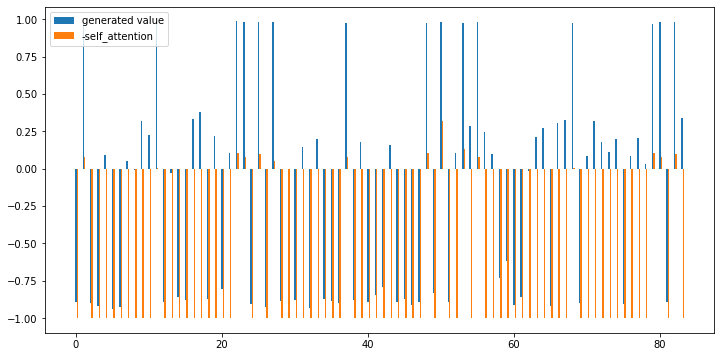

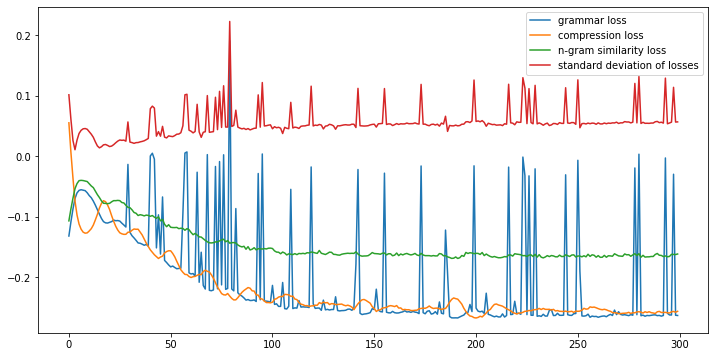

g 3.2215 	s 0.9459 	c 0.4150, score 2.3978, [bishop Fargo in North Dakota has exposed hundreds members in Grand and Jamestown to hepatitis virus late and October Health has of attended churches took communion and Bishop John Folda Catholic Diocese in Dakota has exposed hundreds of church members in Grand Forks and Jamestown to hepatitis A.]
g 4.6112 	s 0.9345 	c 0.4249, score 2.6280, [bishop Fargo in North Dakota has exposed hundreds members in Grand and Jamestown to hepatitis virus and October Health has of attended churches took communion and Bishop John Folda Catholic Diocese in Dakota has exposed hundreds of church members in Grand Forks and Jamestown to hepatitis A.]
g 2.0621 	s 0.9461 	c 0.4229, score 2.2127, [bishop Fargo in North Dakota exposed hundreds members in Grand and Jamestown to hepatitis virus late and October Health has of attended churches took communion and Bishop John Folda Catholic Diocese in Dakota has exposed hundreds of church members in Grand Forks and Jamesto

('bishop Fargo in North Dakota has exposed hundreds members in Grand and Jamestown to hepatitis virus and October Health has of attended churches took communion and Bishop John Folda Catholic Diocese in Dakota has exposed hundreds of church members in Grand Forks and Jamestown to hepatitis A.',
 2.6279578589796233,
 4.611238956451416)

In [263]:
logout = True
atten_rate = 0.2
similarity = 1.0
std_factor = 3.0
txt = """
The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A.
"""
#The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained bishops in Italy last month. Symptoms of hepatitis A include fever, tiredness, loss of appetite, nausea and abdominal discomfort. Fargo Catholic Diocese in North Dakota (pictured) is where the bishop is located.
#The judge agreed with police that he would have been over the limit at the time his red Citroen hit Miss Titley’s blue Daihatsu Cuore on a road near Yarmouth, Isle of Wight, on October 11, 2013. His phone records showed he was also texting around the time of the crash.

sam_wgan4(get_prepared_doc(sentences_dataset[0]),txt,epochs=300,display= True,retry = False,comp_rate= 1.5)

# 측정 도구...

In [40]:
!pip install rouge-score

In [41]:
from rouge_score import rouge_scorer

scorer = rouge_scorer.RougeScorer(['rouge1','rouge2', 'rougeL'], use_stemmer=True)

# 종합 Test

BESM Summary sentance length: 8
--------------------------------------------------
The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained bishops in Italy last month. The diocese announced on Monday that Bishop John Folda is taking time off after being diagnosed with hepatitis A. Fargo Catholic Diocese in North Dakota (pictured) is where the bishop is located.
--------------------------------------------------
Length ------------------------------------| 75
{0: -1.0, 1: -1.0, 2: 0.07276003062725067, 3: -1.0, 4: -1.0, 5: -1.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: -1.0, 12: -1.0, 13: 0.13494886457920074, 14: -1.0, 15: 0.12212468683719635, 16: -1.0, 17: -1.0, 18: 0.05919043719768524, 19: -1.0, 20: -1.0, 21: -1.0, 22: -1.0, 23: 0.26623885333538055, 24: 0.00859840214252472, 25: -1.0, 26: 0.100025

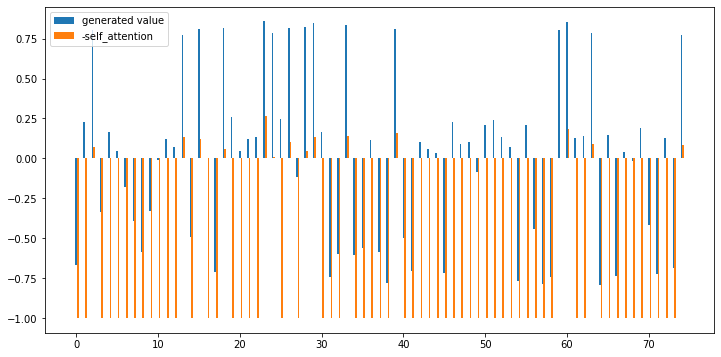

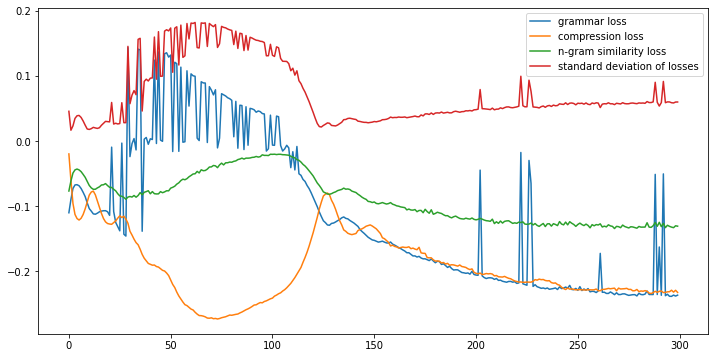

g 4.8024 	s 0.9806 	c 0.3664, score 2.6474, [state Health has issued for anyone who attended churches and communion and diocese says he contracted the infection contaminated food while conference ordained Italy and The diocese on Monday that John Folda is taking off with hepatitis A. Fargo Catholic in Dakota (pictured) is bishop located.]
g 4.5949 	s 0.9822 	c 0.3793, score 2.6273, [state Health has issued for anyone who attended churches and communion and diocese says he contracted the infection contaminated food while conference ordained Italy and The diocese on Monday that John is taking off with hepatitis A. Fargo Catholic in Dakota (pictured) is bishop located.]
g 5.5186 	s 0.9823 	c 0.4052, score 2.8072, [state Health has issued for anyone who attended churches and communion and diocese says he contracted the infection contaminated food while conference ordained Italy and The diocese on Monday that John Folda is taking off with hepatitis A. Fargo Catholic in Dakota is located.]
g

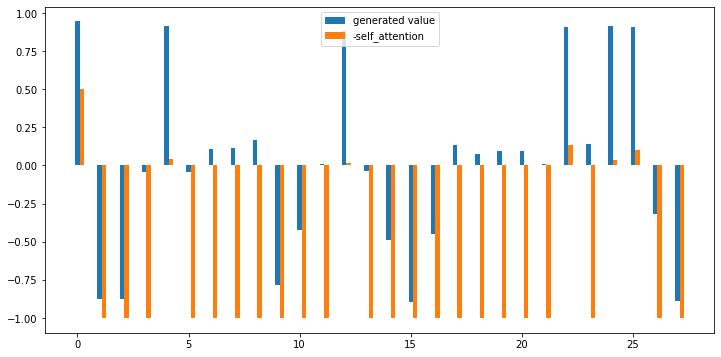

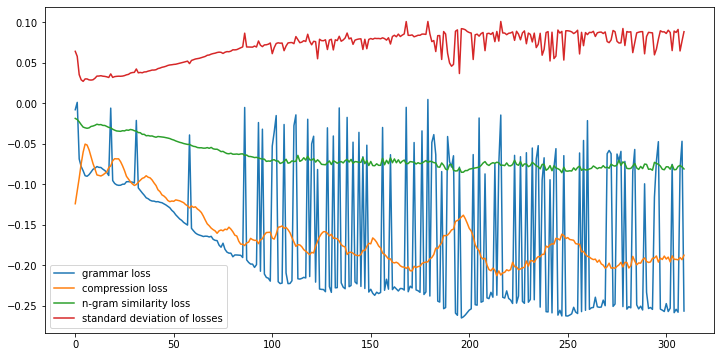

g 5.3446 	s 0.9434 	c 0.3902, score 2.7244, [State Manager Molly says the risk but officials feel alert to possible exposure and Associated Press]
g 5.3674 	s 0.9440 	c 0.2805, score 2.6191, [State Manager Molly Howell says the risk but officials feel alert people to the possible exposure and Associated Press]
g -4.3977 	s 0.7481 	c 0.7134, score 0.8018, [State Molly officials exposure Associated Press]
g -2.2000 	s 0.9609 	c 0.5793, score 1.5149, [State Molly risk but officials alert to exposure and Associated Press]
g -4.9917 	s 0.9420 	c 0.4634, score 1.0735, [State Molly the risk but officials feel alert the possible exposure and Associated Press]
g 3.9335 	s 0.9449 	c 0.3232, score 2.4236, [State Manager Molly says the risk but officials feel alert people to the possible exposure and Associated Press]
g -5.8313 	s 0.6383 	c 0.6890, score 0.4774, [State Molly the officials exposure Associated Press]
g -4.2090 	s 0.8593 	c 0.6159, score 1.0419, [State Manager Molly risk officials to

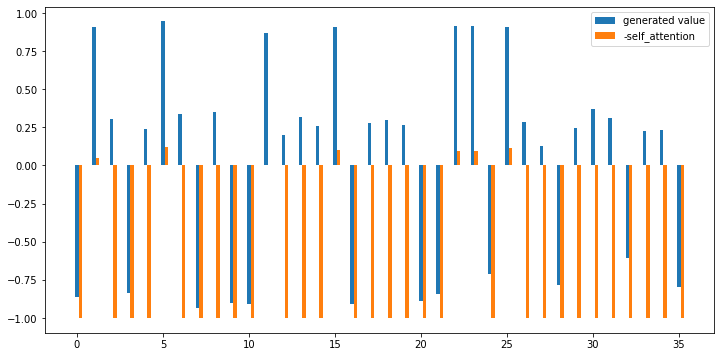

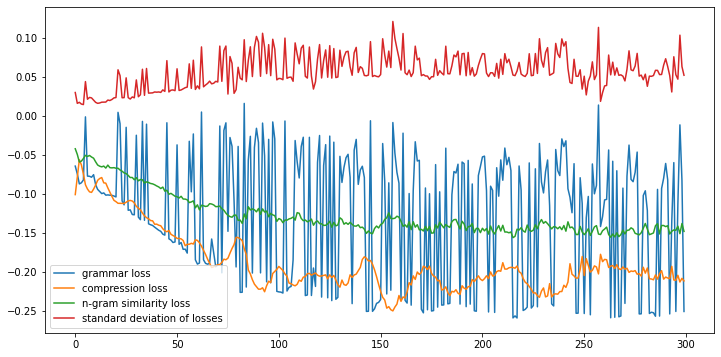

g 3.1298 	s 0.9760 	c 0.2804, score 2.2780, [bishop of Fargo Catholic Diocese North exposed potentially hundreds of church in Fargo Grand Jamestown to hepatitis A virus late September and October and]
g -5.7476 	s 0.5032 	c 0.6963, score 0.3490, [bishop Catholic exposed potentially church Jamestown to hepatitis]
g -5.6464 	s 0.5557 	c 0.6963, score 0.4184, [bishop Fargo Catholic exposed church Grand Jamestown to hepatitis]
g -5.8163 	s 0.5078 	c 0.7523, score 0.2861, [bishop Catholic exposed church Jamestown to hepatitis]
g 1.3672 	s 0.9708 	c 0.3178, score 2.0164, [bishop of Fargo Catholic Diocese North exposed potentially hundreds of church in Fargo Grand Jamestown to hepatitis A virus late September October]
g -3.8773 	s 0.9599 	c 0.5467, score 1.2669, [bishop of Catholic North exposed hundreds of church Jamestown to hepatitis late September October]
g -5.8053 	s 0.5448 	c 0.6682, score 0.4091, [bishop Catholic exposed potentially church Grand Jamestown to hepatitis]
g 3.3304 	s 0.9

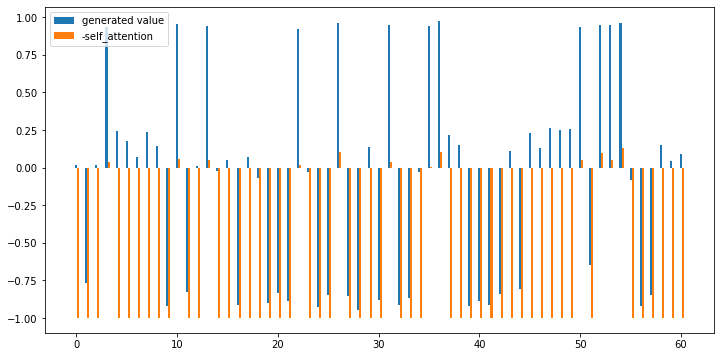

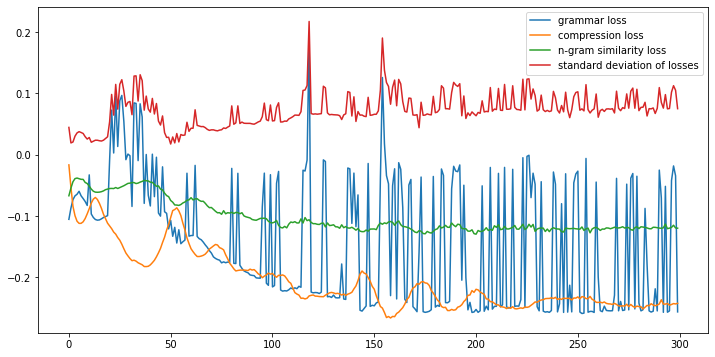

g 4.9651 	s 0.9595 	c 0.3588, score 2.6459, [Ultimately (organization) decided not to move forward with murder but Mata still received payment for meetings federal in and organization narcotics in New Jersey says The complaint also alleges that Mata his police badge for drug traffickers.]
g 2.3360 	s 0.9281 	c 0.4063, score 2.2238, [Ultimately (organization) decided not to move forward with murder but Mata received for meetings federal in and organization narcotics in Jersey says The complaint also alleges that Mata his police badge for drug traffickers.]
g -1.3435 	s 0.9327 	c 0.4617, score 1.6705, [Ultimately decided not to forward with murder but Mata payment meetings federal in and organization narcotics in New Jersey says The complaint also alleges that Mata his police badge for drug traffickers.]
g 4.7736 	s 0.9589 	c 0.3694, score 2.6239, [Ultimately (organization) decided not to move forward with murder but Mata still received payment for meetings federal in organization narcot

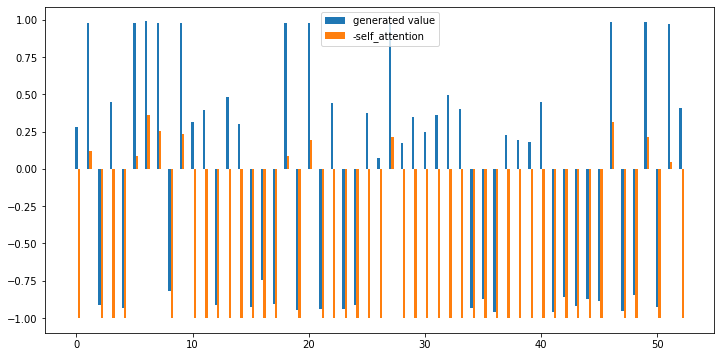

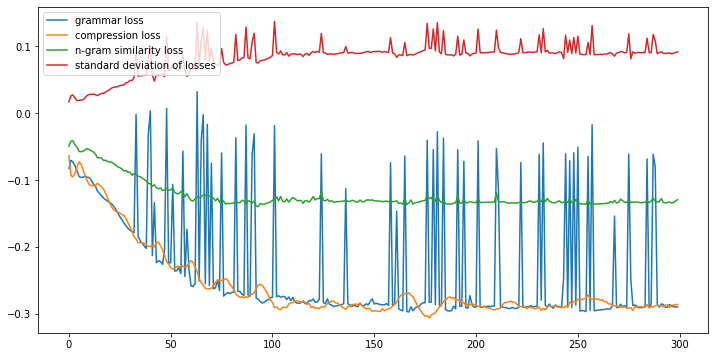

g 1.8151 	s 0.9714 	c 0.4061, score 2.1800, [The killers pose cops pulling over targets before shooting according to Outside office allege 45-year-old officer worked with a drug trafficking organization a murder plot Mata in Gardens Florida.]
g -3.6481 	s 0.9735 	c 0.4182, score 1.2837, [The killers cops pulling over targets before shooting according Outside office allege 45-year-old longtime officer worked with a drug trafficking organization a murder Mata in Gardens Florida.]
g 3.2561 	s 0.9708 	c 0.3667, score 2.3801, [The killers pose cops pulling over targets before shooting according to Outside office allege 45-year-old longtime officer worked with a drug trafficking organization a murder plot and Mata in Gardens Florida.]
g -2.4515 	s 0.9607 	c 0.4030, score 1.4552, [The killers pose cops pulling over targets before shooting according to Outside office 45-year-old longtime officer worked a drug trafficking organization a murder plot and Mata in Gardens Florida.]
g 2.3562 	s 0.97

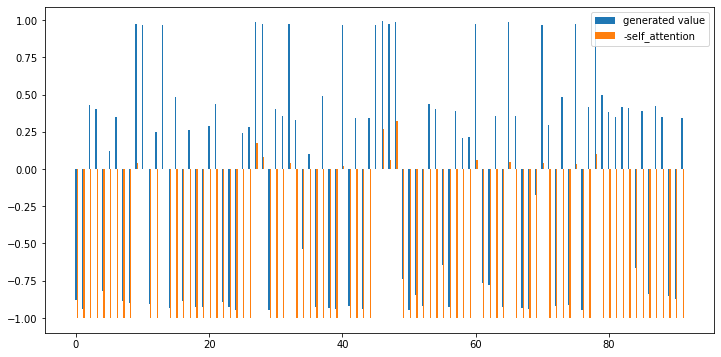

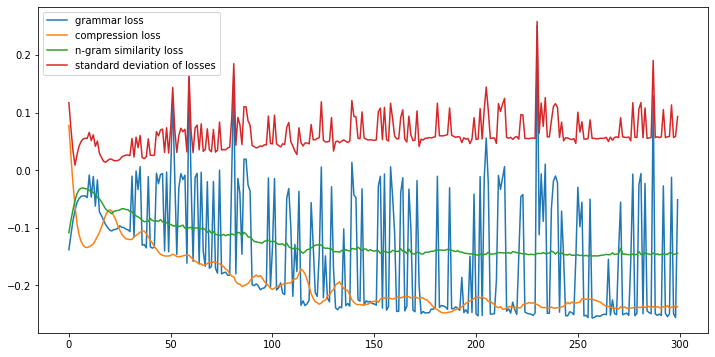

g -1.8888 	s 0.9251 	c 0.4461, score 1.5564, [released by do not name of drug trafficking with Mata but says been importing narcotics from such as Ecuador and Dominican by inside containers pallets of produce including bananas for Department since 1992 including in Gardens and lieutenant in K-9 at International Airport according to the complaint and convicted could face prison.]
g 2.1138 	s 0.9256 	c 0.4395, score 2.2174, [released by do not name of drug trafficking with Mata but says been importing narcotics from such as Ecuador and Dominican by inside containers pallets of produce including bananas for the Department since 1992 including in Gardens and lieutenant in K-9 at International Airport according to the complaint and convicted could face prison.]
g -3.8180 	s 0.9183 	c 0.4527, score 1.2347, [released by do not name of drug trafficking with Mata but says been importing narcotics from such as Ecuador and Dominican by inside containers pallets of produce including bananas the De

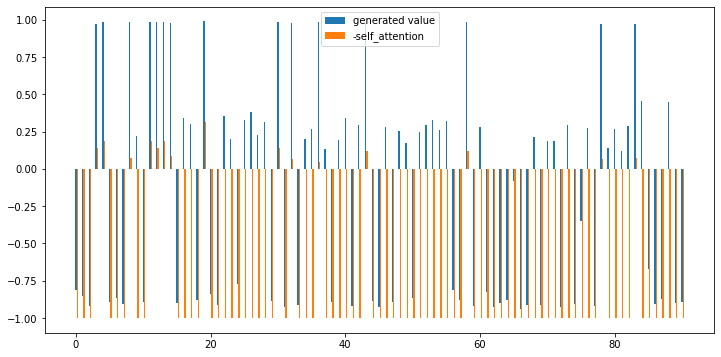

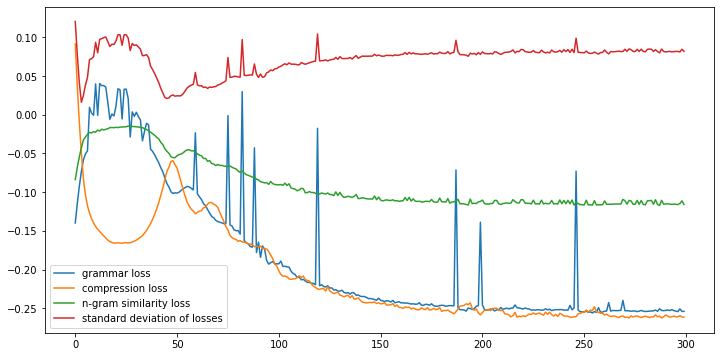

g 3.2905 	s 0.9595 	c 0.4257, score 2.4335, [his phone he was on his phone around time of collision highly likely would also have contributed his driving loss of control and case highlights how tragic of these offences be and This case highlights tragic consequences Eccleston-Todd Newport Isle Wight disqualified driving for years after which he will an]
g 3.6635 	s 0.9601 	c 0.4071, score 2.4777, [his phone he was on his phone around time of collision highly likely would also have contributed his driving loss of control and case highlights how tragic of these offences be and This case highlights tragic consequences can Eccleston-Todd Newport Isle Wight disqualified driving for eight years after which he will an]
g 3.9380 	s 0.9603 	c 0.4145, score 2.5312, [his phone he was on his phone around time of collision highly likely would also have contributed his driving loss of control and case highlights how tragic of these offences be and This case highlights tragic consequences Eccleston-T

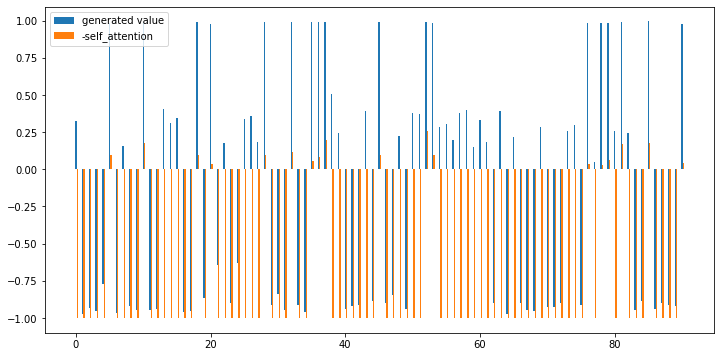

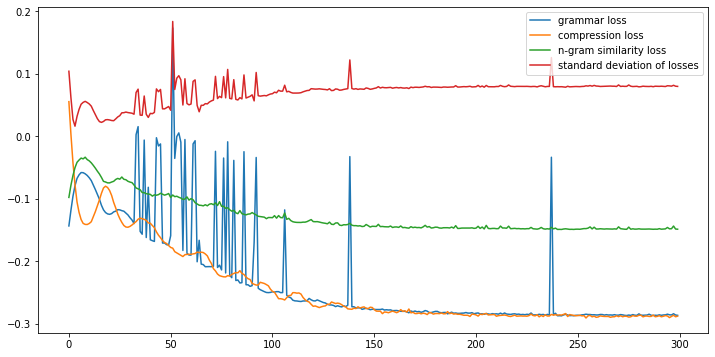

g 4.9785 	s 0.7832 	c 0.4749, score 2.5879, [‘Mr to up phone and either reading to text was that he failed to bend central white line into the Titley’s car hadnt left the pub to return home when the collision occurred at around 30pm I make before drinking alcohol and getting behind the wheel or phone road.]
g 3.8211 	s 0.7699 	c 0.4930, score 2.3997, [‘Mr to up phone and either reading to text was that he failed to bend central white line into the Titley’s car hadnt left the pub to return home when the collision at around 30pm I make before drinking alcohol and getting behind the wheel or phone road.]
g 3.6069 	s 0.7578 	c 0.4890, score 2.3479, [‘Mr to up phone and either reading to text was that he to bend central white line into the Titley’s car hadnt left the pub to return home when the collision occurred at around 30pm I make before drinking alcohol and getting behind the wheel or phone road.]
g 3.0708 	s 0.7775 	c 0.4950, score 2.2843, [‘Mr to up phone and either reading to text w

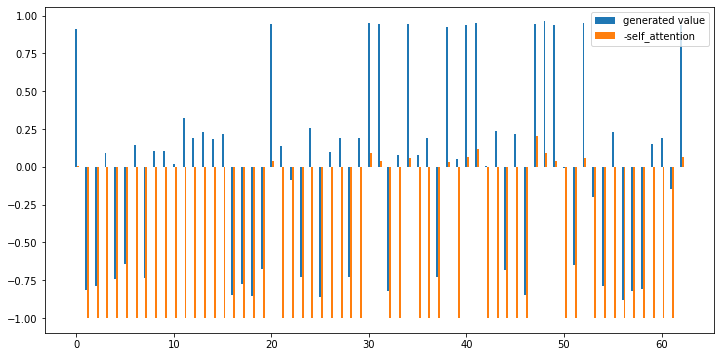

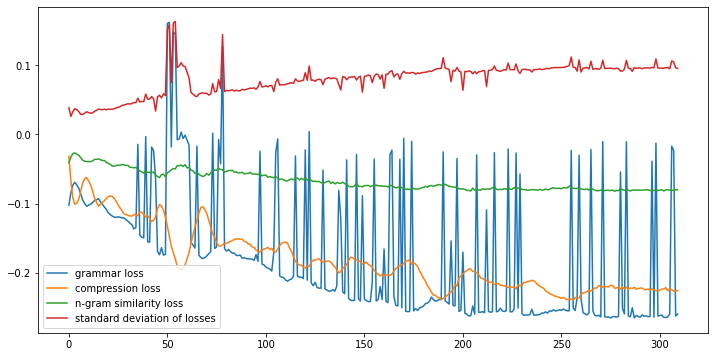

g 2.2045 	s 0.9362 	c 0.4080, score 2.2116, [Those to risk substantial time in prison Miss Titley from Cowes Wight also spent evening with friends pub had drunk any alcohol police said and had out with friends at pub that not had alcohol.]
g 4.4222 	s 0.9409 	c 0.3712, score 2.5491, [Those to risk a substantial time in prison and Miss Titley from Cowes Wight also spent evening with friends a pub but had drunk any alcohol police said and had out with friends at pub that not had alcohol.]
g 4.0308 	s 0.9387 	c 0.3773, score 2.4879, [Those to risk substantial time in prison and Miss Titley from Cowes Wight also spent evening with friends a pub but had drunk any alcohol police said and had out with friends at pub that not had alcohol.]
g 1.4635 	s 0.9403 	c 0.4018, score 2.0861, [Those risk a substantial time in prison and Miss Titley from Cowes Wight also spent evening with friends a pub had drunk any alcohol police said and had out with friends pub that not had alcohol.]
g 3.7882 	s 0.93

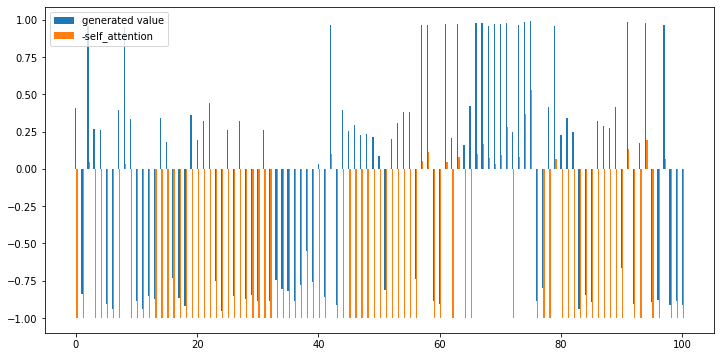

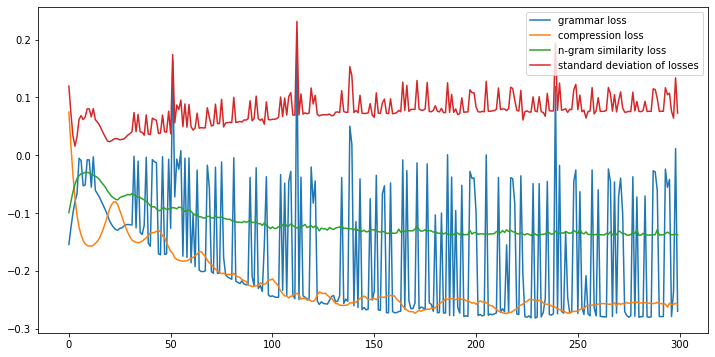

g 2.1784 	s 0.9714 	c 0.4259, score 2.2603, [And Putin flexes his open trade channels all to change the subject less and strategy EU chance to finally deal with some the unpleasant sides their patronage laundering and corruption which have inflated prize assets like London property and Picasso paintings for No one can afford to lifeline especially now with economy rebound one]
g 2.1356 	s 0.9821 	c 0.3931, score 2.2311, [And Putin flexes his open trade channels giving all to change the subject less and strategy lining: EU chance to finally deal some the more unpleasant sides their patronage laundering and corruption which have inflated prize assets like London property and Picasso paintings for No one can afford to lifeline especially now with economy the rebound one]
g 2.7205 	s 0.9786 	c 0.3810, score 2.3131, [And Putin flexes his open trade channels giving all to change the subject less and strategy lining: EU a chance to finally deal with some the more unpleasant sides their patron

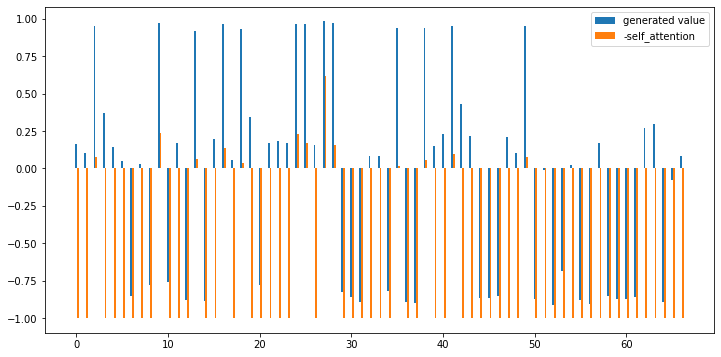

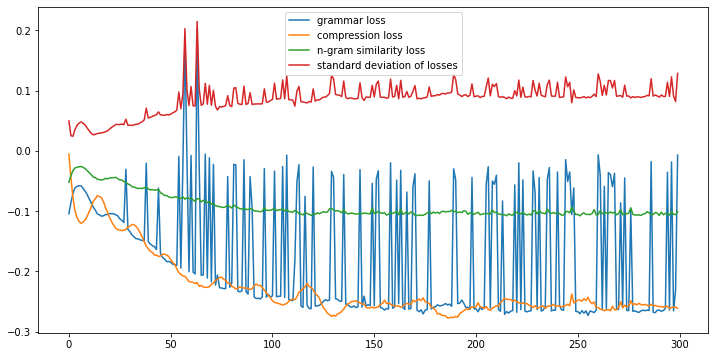

g 3.8002 	s 0.9795 	c 0.4585, score 2.5714, [As such EU leaders must be sanctions a street will hurt both sides and years Ukraines breakaway peninsula was signed away by Soviet Nikita Asset freezes and visa restrictions are for the EU a cumbersome legal and recourse.]
g 3.4257 	s 0.9730 	c 0.4341, score 2.4781, [As such EU leaders must be to sanctions a street will hurt both sides and years prior Ukraines breakaway peninsula was signed away by Soviet Nikita Asset freezes and visa restrictions for the EU they a cumbersome legal and recourse.]
g 3.2154 	s 0.9750 	c 0.4244, score 2.4353, [As such EU leaders must be to sanctions a street will hurt both sides and years prior Ukraines breakaway peninsula was signed away by Soviet Nikita Asset freezes and visa restrictions are for the EU they a cumbersome legal and recourse.]
g 3.7440 	s 0.9747 	c 0.4463, score 2.5450, [As such EU leaders must to sanctions a street will hurt both sides and years prior Ukraines breakaway peninsula was signed a

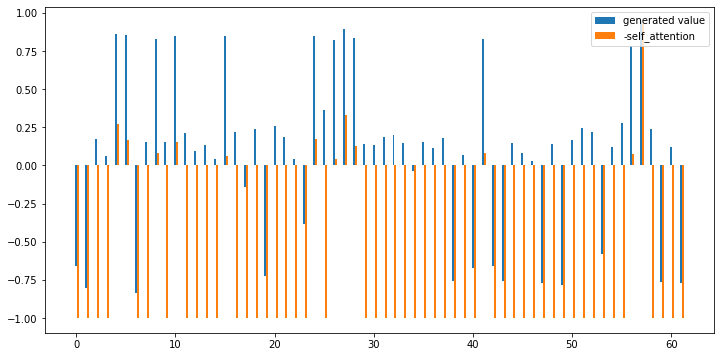

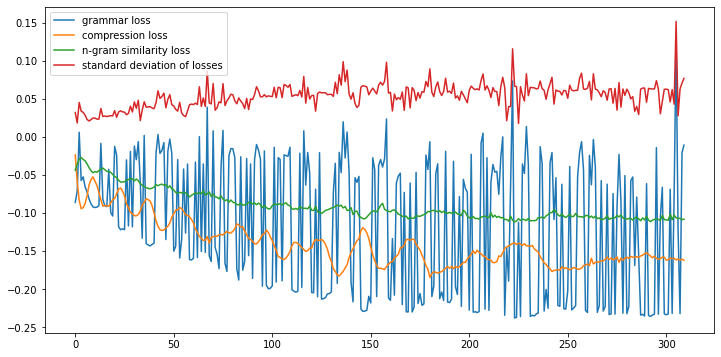

g 3.2879 	s 0.9867 	c 0.2290, score 2.2637, [that any trade war hurt Russia far harder than it would the EU - least 15% of the GDP comes from exports to the bloc and The logic of this is that who Russia it are essentially sides the coin and unlike Crimeas rushed referendum everyone a]
g 1.9662 	s 0.9718 	c 0.2710, score 2.0704, [that any trade war hurt Russia far harder than it would the EU - least 15% of the GDP comes from exports to the and The logic of this is that Russia it essentially sides the coin and unlike Crimeas rushed referendum everyone a]
g -4.2194 	s 0.9673 	c 0.4387, score 1.2028, [that any trade war hurt Russia far harder than the EU - least of GDP comes from exports to the bloc and The of this is who Russia it essentially sides and rushed referendum a]
g 3.0484 	s 0.9773 	c 0.3387, score 2.3240, [that trade war hurt Russia far harder than the EU least 15% of the GDP comes from exports to the bloc and The logic of this is that who Russia are sides coin and unlike Crime

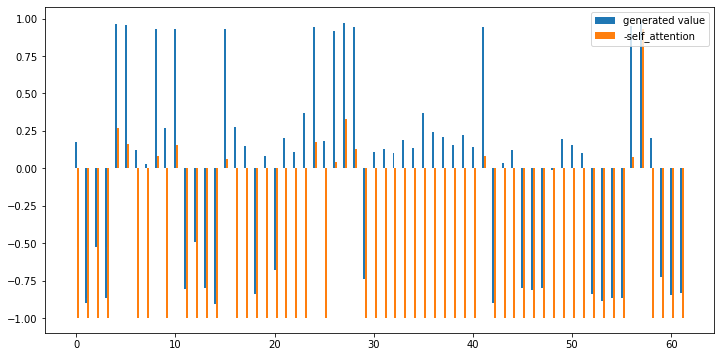

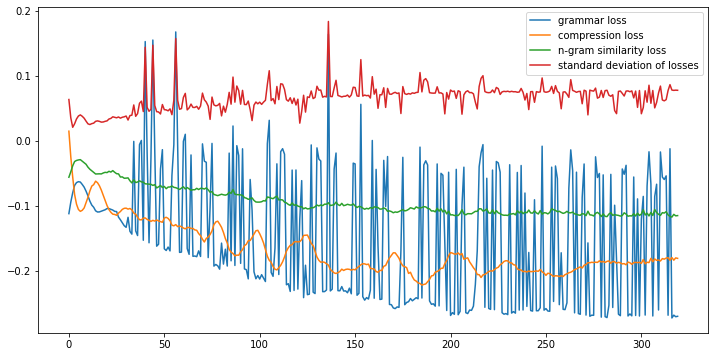

g 2.6339 	s 0.9824 	c 0.3645, score 2.2859, [Its trade war would hurt Russia far harder EU - not because of the formers GDP comes from exports to bloc and The logic of this is that those who run Russia own it of the rushed referendum everyone]
g 2.6369 	s 0.9809 	c 0.3290, score 2.2494, [Its trade war would hurt Russia far harder EU - not because of the formers GDP comes from exports to bloc and The logic of this is that those who run Russia own it sides of the coin rushed referendum everyone]
g -5.2077 	s 0.9882 	c 0.4581, score 1.0783, [Its trade war would hurt Russia far harder EU not of GDP comes from exports to bloc The logic of this is that who run Russia own sides of the rushed referendum everyone]
g 1.0312 	s 0.9743 	c 0.3677, score 2.0139, [Its trade war would hurt Russia far harder EU - not because of the formers GDP from exports to bloc and The logic of this is that those who run Russia own it of the coin rushed referendum everyone]
g 3.0614 	s 0.9822 	c 0.3452, score 2.3376

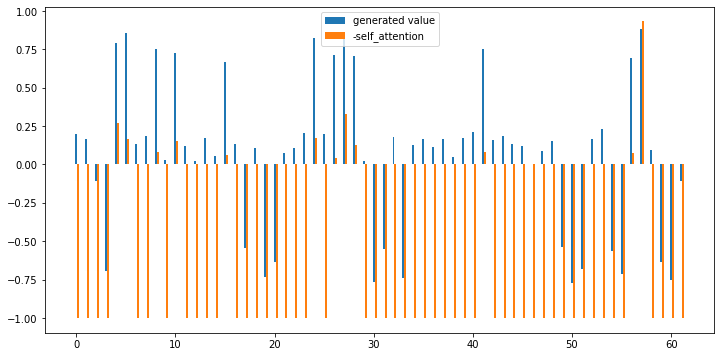

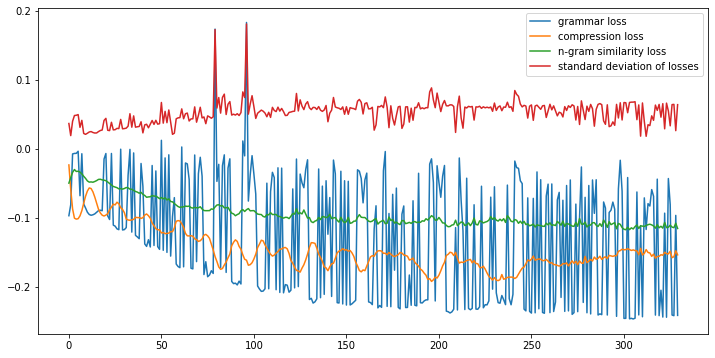

g 4.4159 	s 0.9875 	c 0.2871, score 2.5106, [Its that trade war would hurt Russia far harder than it would EU - least of the formers GDP comes from exports to the of this is that those who run Russia and own it are essentially two sides and Because rushed referendum]
g 4.9868 	s 0.9896 	c 0.2290, score 2.5497, [Its true that trade war would hurt Russia harder than it would the EU - least of the formers GDP comes from exports to the The of this is that those who run Russia and own it are essentially two sides and Because rushed referendum everyone]
g 5.3642 	s 0.9899 	c 0.2161, score 2.6001, [Its true that trade war would hurt Russia far harder than it would the EU - least of the formers GDP comes from exports to the The of this is that those who run Russia and own it are essentially two sides and Because rushed referendum everyone]
g -2.5424 	s 0.9801 	c 0.3387, score 1.3951, [true that trade war would hurt Russia harder than the EU - of the formers GDP comes from exports to the The of

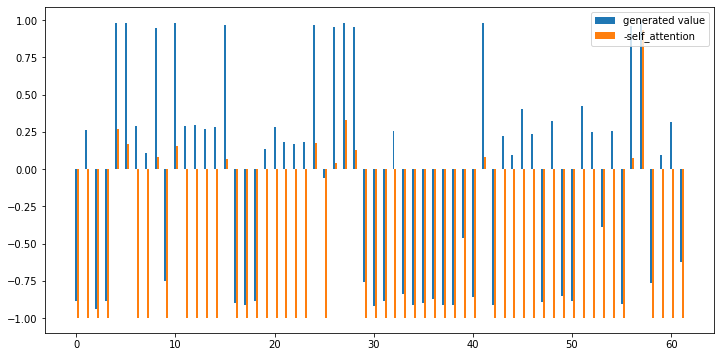

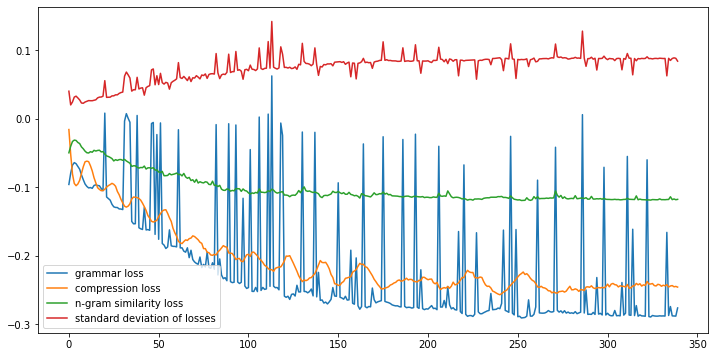

g 3.5587 	s 0.9274 	c 0.3516, score 2.3721, [true trade war would hurt Russia harder than it would the EU because 15% of the formers GDP comes from exports to The Russia own it are essentially sides coin and Because unlike rushed referendum has a]
g 3.9511 	s 0.9431 	c 0.3774, score 2.4790, [true trade war would hurt Russia harder than it would the EU because 15% of the formers GDP comes from exports to The Russia own it are essentially sides coin and unlike rushed referendum has a]
g 2.1403 	s 0.9455 	c 0.3871, score 2.1893, [true trade war would hurt Russia harder than it would the EU because 15% the formers GDP comes from exports to The Russia own it are essentially sides coin and unlike rushed referendum has a]
g -4.4324 	s 0.9475 	c 0.4710, score 1.1797, [true trade war hurt Russia harder than it would EU because 15% the GDP comes from exports to The Russia own it essentially sides coin and unlike rushed referendum a]
g 1.4956 	s 0.9251 	c 0.4000, score 2.0744, [true trade war wou

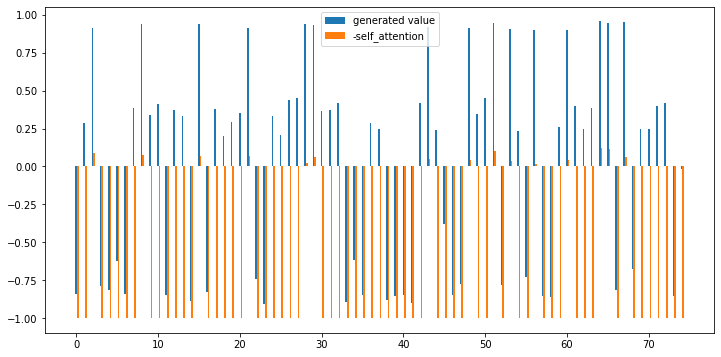

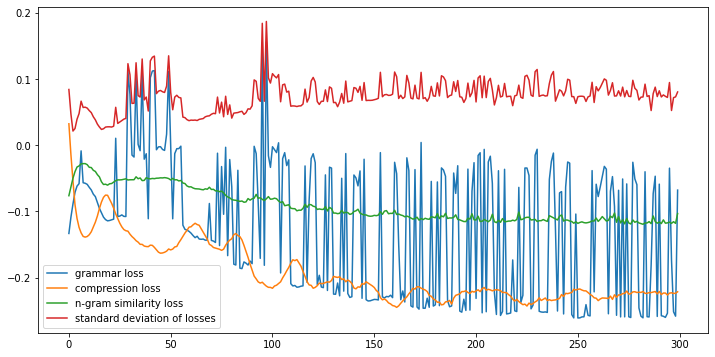

g -3.5534 	s 0.9748 	c 0.4237, score 1.3063, [striker Matt for Rochdale in the high-scoring affair Crewe hammered 5-2 Hanson first player to score against Crawley season after Joe Walsh and Fleetwood were teams to have won out of but four clubs - Peterborough City Chesterfield Crawley all hit their]
g 3.4990 	s 0.9689 	c 0.3576, score 2.4097, [striker Matt for Rochdale in the high-scoring affair Crewe hammered 5-2 and James Hanson first player to score against Crawley this season after Joe Walsh and Fleetwood were teams to have won out of but four clubs - Peterborough Bristol City Chesterfield Crawley all hit their first]
g 1.5127 	s 0.9702 	c 0.4009, score 2.1232, [striker Matt for Rochdale in the high-scoring affair Crewe hammered 5-2 and James Hanson player to score against Crawley this season after Joe Walsh and Fleetwood were teams to have won out of but four clubs - Bristol City Chesterfield Crawley all hit their first]
g -3.7978 	s 0.9676 	c 0.3986, score 1.2332, [striker Matt f

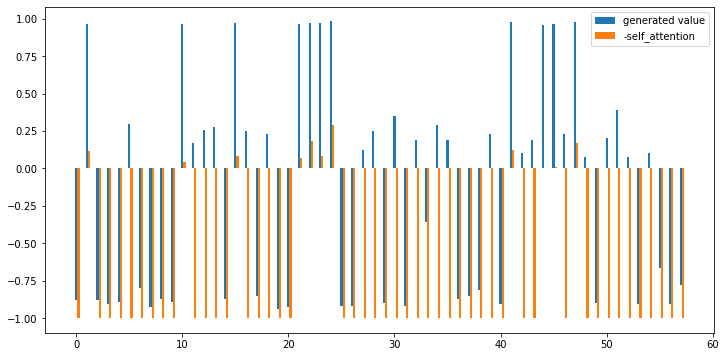

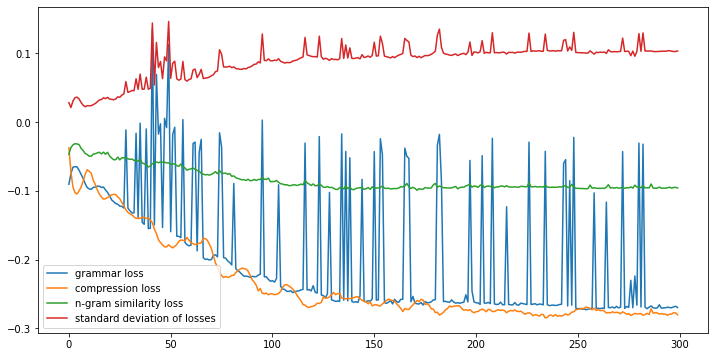

g 2.3256 	s 0.9134 	c 0.4199, score 2.2209, [Swindon a Stephen Bywater’s last-minute own and There plenty between Coventry and Barnsley a 2-2 four coming in and Crawley lost their unbeaten status while Bradford maintained thanks to a win]
g -3.0735 	s 0.8421 	c 0.4894, score 1.3192, [Swindon a Stephen Bywater’s last-minute and There plenty between Coventry and Barnsley a 2-2 with coming in and Crawley lost unbeaten status while Bradford thanks to win]
g 2.8997 	s 0.8791 	c 0.4048, score 2.2672, [Swindon a Stephen Bywater’s last-minute own and There plenty between Coventry and Barnsley a 2-2 with four coming in and Crawley lost their unbeaten status while Bradford maintained thanks to a win]
g 2.6141 	s 0.8620 	c 0.4381, score 2.2357, [Swindon a Stephen Bywater’s last-minute own and There plenty between Coventry and Barnsley a 2-2 with four coming in and Crawley lost their unbeaten status while Bradford thanks to a win]
g 2.8176 	s 0.9167 	c 0.4260, score 2.3123, [Swindon a Stephen Bywa

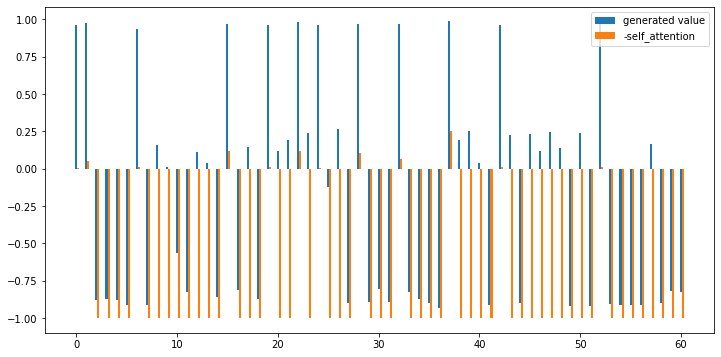

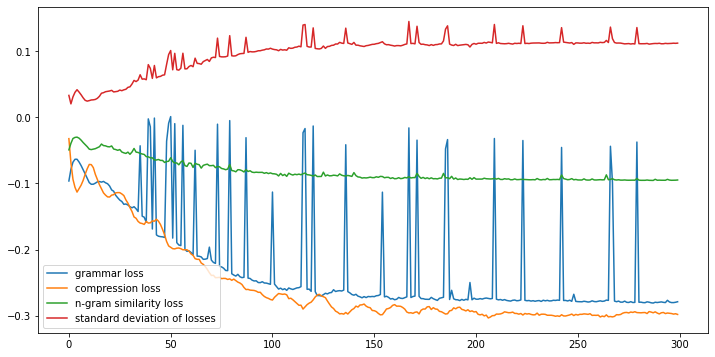

g 3.6550 	s 0.8721 	c 0.5000, score 2.4813, [Tom Bradshaw James gave the lead and County a home win over Colchester with Ronan and Noble Jose Blades a first-half lead although it later cancelled out by Brisley’s Ben six]
g 4.1377 	s 0.8588 	c 0.4799, score 2.5283, [Tom Bradshaw James gave the lead and County a home win over Colchester with Ronan Murray and Noble Jose Blades a first-half lead although it later cancelled out by Brisley’s Ben six]
g -2.3989 	s 0.7728 	c 0.5460, score 1.3270, [Tom Bradshaw James gave the lead and County a home win over Colchester with Ronan and Noble Jose Blades a although it later cancelled out by Brisley’s Ben six]
g 1.5760 	s 0.8133 	c 0.5144, score 2.0616, [Tom Bradshaw James gave the lead and County a home win over Colchester with Ronan and Noble Jose Blades a first-half although it later cancelled out by Brisley’s Ben six]
g -0.8426 	s 0.7766 	c 0.5086, score 1.6276, [Tom Bradshaw James gave the lead and County a home win over Colchester Ronan Murray

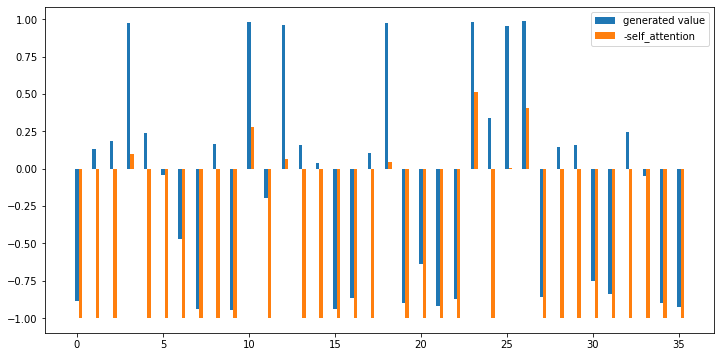

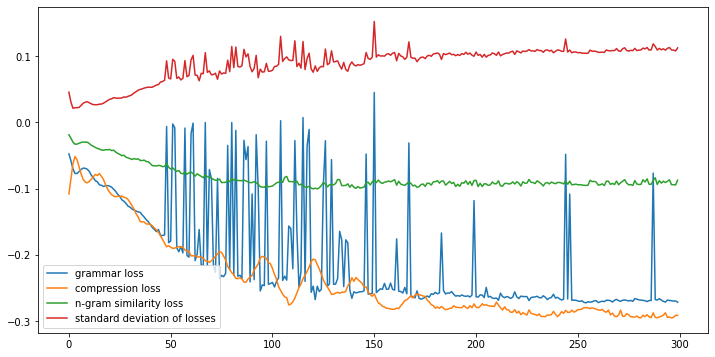

g 3.2557 	s 0.7522 	c 0.5079, score 2.2869, [the island in a 18th farmhouse retreat has been an Indonesian shirt and beige shorts a trip in]
g 3.5180 	s 0.8314 	c 0.4503, score 2.3680, [on the island in a 18th farmhouse and retreat has been an Indonesian shirt and beige shorts a trip in the]
g 3.3443 	s 0.7976 	c 0.4712, score 2.3262, [on the island in a 18th farmhouse retreat has been an Indonesian shirt and beige shorts a trip in the]
g 3.6047 	s 0.6993 	c 0.5079, score 2.2922, [on the island in farmhouse retreat has been an Indonesian shirt and beige shorts a trip in the]
g 3.8850 	s 0.9718 	c 0.4712, score 2.5906, [on the island in a 18th farmhouse and retreat has been an Indonesian shirt and beige shorts a trip in]
g 3.7348 	s 0.9636 	c 0.4921, score 2.5782, [on the island in a 18th farmhouse retreat has been an Indonesian shirt and beige shorts a trip in]
g 2.3288 	s 0.9668 	c 0.5079, score 2.3471, [on the island in a 18th farmhouse retreat has been Indonesian shirt and beige sho

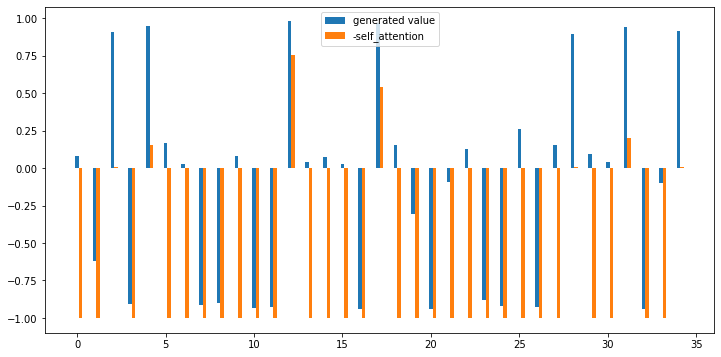

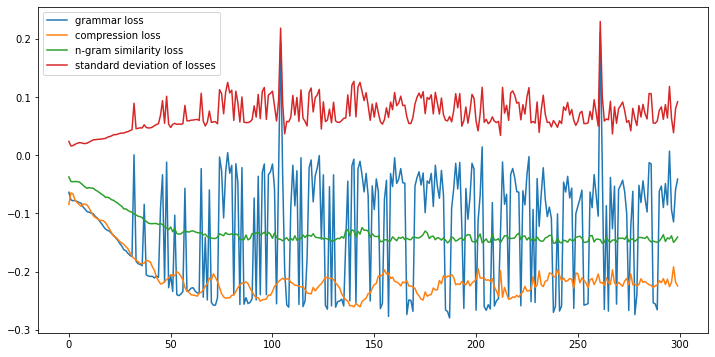

g -1.7342 	s 0.9511 	c 0.5896, score 1.5724, [Retread: Cameron Samantha yesterday socks smart shoes in Cameron trumped husband style.]
g 2.2348 	s 0.9393 	c 0.3019, score 2.1136, [Retread: Cameron Samantha yesterday and Minister socks with smart black shoes in one holiday look fashion Mrs Cameron trumped her husband the style.]
g 1.5435 	s 0.9484 	c 0.3208, score 2.0264, [Retread: Cameron Samantha yesterday and Minister socks with smart black shoes in holiday look fashion Mrs Cameron trumped her husband the style.]
g -3.8254 	s 0.9847 	c 0.4906, score 1.3377, [Cameron Samantha and Minister socks with black shoes look fashion Mrs Cameron trumped her husband the style.]
g -2.4506 	s 0.9532 	c 0.3632, score 1.4080, [Retread: Cameron Samantha yesterday Minister socks smart black shoes in one holiday look fashion Mrs Cameron trumped her husband style.]
g -1.5944 	s 0.9613 	c 0.3396, score 1.5352, [Retread: Cameron Samantha yesterday and Minister socks with smart black shoes in holiday look 

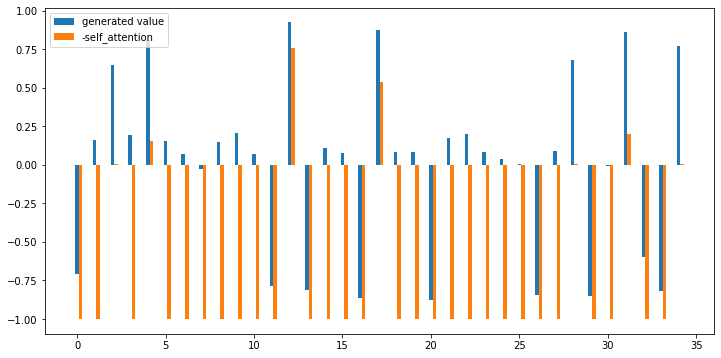

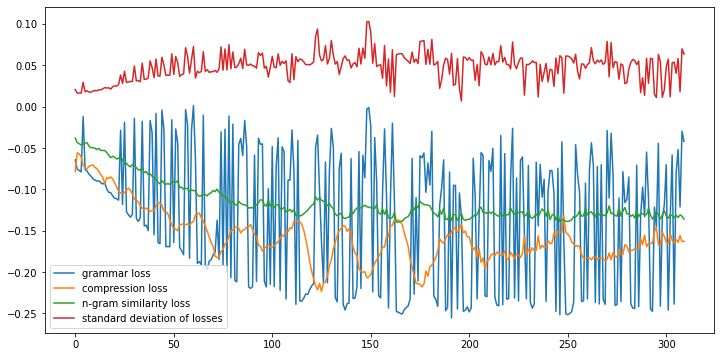

g -5.4887 	s 0.9663 	c 0.6509, score 0.9006, [Cameron Samantha sported socks smart shoes one ever Cameron husband style.]
g 1.8483 	s 0.9704 	c 0.2453, score 2.0238, [David Cameron with Samantha yesterday and The Prime Minister sported socks smart black shoes in one holiday look and ever fashion Mrs Cameron her husband style.]
g -4.8071 	s 0.9597 	c 0.7311, score 0.9274, [Cameron Samantha socks black shoes Cameron husband style.]
g 3.7578 	s 0.9724 	c 0.3160, score 2.4148, [David Cameron with Samantha yesterday and The Prime Minister sported socks smart shoes in one holiday look and fashion Mrs Cameron husband style.]
g -5.5946 	s 0.9722 	c 0.7594, score 0.7803, [Cameron Samantha socks shoes Cameron husband style.]
g -5.2991 	s 0.8826 	c 0.5094, score 0.9900, [Cameron Samantha yesterday The Prime sported socks black shoes in one holiday and Cameron husband style.]
g -2.5016 	s 0.9677 	c 0.3160, score 1.3668, [David Cameron with Samantha yesterday and The Prime sported socks black shoes

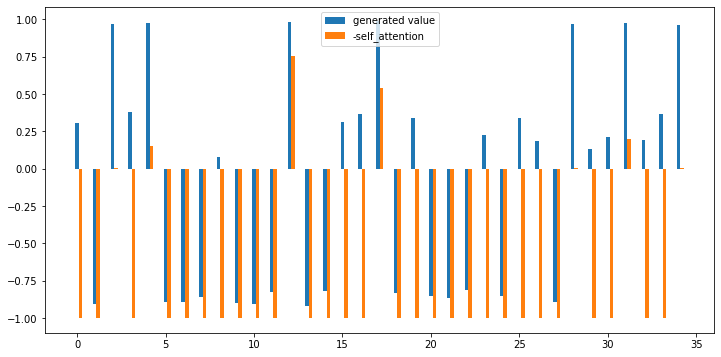

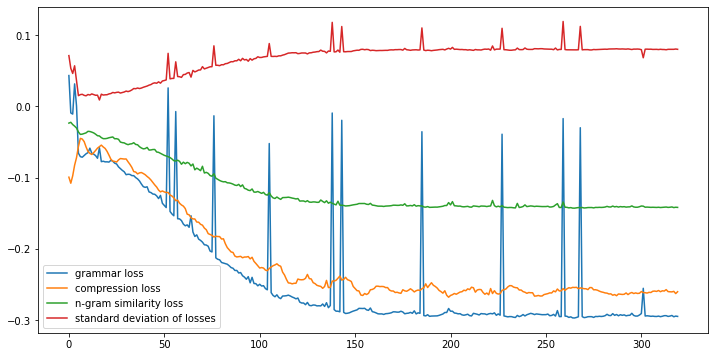

g 2.6107 	s 0.9829 	c 0.3962, score 2.3142, [Retread: Cameron with Samantha Prime socks black work shoes one and fashion consultant Cameron trumped her husband in the style.]
g 3.0933 	s 0.9809 	c 0.4151, score 2.4116, [Retread: Cameron with Samantha Prime socks black work shoes one fashion consultant Cameron trumped her husband in the style.]
g 2.7109 	s 0.9819 	c 0.4387, score 2.3724, [Retread: Cameron Samantha Prime socks black work shoes one fashion consultant Cameron trumped her husband in the style.]
g 1.7975 	s 0.9866 	c 0.4198, score 2.2060, [Retread: Cameron Samantha Prime socks black work shoes one and fashion consultant Cameron trumped her husband in the style.]
g 2.2998 	s 0.9727 	c 0.4151, score 2.2711, [Retread: Cameron with Samantha Prime socks black work shoes one and fashion consultant Cameron trumped her husband in style.]
요약률 0.4151 유사성 0.9809 문법성 3.0933 요약 [Retread: Cameron with Samantha Prime socks black work shoes one fashion consultant Cameron trumped her husband

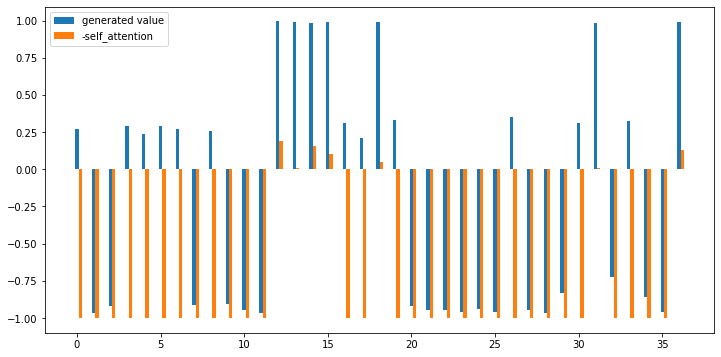

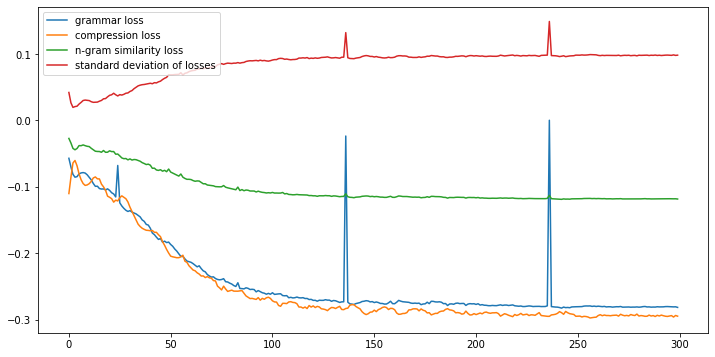

g 2.8237 	s 0.8936 	c 0.4481, score 2.3123, [The holidaying in Lanzarote the eastern stakes wearing an elegant black maxi dress and accused a fashion pas holiday.]
요약률 0.4481 유사성 0.8936 문법성 2.8237 요약 [The holidaying in Lanzarote the eastern stakes wearing an elegant black maxi dress and accused a fashion pas holiday.]
재시도 max score:2.312332455842 grammar:2.8237059116363525 text:The holidaying in Lanzarote the eastern stakes wearing an elegant black maxi dress and accused a fashion pas holiday.
--------------------------------------------------
The Camerons are holidaying in Lanzarote the most eastern Canary Island. stakes wearing an elegant black maxi dress and emerald green cardigan. Hes been accused of making many a fashion faux pas while on holiday.
--------------------------------------------------
Length ------------------------------------| 37
{0: -1.0, 1: -1.0, 2: -1.0, 3: -1.0, 4: -1.0, 5: -1.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: -1.0, 12: 0.19112497568130493, 13

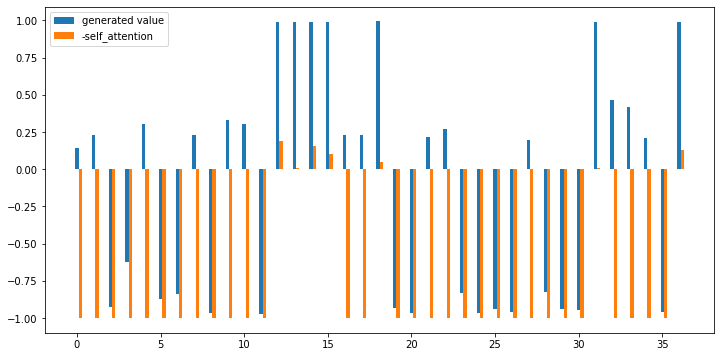

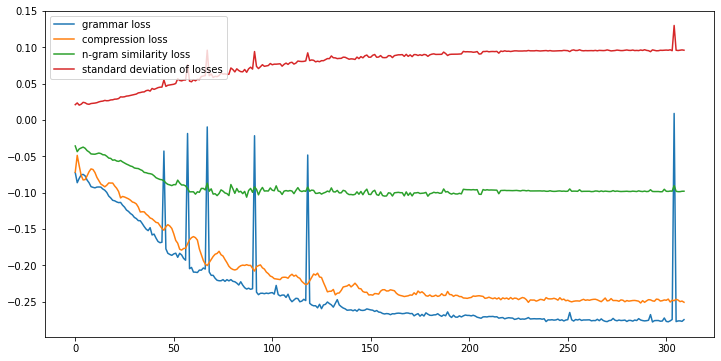

g 2.9567 	s 0.9821 	c 0.4009, score 2.3758, [The Camerons in most Canary Island stakes wearing an elegant black maxi dress green cardigan of fashion faux pas while holiday.]
g 3.7570 	s 0.9795 	c 0.4292, score 2.5349, [The Camerons in most Canary Island stakes wearing an elegant black maxi dress cardigan of fashion faux pas while holiday.]
g 2.8507 	s 0.9808 	c 0.4245, score 2.3805, [The Camerons in most Canary Island stakes wearing an elegant black dress green cardigan of fashion faux pas while holiday.]
g 3.4378 	s 0.9528 	c 0.4528, score 2.4786, [The Camerons in most Canary Island stakes wearing an elegant black maxi dress cardigan of fashion pas while holiday.]
요약률 0.4292 유사성 0.9795 문법성 3.7570 요약 [The Camerons in most Canary Island stakes wearing an elegant black maxi dress cardigan of fashion faux pas while holiday.]
--------------------------------------------------
The Camerons in most Canary Island stakes wearing an elegant black maxi dress cardigan of fashion faux pas while ho

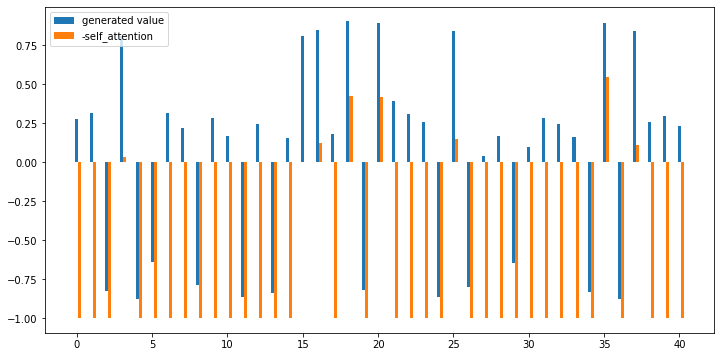

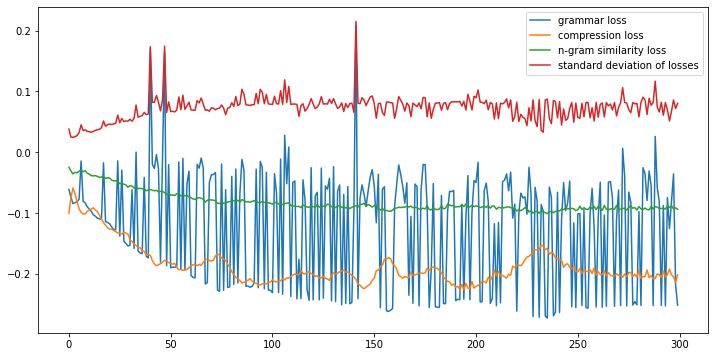

g 3.1858 	s 0.9830 	c 0.2287, score 2.2426, [He and Cookie devastated by diagnosis and about 1 million Americans are living Johnson admitted that when teams told him results had revealed he HIV 1991 he was devastated.]
g -2.0362 	s 0.9718 	c 0.2870, score 1.4194, [He and Cookie devastated by diagnosis and about 1 million Americans are living Johnson admitted that when teams told results had he HIV 1991 he was devastated.]
g -5.9147 	s 0.9070 	c 0.5785, score 0.8428, [and Cookie diagnosis 1 million Americans living Johnson when teams him results had he HIV 1991]
g 1.8057 	s 0.9773 	c 0.2422, score 2.0204, [and Cookie devastated by diagnosis and about 1 million Americans are living Johnson admitted that when teams told him results had revealed he HIV 1991 he was devastated.]
g -1.5620 	s 0.9746 	c 0.2735, score 1.4878, [He and Cookie devastated by diagnosis about 1 million Americans are living Johnson admitted that when teams told him results had revealed HIV 1991 was devastated.]
g -5.9

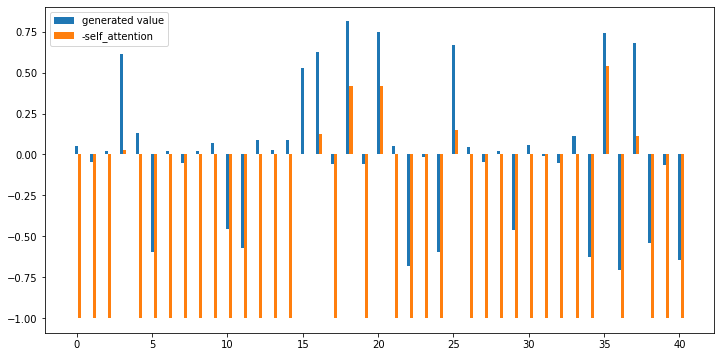

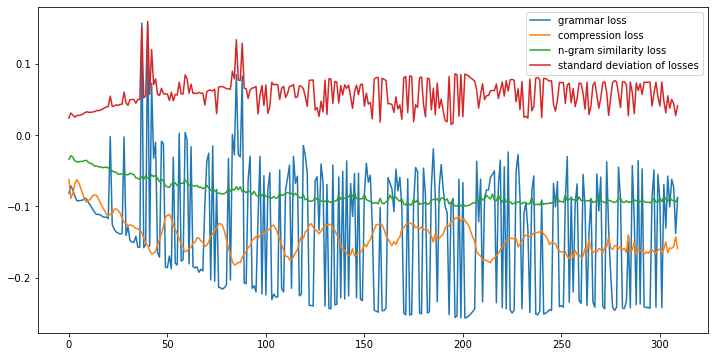

g 3.4401 	s 0.9160 	c 0.2152, score 2.2046, [He and wife Cookie left devastated by the diagnosis about 1 1 million Americans are living and Johnson admitted when teams doctor told him results had revealed he HIV 1991 was]
g 0.3467 	s 0.8894 	c 0.2870, score 1.7342, [He wife Cookie left devastated by the about 1 million Americans are living and Johnson admitted when teams doctor told him results had revealed he HIV 1991 was]
g 2.3619 	s 0.9080 	c 0.2735, score 2.0752, [He and wife Cookie left devastated by the diagnosis 1 1 million Americans are living and Johnson admitted when teams told him results had revealed he HIV 1991 was]
g 5.6643 	s 0.9183 	c 0.2915, score 2.6539, [He and wife Cookie devastated by the diagnosis about 1 million Americans are living and Johnson admitted when teams told him results had revealed HIV 1991 was]
g -3.5174 	s 0.8726 	c 0.3408, score 1.1272, [He wife Cookie left devastated by the diagnosis 1 million Americans living and Johnson admitted when teams docto

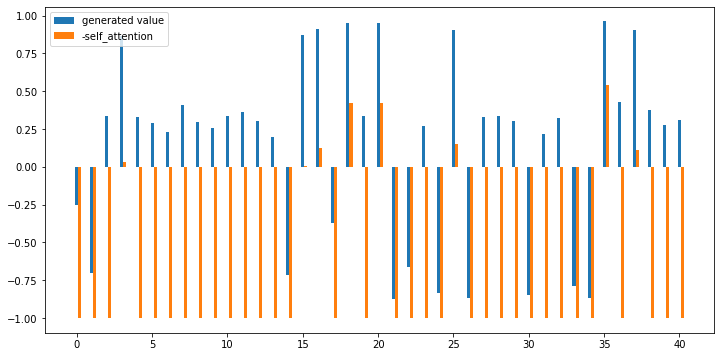

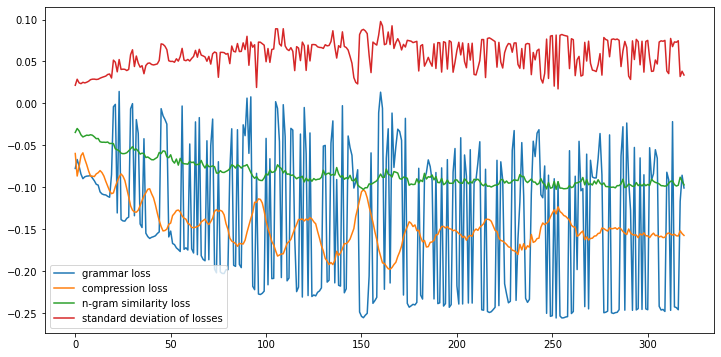

g 5.5782 	s 0.9735 	c 0.2108, score 2.6140, [wife Cookie left were devastated by the diagnosis and Overall about 1 million Americans living and Johnson when teams told him blood had revealed HIV in 1991 he was devastated.]
g -2.1365 	s 0.9469 	c 0.3094, score 1.4002, [wife Cookie left were by the diagnosis and Overall million Americans living and Johnson when teams told him blood had revealed HIV in 1991 was devastated.]
g 1.8744 	s 0.9789 	c 0.2332, score 2.0245, [wife Cookie left were devastated by the diagnosis and Overall about million Americans living and Johnson when teams told him blood had revealed HIV 1991 he was devastated.]
g -5.7463 	s 0.9314 	c 0.4978, score 0.9715, [Cookie left were by diagnosis and about million Americans living and Johnson teams told HIV 1991 was devastated.]
g -3.1795 	s 0.9718 	c 0.4305, score 1.3724, [Cookie left were by and about million Americans living and Johnson when teams told him blood had HIV in 1991 he was devastated.]
g 4.4514 	s 0.9692 	c 

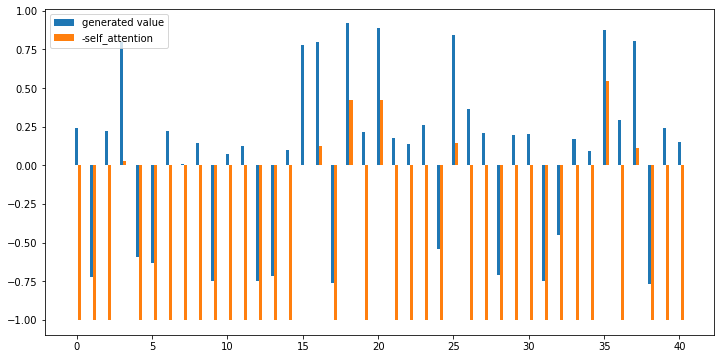

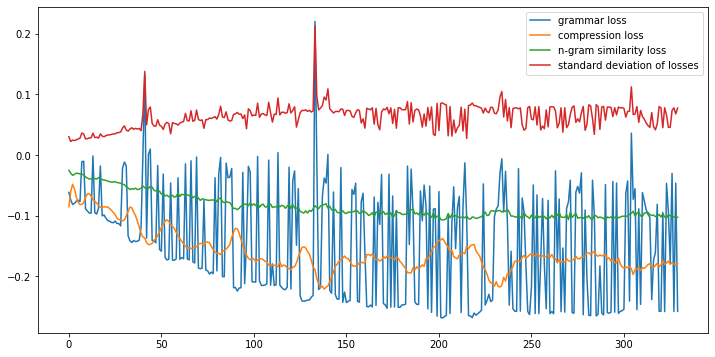

g 3.0432 	s 0.9682 	c 0.2422, score 2.2176, [He wife Cookie devastated by the and Overall 1 million Americans living and Johnson admitted that when teams doctor told blood results he had HIV in 1991 was devastated.]
g 2.9451 	s 0.9613 	c 0.2691, score 2.2212, [He wife Cookie devastated by the and Overall 1 million Americans living and Johnson admitted that when teams doctor told results he had HIV in 1991 was devastated.]
g -5.9118 	s 0.7107 	c 0.6771, score 0.5482, [wife Cookie million Americans living Johnson teams told had HIV 1991 was]
g 5.2000 	s 0.9664 	c 0.2691, score 2.6021, [He wife Cookie devastated by the Overall million Americans living and Johnson admitted that when teams doctor told blood results he had HIV in 1991 was devastated.]
g -5.8587 	s 0.9566 	c 0.4484, score 0.9286, [He Cookie devastated Overall million Americans living Johnson that when teams doctor results he had HIV in 1991 devastated.]
g 2.1124 	s 0.9534 	c 0.3184, score 2.1238, [wife Cookie devastated by th

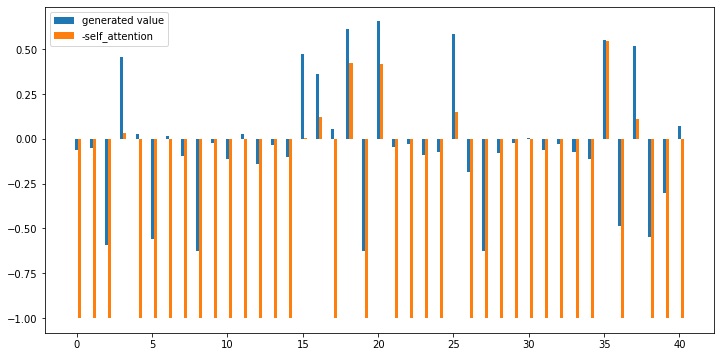

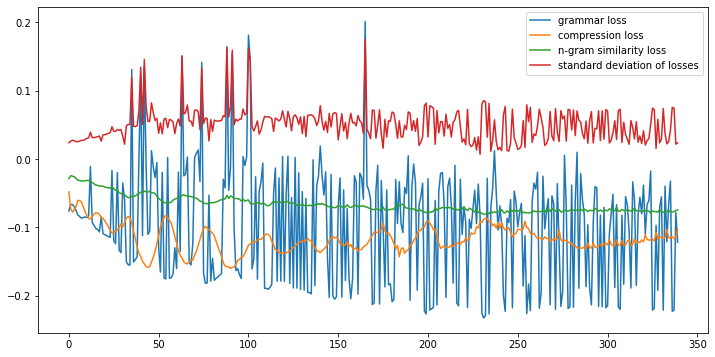

g 0.8994 	s 0.9799 	c 0.1390, score 1.7688, [He and Cookie left devastated by diagnosis and Overall about 1 1 million Americans are living Johnson admitted that when his teams doctor him blood results revealed he had HIV 1991 devastated.]
g 1.9493 	s 0.9825 	c 0.1211, score 1.9285, [He and Cookie left devastated by diagnosis and Overall about 1 1 million Americans are living Johnson admitted that when his teams doctor him blood results had revealed he had HIV 1991 devastated.]
g -5.8682 	s 0.9530 	c 0.4933, score 0.9682, [Cookie left Overall million Americans are living Johnson that when his teams doctor blood he HIV 1991 devastated.]
g -5.8461 	s 0.9647 	c 0.4574, score 0.9477, [and Cookie left devastated Overall 1 million Americans are living Johnson that teams had revealed he HIV 1991 devastated.]
g -2.9781 	s 0.9785 	c 0.1570, score 1.1391, [and Cookie left devastated by diagnosis and Overall about 1 1 million Americans are living Johnson admitted when his teams doctor him blood re

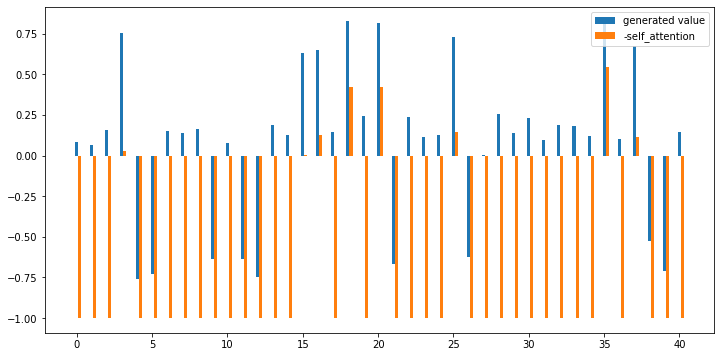

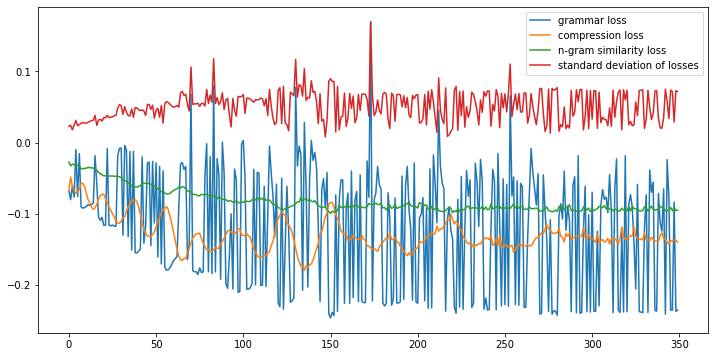

g 2.3894 	s 0.9769 	c 0.2287, score 2.1038, [He and wife Cookie devastated by the and 1 1 million Americans are living and Johnson that when his teams told him blood results had revealed he had HIV in 1991 devastated.]
g 1.7936 	s 0.9717 	c 0.2691, score 2.0397, [He and wife Cookie devastated by and 1 1 million Americans are living and Johnson that his teams told him blood results had revealed he had HIV in 1991 devastated.]
g -2.2054 	s 0.9755 	c 0.2825, score 1.3905, [He and wife Cookie devastated by the and 1 1 million Americans are living and Johnson that when his teams told him blood revealed he had HIV in 1991 devastated.]
g -0.9421 	s 0.9815 	c 0.2466, score 1.5711, [He wife Cookie devastated by the and 1 1 million Americans are living and Johnson that when his teams told him blood results had revealed he had HIV in 1991 devastated.]
g -1.9185 	s 0.9652 	c 0.3094, score 1.4549, [He and Cookie devastated by and 1 1 million Americans are living and Johnson that his teams told him 

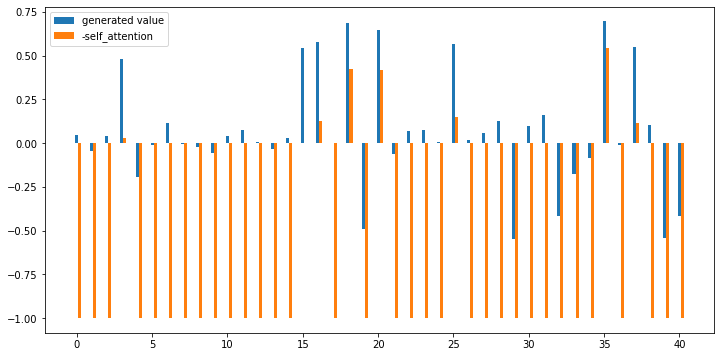

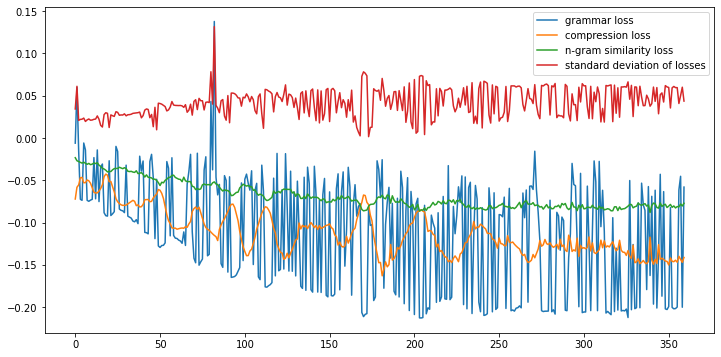

g 5.8503 	s 0.9250 	c 0.1659, score 2.5660, [He and wife Cookie were devastated by the diagnosis and Overall about 1 1 million Americans are living Johnson admitted that when his teams doctor told him results had had HIV in 1991 he]
g 5.1518 	s 0.9578 	c 0.2466, score 2.5630, [He and wife Cookie were devastated the diagnosis and Overall about 1 1 million Americans are living Johnson admitted that when his teams doctor told him had HIV in 1991]
g 5.4219 	s 0.9320 	c 0.2108, score 2.5464, [He and wife Cookie were devastated by the diagnosis and Overall 1 1 million Americans are living Johnson admitted that when his teams doctor told him results had HIV in 1991 he]
g 5.8818 	s 0.9225 	c 0.2422, score 2.6449, [He and Cookie were devastated by the diagnosis and about 1 1 million Americans are living Johnson admitted that when his teams doctor told him results had HIV in 1991 he]
g -5.5081 	s 0.6936 	c 0.7085, score 0.5670, [Cookie were about million Americans living Johnson teams HIV 1991]


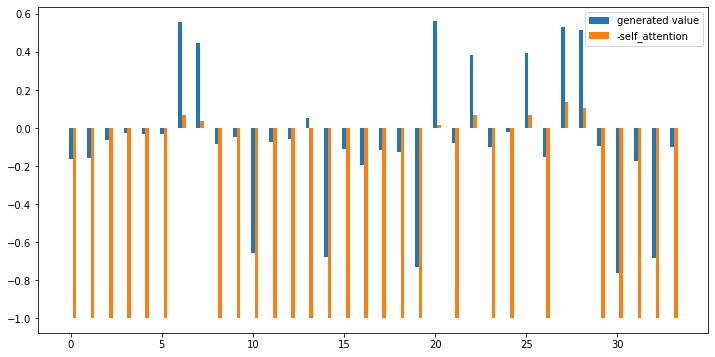

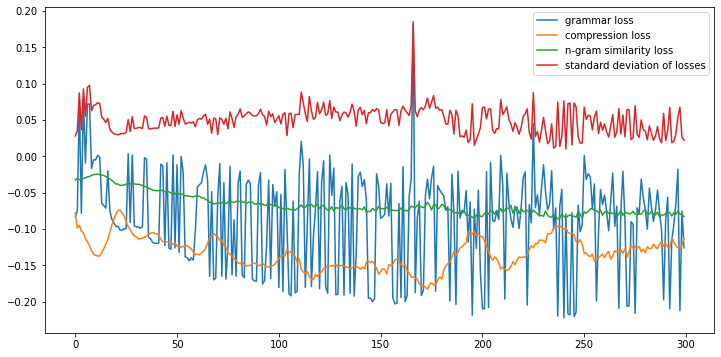

g -3.3903 	s 0.9246 	c 0.3317, score 1.1912, [disease so it was and His campaign earlier was awareness Orasure’s OraQuick HIV test and Cookie and Magic Johnson in St earlier year.]
g 4.1028 	s 0.9516 	c 0.2864, score 2.4219, [so it was very frightening and His campaign earlier month was to awareness Orasure’s HIV test and Cookie and Magic Johnson in St earlier year.]
g -5.8579 	s 0.6600 	c 0.8492, score 0.3344, [and His HIV and and Johnson in]
g 3.6405 	s 0.9777 	c 0.1558, score 2.2403, [disease so it was very frightening and His campaign earlier month was to awareness Orasure’s OraQuick HIV test and Support: Cookie and Magic Johnson in St earlier year.]
g -2.2089 	s 0.9663 	c 0.1910, score 1.2891, [disease so it very frightening and His campaign earlier month was awareness Orasure’s OraQuick HIV test and Support: Cookie and Magic Johnson in St earlier year.]
g 3.0708 	s 0.9349 	c 0.2161, score 2.1628, [so it was very frightening and His campaign earlier month was to about Orasure’s Or

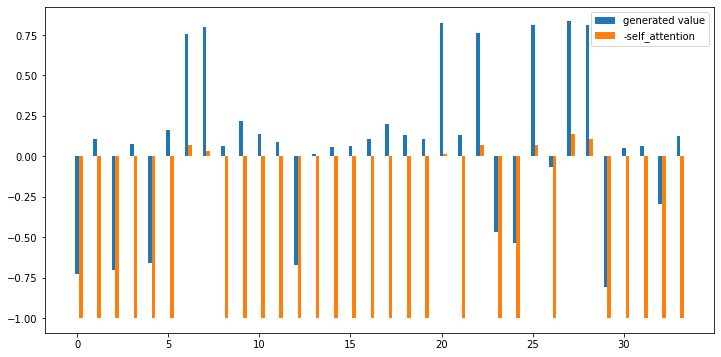

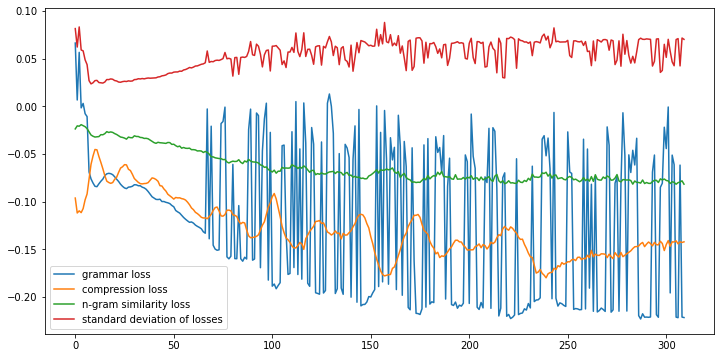

g 4.8252 	s 0.8755 	c 0.1910, score 2.3707, [so was frightening and His campaign earlier this month to raise awareness about Orasure’s OraQuick at-home HIV test and and Magic Johnson in Tropez earlier year.]
g 2.3204 	s 0.8985 	c 0.2814, score 2.0666, [so was and His campaign earlier this month to raise awareness about Orasure’s OraQuick at-home HIV test and and Johnson in Tropez earlier year.]
g -5.9015 	s 0.8806 	c 0.6533, score 0.7438, [and His campaign this awareness OraQuick HIV and and Johnson in year.]
g 3.6302 	s 0.8318 	c 0.2211, score 2.1579, [so was frightening and His campaign earlier this month to raise awareness about Orasure’s OraQuick at-home HIV test and and Johnson in Tropez earlier year.]
g 2.8756 	s 0.8918 	c 0.2864, score 2.1575, [was frightening and His campaign earlier this month to raise awareness about OraQuick at-home HIV test and and Johnson in Tropez earlier year.]
g 3.6842 	s 0.8474 	c 0.2613, score 2.2228, [so was frightening and His campaign earlier this 

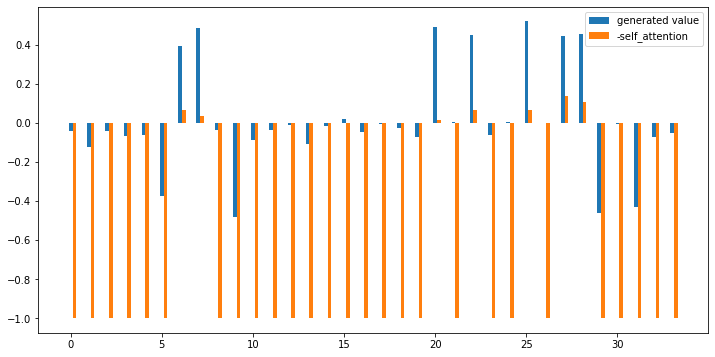

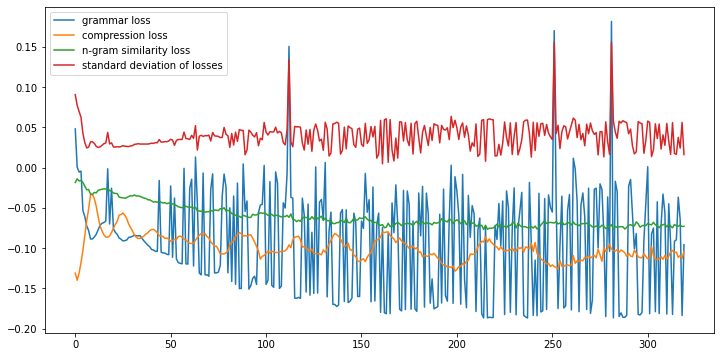

g 5.0121 	s 0.9298 	c 0.1256, score 2.3907, [disease so it was very and His campaign this month was to raise awareness about Orasure’s OraQuick at-home HIV test and Support: Cookie and Magic Johnson in Tropez this year.]
g -5.5369 	s 0.7937 	c 0.6784, score 0.6925, [disease and His awareness HIV test and and Magic Johnson in this]
g -5.5457 	s 0.8222 	c 0.5879, score 0.8099, [disease and His to awareness Orasure’s HIV test and Support: Cookie and Johnson in]
g -5.8548 	s 0.8762 	c 0.4523, score 0.8526, [disease it was very and His month was to raise awareness Orasure’s OraQuick HIV test and and Johnson in year.]
g 4.9107 	s 0.9651 	c 0.1910, score 2.4745, [disease so was very and His campaign this month was to raise awareness about OraQuick at-home HIV test and Support: Cookie and Magic Johnson in Tropez this year.]
g -3.4809 	s 0.8667 	c 0.2362, score 1.0228, [disease it was very and His campaign this month to raise about Orasure’s OraQuick at-home HIV and Support: Cookie and Magic Jo

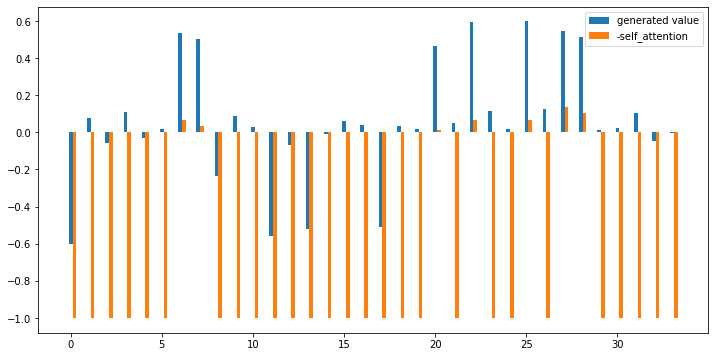

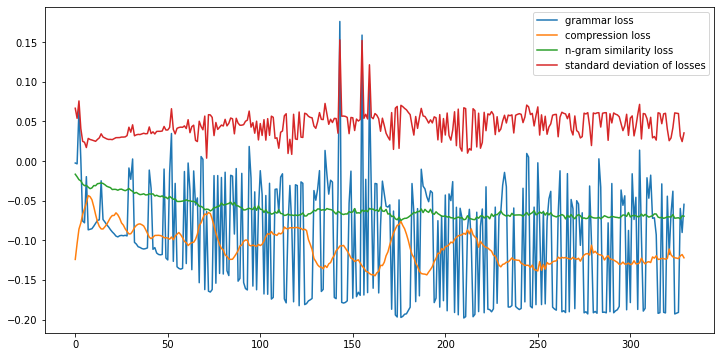

g -5.6145 	s 0.9065 	c 0.4774, score 0.9481, [very frightening and His raise awareness OraQuick at-home HIV test and Cookie and Johnson in Tropez this]
g 5.5599 	s 0.9771 	c 0.2161, score 2.6199, [so it was very frightening and His earlier was raise awareness about OraQuick HIV test and Support: Cookie and Magic Johnson in St Tropez earlier this year.]
g 4.1403 	s 0.9781 	c 0.1508, score 2.3189, [so it was very frightening and His earlier this was raise awareness about OraQuick at-home HIV test and Support: Cookie and Magic Johnson in St Tropez earlier this year.]
g 5.2865 	s 0.9831 	c 0.2462, score 2.6104, [so it was very frightening and His earlier was raise awareness about OraQuick HIV test and Support: Cookie and Johnson in St Tropez earlier this year.]
g -5.6333 	s 0.8604 	c 0.5075, score 0.9139, [was and His earlier awareness about OraQuick at-home HIV and Support: and Magic Johnson in earlier]
g -5.8745 	s 0.8676 	c 0.4322, score 0.8207, [very and His earlier was awareness about

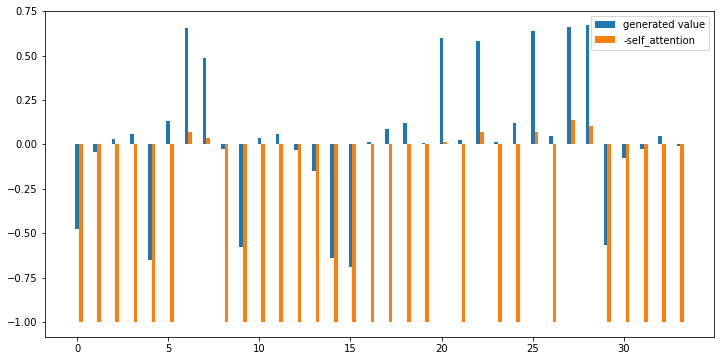

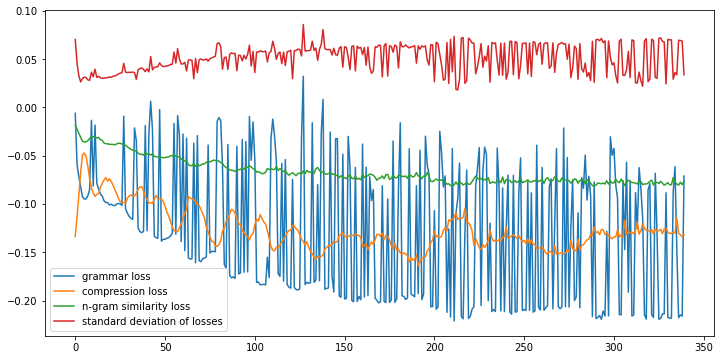

g 2.2018 	s 0.7590 	c 0.5628, score 2.0631, [it was frightening and His this about HIV and Cookie and Magic Johnson in earlier year.]
g 4.8993 	s 0.8803 	c 0.1709, score 2.3677, [so it was frightening and His campaign this month was to about Orasure’s OraQuick at-home HIV test and Support: Cookie and Magic Johnson in Tropez earlier this year.]
g 3.0914 	s 0.9102 	c 0.2714, score 2.1967, [so it was and His campaign month was about Orasure’s OraQuick at-home HIV test and Support: Cookie and Magic Johnson in Tropez earlier this year.]
g 5.8732 	s 0.8492 	c 0.2211, score 2.5492, [so it was frightening and His campaign this month was about Orasure’s OraQuick at-home HIV test and Support: Cookie and Magic Johnson in earlier this year.]
g -0.9854 	s 0.7552 	c 0.2764, score 1.3674, [so it was frightening and His this month about Orasure’s OraQuick at-home HIV test and Support: Cookie and Magic Johnson in Tropez earlier year.]
g 5.2554 	s 0.8800 	c 0.2161, score 2.4720, [so it was frightening a

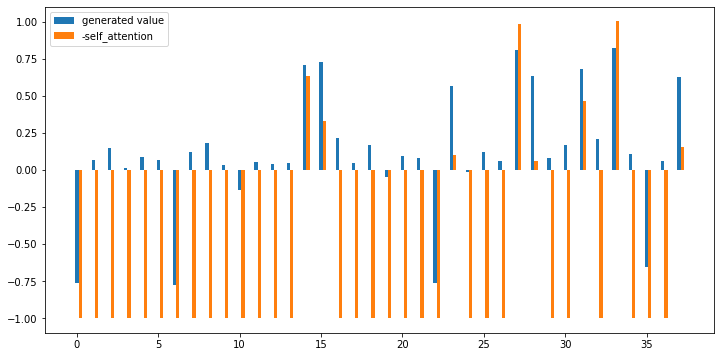

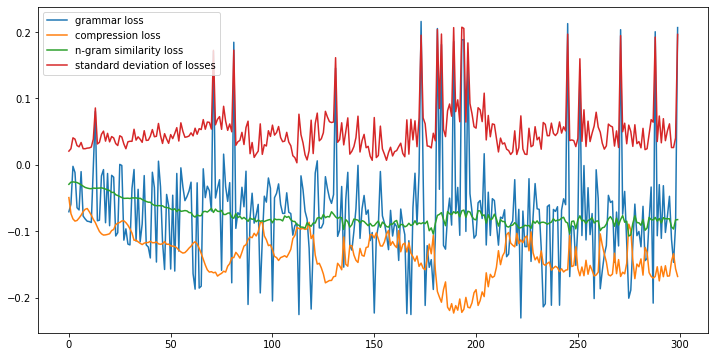

g 4.3965 	s 0.9860 	c 0.0753, score 2.2941, [still in denial that it happen to us and of the population black Americans account for about 44 per cent new and the same lifestyle who didn’t know they had HIV and to get.]
g -5.4895 	s 0.9766 	c 0.3871, score 0.9488, [denial happen to us and of the population black Americans for about 44 cent new and lifestyle who they HIV to get.]
g 3.5178 	s 0.9877 	c 0.1129, score 2.1869, [still in denial that it happen to us and of the population black Americans account for about 44 per cent new and the same lifestyle who know they had HIV and to get.]
g 1.8144 	s 0.9870 	c 0.1237, score 1.9131, [still in denial that it happen to us of the population black Americans account for about 44 per new and the same lifestyle who didn’t know they had HIV and to get.]
g -5.8733 	s 0.9830 	c 0.3441, score 0.8482, [still in happen to us of the population black Americans account about per new same lifestyle who know they HIV and to get.]
g 3.7771 	s 0.9794 	c 0.150

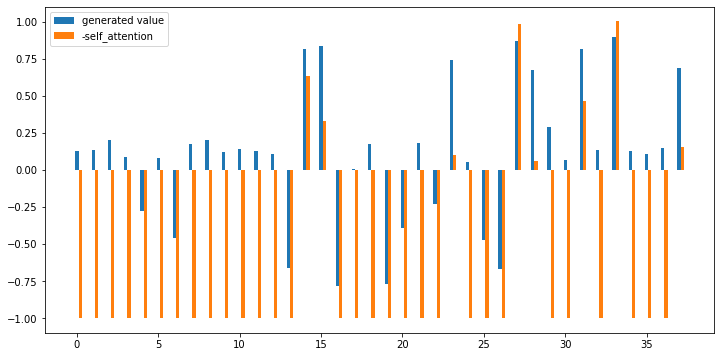

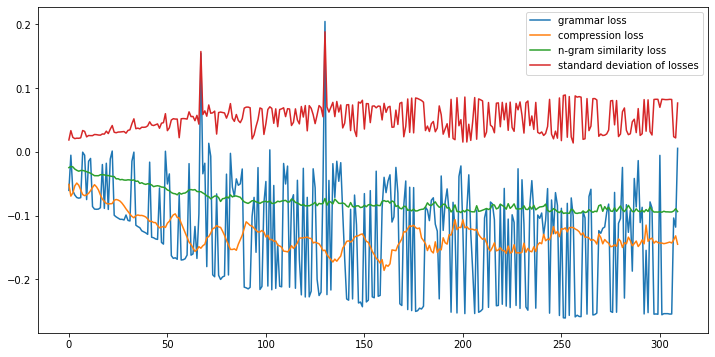

g 2.1381 	s 0.9641 	c 0.2204, score 2.0409, [we’re still in denial it happen to us and of the black Americans for about cent new and lifestyle who didn’t know they had HIV and needed to get.]
g 0.0431 	s 0.9777 	c 0.7097, score 1.7752, [black Americans new lifestyle who they had HIV to get.]
g -2.0196 	s 0.9660 	c 0.2581, score 1.3875, [we’re still in denial it happen to us and of the black Americans for about cent new and lifestyle who didn’t know they had HIV and to get.]
g 2.3151 	s 0.9753 	c 0.2527, score 2.1139, [we’re still in denial it happen to us and of the black Americans for cent new and lifestyle who didn’t know they had HIV and needed to get.]
g -5.8225 	s 0.9772 	c 0.6344, score 0.8724, [in denial it of black Americans cent new lifestyle who they HIV get.]
g 1.6674 	s 0.9786 	c 0.3333, score 2.0899, [still in denial it happen to us and of the black Americans new and lifestyle who didn’t know they had HIV and needed to get.]
g -3.8682 	s 0.9814 	c 0.4032, score 1.2399, [we

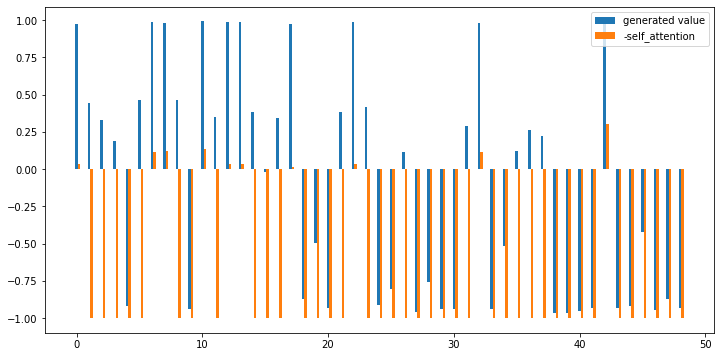

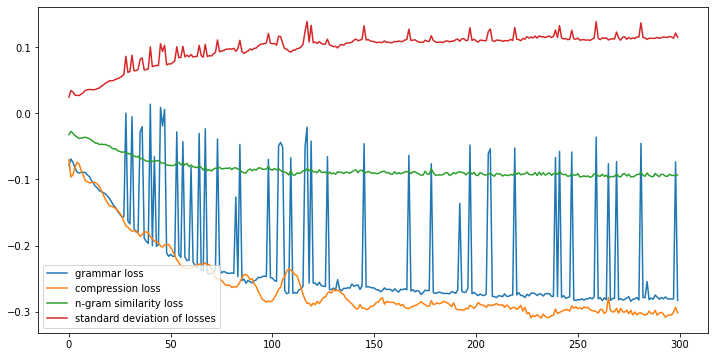

g 3.8816 	s 0.5924 	c 0.4863, score 2.2256, [It certainly isn’t a train announcer to insulting comments about it and Which is shame sure it was good enough train a sense of his]
g 4.9982 	s 0.6124 	c 0.4745, score 2.4199, [It certainly isn’t up a train announcer to insulting comments about it and Which is shame sure it was good enough train a sense of his]
g -3.2560 	s 0.7327 	c 0.5765, score 1.1135, [It certainly isn’t a train announcer to insulting comments about it and shame sure it good train a sense his]
g 1.7886 	s 0.5106 	c 0.5176, score 1.7910, [It certainly isn’t a train announcer to insulting comments about it and Which shame it was good enough train a sense of his]
g -2.3546 	s 0.4721 	c 0.5686, score 1.0110, [It certainly isn’t a train announcer to insulting comments about it shame sure it was enough train a sense his]
g 2.9617 	s 0.4981 	c 0.5451, score 1.9466, [It certainly isn’t up a train announcer to insulting comments about it shame sure it was enough train a sense of

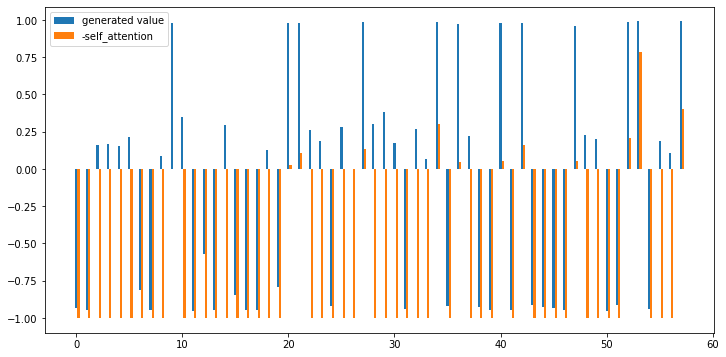

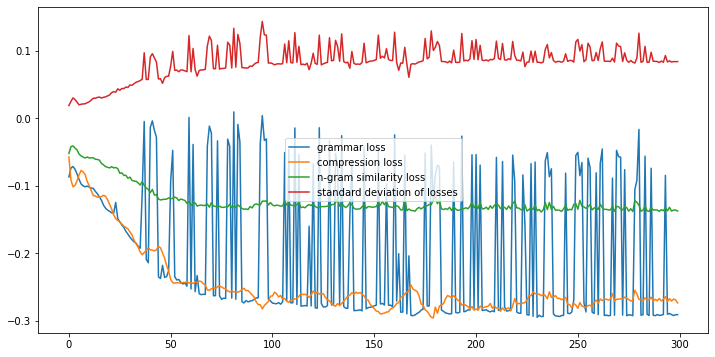

g 4.7989 	s 0.9691 	c 0.3272, score 2.5961, [Midland said it is an investigation into board Wolverhampton Shrewsbury service and The Council called for the matter to taken up with police and remarks racist professional role should insulting places they are working.]
g 4.8825 	s 0.9698 	c 0.3364, score 2.6199, [Midland said it is an investigation into board Wolverhampton Shrewsbury service and The Council called for the matter taken up with police and remarks racist professional role should insulting places they are working.]
g -3.7903 	s 0.9806 	c 0.4495, score 1.2984, [Midland said it is an investigation board Shrewsbury service Council called for matter to taken up with police remarks racist professional should insulting places they are working.]
g 5.1501 	s 0.9554 	c 0.3700, score 2.6838, [Midland said it is an investigation into board Shrewsbury service and The Council called for the matter to taken up with police and remarks racist professional role should insulting places they ar

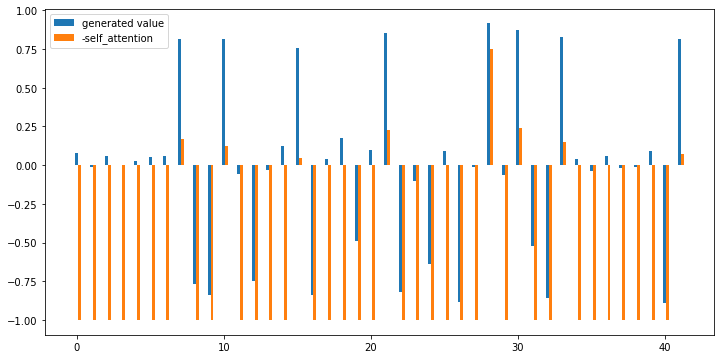

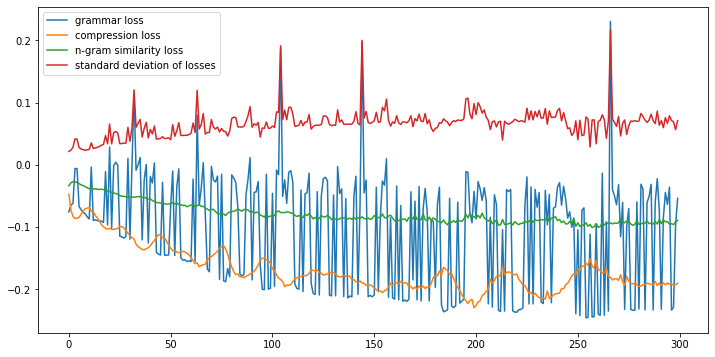

g -3.6343 	s 0.9301 	c 0.2795, score 1.1039, [He I couldn’t believe it and Passenger 46 was on his mobile the time the announcer clearly Telford Central - please of pickpockets and gipsies and Scroll down video.]
g 5.0243 	s 0.9632 	c 0.2271, score 2.5277, [He said: I couldn’t believe it and Passenger 46 was on his mobile the time the announcer clearly heard Telford Central - please of pickpockets and gipsies and Scroll down video.]
g -5.9174 	s 0.9231 	c 0.5459, score 0.8910, [He said: I it Passenger 46 was mobile time the announcer Central please of and gipsies and Scroll video.]
g -1.4881 	s 0.9622 	c 0.3144, score 1.5286, [He said: I couldn’t believe it and Passenger 46 was his mobile the time the announcer clearly heard Telford Central please of pickpockets and and down video.]
g 5.7261 	s 0.9793 	c 0.2620, score 2.6956, [He said: I couldn’t believe it and Passenger 46 was on his mobile the time the announcer heard Telford Central - please of pickpockets and gipsies and Scroll dow

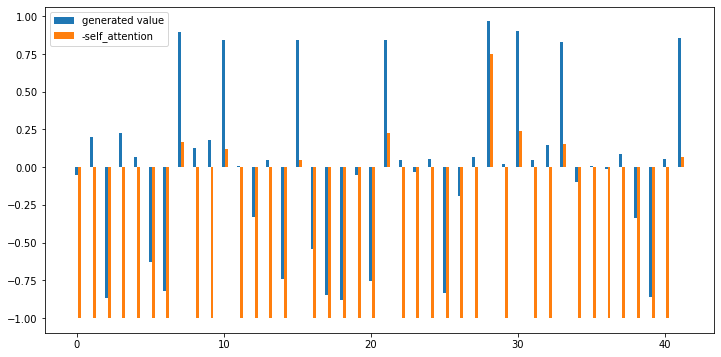

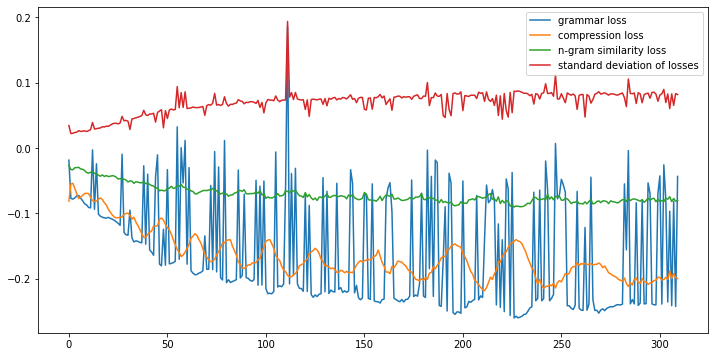

g 4.1899 	s 0.9763 	c 0.2576, score 2.4323, [He said: couldn’t believe Passenger Chris Downes 46 was on mobile and announcer can clearly be Telford Central - please be aware of pickpockets and gipsies and for video.]
g 4.8044 	s 0.9754 	c 0.3231, score 2.5993, [He said: couldn’t believe Passenger Chris 46 was on mobile and announcer can be Telford Central - please be aware of pickpockets and gipsies and for video.]
g 3.1327 	s 0.9414 	c 0.2707, score 2.2343, [said: couldn’t believe Passenger Chris Downes 46 was on mobile and announcer can clearly be Telford Central - please be aware of pickpockets and gipsies and for video.]
g -4.7045 	s 0.9253 	c 0.5590, score 1.0823, [He said: couldn’t Passenger Chris 46 on mobile and announcer be Central please be aware of and video.]
g 5.3676 	s 0.9757 	c 0.3057, score 2.6760, [He said: couldn’t believe Passenger Chris 46 was on mobile and announcer can clearly be Telford Central - please be aware of pickpockets and gipsies for video.]
g -5.8737 	s

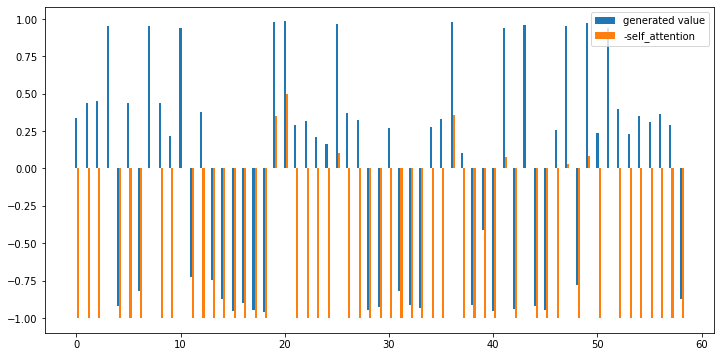

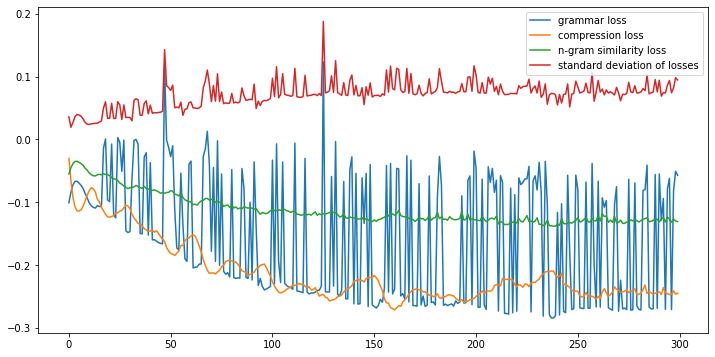

g 3.5980 	s 0.7483 	c 0.3290, score 2.1769, [He’s a young player said he shouldn’t and he regrets welcoming respectful and can be big influence for rest ’ Berahino’s senior Fletcher will mentor player the world week that he wanted to play for a bigger]
g 4.1446 	s 0.7195 	c 0.3453, score 2.2556, [He’s a young player said he shouldn’t and he regrets welcoming respectful and can be big influence for rest ’ Berahino’s senior Fletcher mentor player the world week that he wanted to play for a bigger]
g -4.5583 	s 0.8808 	c 0.4528, score 1.0739, [a young player he and he regrets welcoming respectful and can be influence for rest ’ Berahino’s Fletcher mentor player the world week that he wanted to play for bigger]
g -0.6474 	s 0.7014 	c 0.4202, score 1.5136, [He’s a young player said he shouldn’t and he regrets welcoming respectful and can be influence rest ’ senior Fletcher mentor player the world week that he wanted to play a bigger]
g 2.6811 	s 0.6221 	c 0.3746, score 1.9435, [He’s a young

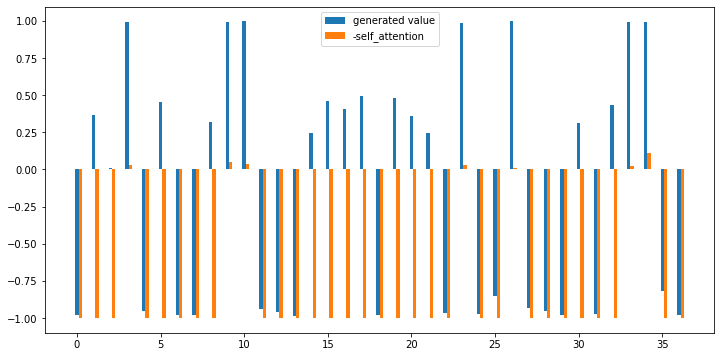

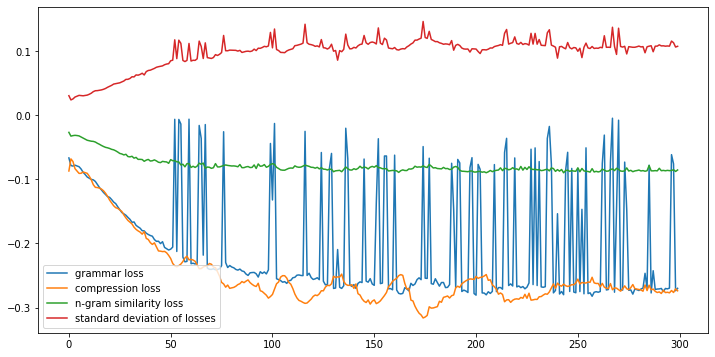

g 4.5387 	s 0.9482 	c 0.4975, score 2.7021, [players and will be interested to work for until that happens Tony advised focus his performances at]
g 2.4559 	s 0.9561 	c 0.4573, score 2.3227, [what players and will be interested is to work for until that happens Tony advised focus his performances at]
g 3.2253 	s 0.9635 	c 0.4322, score 2.4332, [what good players and will be interested is to work for until that happens Tony advised focus his performances at]
g -0.4497 	s 0.8804 	c 0.6030, score 1.7025, [players and be interested is to work for until Tony advised his performances at]
g 3.2237 	s 0.9395 	c 0.5126, score 2.4642, [players and will be interested is to work for until that happens Tony advised his performances at]
g -0.7999 	s 0.9535 	c 0.4824, score 1.8026, [players and will be interested is to work for until that happens Tony advised focus his performances at]
g 2.9654 	s 0.9655 	c 0.4573, score 2.4170, [good players and will be interested is to work for until that happens T

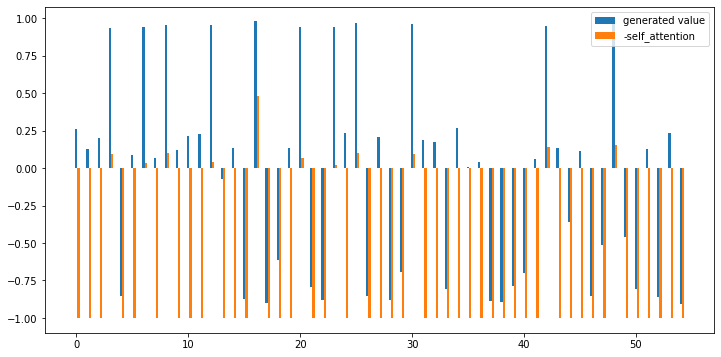

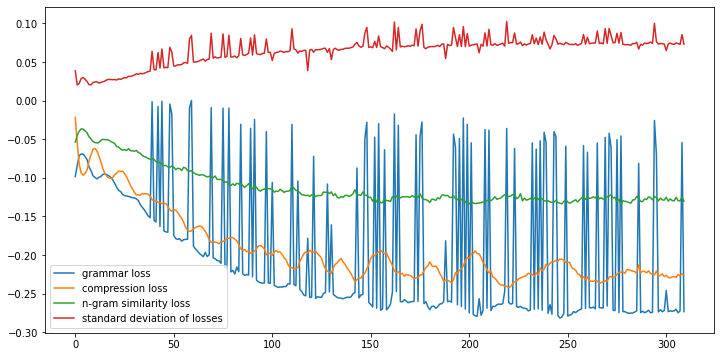

g 3.1018 	s 0.9752 	c 0.4401, score 2.4323, [Hes done an interview not for what he was supposed to be about Fletcher been impressed on the training lads have gone into him and players do and West wants do]
g 3.0594 	s 0.9713 	c 0.4296, score 2.4108, [Hes done an interview not for what he was supposed to be about Fletcher been impressed on the training lads have gone into him and young players and West wants do]
g 4.7844 	s 0.9822 	c 0.3768, score 2.6563, [Hes done an interview not for what he was supposed to be talking about Fletcher been impressed on the training but lads have gone into him and young players do and West wants do]
g 3.6113 	s 0.9741 	c 0.4049, score 2.4809, [done an interview not for what he was supposed to be talking about Fletcher been impressed on training but lads have gone into him and young players do and West wants do]
g 1.9080 	s 0.9776 	c 0.4401, score 2.2357, [Hes an interview for what he was supposed to be talking about Fletcher been impressed on the trainin

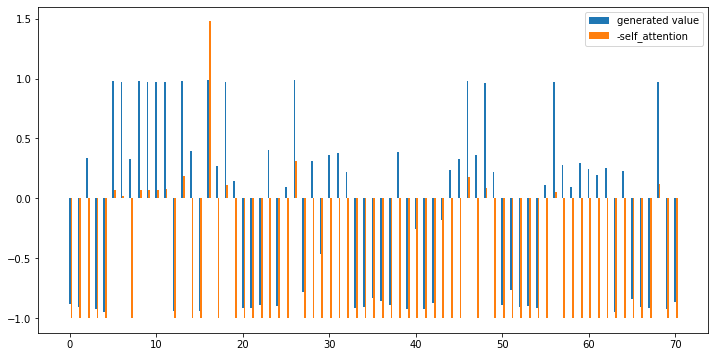

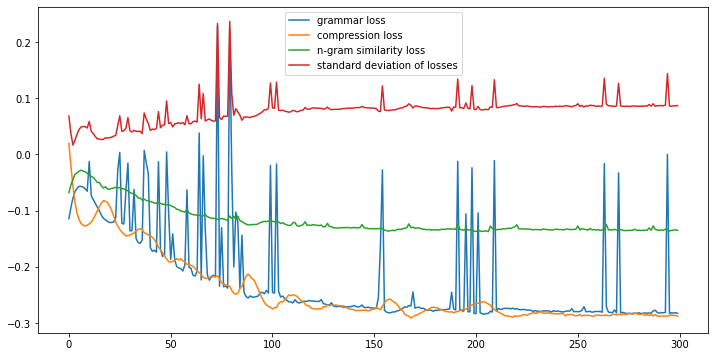

g 3.9117 	s 0.9194 	c 0.4152, score 2.4865, [center memory board with eight flash memory chips bigger than palm of his hand with recorders Campbell has to tackle what task by the aircraft manufacturer investigators are of data and begin the process of getting clearer happened]
g 2.6714 	s 0.9165 	c 0.4278, score 2.2895, [center memory board with eight flash memory chips bigger than palm of his with recorders Campbell has to tackle what task by the aircraft manufacturer investigators are of data and begin the process of getting clearer happened]
g 2.7265 	s 0.9434 	c 0.4253, score 2.3231, [center memory board with eight flash memory chips bigger than palm of his hand with recorders Campbell to tackle what task by the aircraft manufacturer investigators are of data and begin the process of getting clearer happened]
g 3.1081 	s 0.9226 	c 0.4582, score 2.3989, [center memory board with eight flash memory chips bigger than palm of his with recorders Campbell has to tackle what task by the a

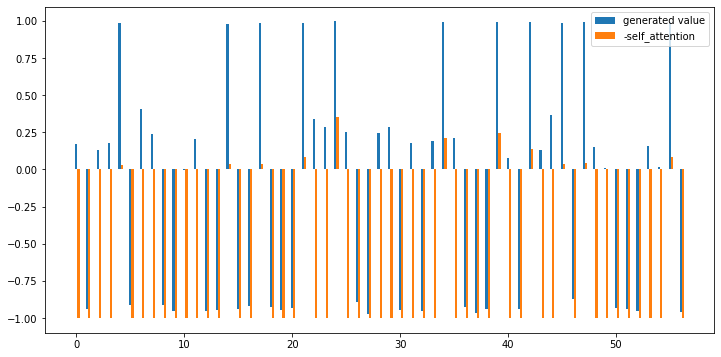

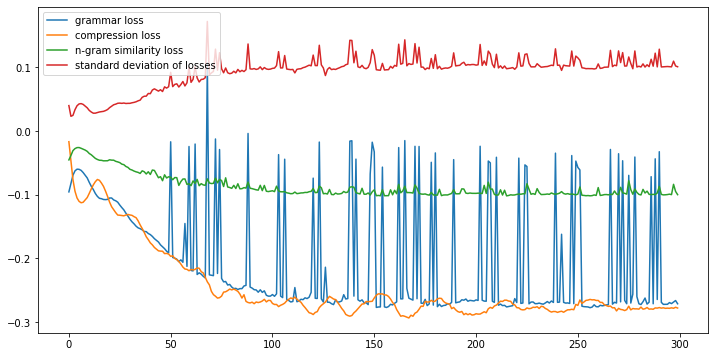

g 3.6906 	s 0.9180 	c 0.3600, score 2.3931, [Just handful of countries the capability know-how to inside box shelves of the labs main examples of boxes have survived some conditions and cockpit voice recorder captures audio channels for two hours before]
g 5.8395 	s 0.8703 	c 0.4000, score 2.7435, [Just handful of countries capability to inside box shelves of the labs main examples of boxes have survived some conditions and cockpit voice recorder captures audio channels for two hours before]
g 2.1518 	s 0.9078 	c 0.3723, score 2.1387, [Just handful of countries the capability know-how to inside box shelves of labs main examples of boxes have survived some conditions and cockpit voice recorder captures audio channels for two hours before]
g 3.9355 	s 0.9100 	c 0.3692, score 2.4351, [Just handful of countries the capability know-how inside box shelves of the labs main examples of boxes have survived some conditions and cockpit voice recorder captures audio channels for two hours before]


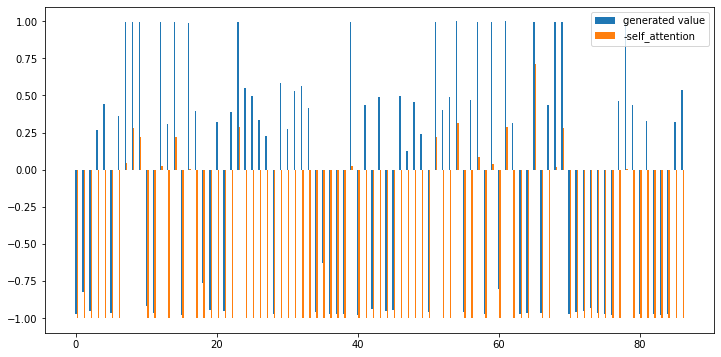

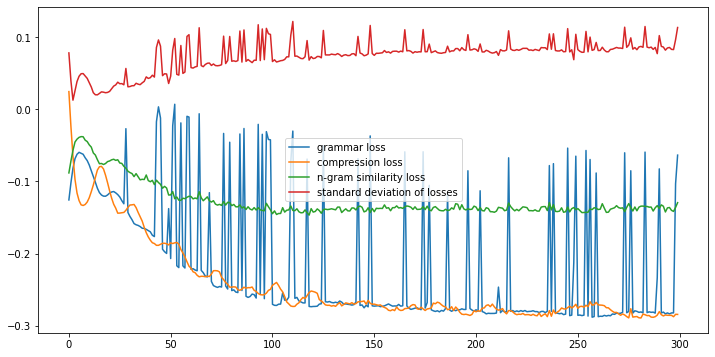

g 4.4457 	s 0.9741 	c 0.4100, score 2.6251, [trade hes taking apart flight data recovering the data them for decades The place that may play a role in solving the mystery Boeing and 239 crew board and inside the Australian Transport Bureaus accident lab place where boxes Malaysian Airlines flight theyre recovered from bottom Indian Ocean.]
g 5.5844 	s 0.9757 	c 0.4380, score 2.8444, [hes taking apart flight data recovering data them for decades The place that may play a role in solving the mystery Boeing and 239 crew board inside the Australian Transport Bureaus accident lab place where boxes Malaysian Airlines flight theyre recovered from bottom Indian Ocean.]
g 3.3701 	s 0.9727 	c 0.4140, score 2.4484, [trade hes taking apart flight data recovering the data them for decades The place that may play role in solving the mystery Boeing and 239 crew board and inside the Australian Transport Bureaus accident lab place where boxes Malaysian Airlines flight theyre recovered from bottom India

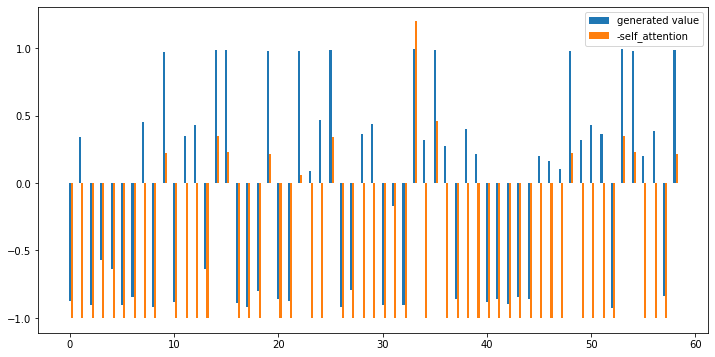

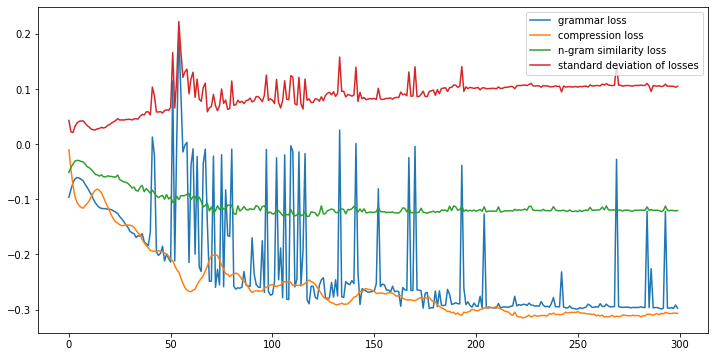

g 2.7786 	s 0.9368 	c 0.3905, score 2.2903, [biggest impossible portray reality of spherical world map problem that has haunted centuries and Africa is larger than and The is impossible to portray the reality of spherical world on a map.]
g 3.0208 	s 0.9406 	c 0.3810, score 2.3250, [biggest impossible portray reality of spherical world map problem that has haunted centuries and in Africa is larger than and The is impossible to portray the reality of spherical world on a map.]
g 1.8012 	s 0.9418 	c 0.4000, score 2.1420, [biggest impossible portray reality of spherical world map problem that has haunted centuries and Africa is larger than and The is impossible portray the reality of spherical world on a map.]
g -3.3413 	s 0.9423 	c 0.4063, score 1.2918, [biggest impossible portray reality of spherical world map problem that has haunted centuries and Africa is larger than and The is impossible to portray the reality spherical world on map.]
g 2.2389 	s 0.9302 	c 0.3968, score 2.2002, [big

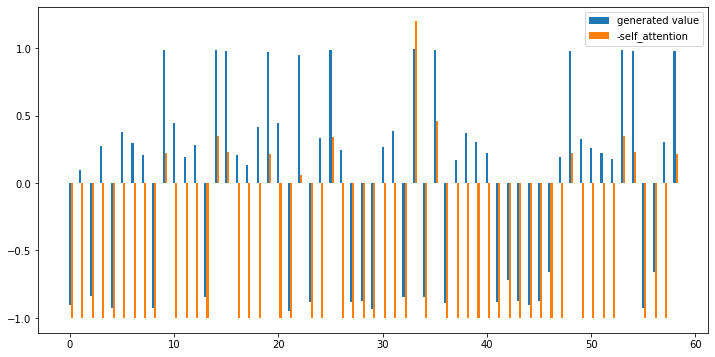

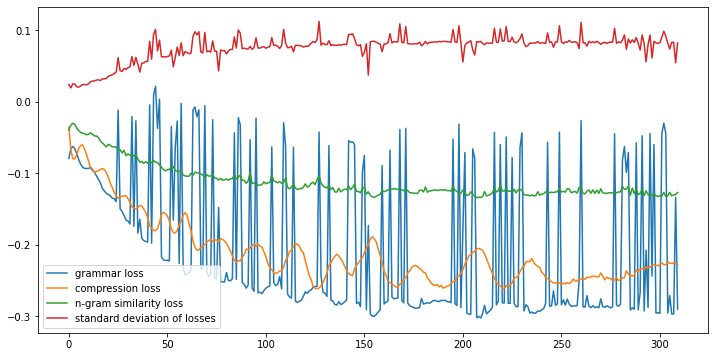

g 2.6121 	s 0.9754 	c 0.3365, score 2.2473, [biggest is it is impossible portray the reality of spherical world on a flat map problem has haunted cartographers But in Africa larger both and The biggest portray the reality of the spherical world flat map.]
g 4.4615 	s 0.9802 	c 0.3365, score 2.5603, [biggest is it is impossible portray the reality of spherical world on a flat map – problem has haunted cartographers But in Africa larger and The biggest to portray the reality of the spherical world flat map.]
g 3.5110 	s 0.9667 	c 0.3365, score 2.3884, [biggest is it is impossible portray the reality of spherical world on a flat map – problem has haunted cartographers But in Africa larger both and The biggest to portray the reality of the spherical world map.]
g 3.3083 	s 0.9672 	c 0.3206, score 2.3392, [biggest is it is impossible portray the reality of spherical world on a flat map – problem has haunted cartographers But in Africa larger both and The biggest to portray the reality of th

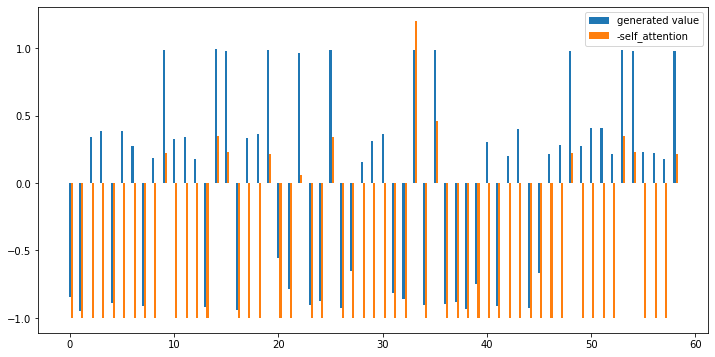

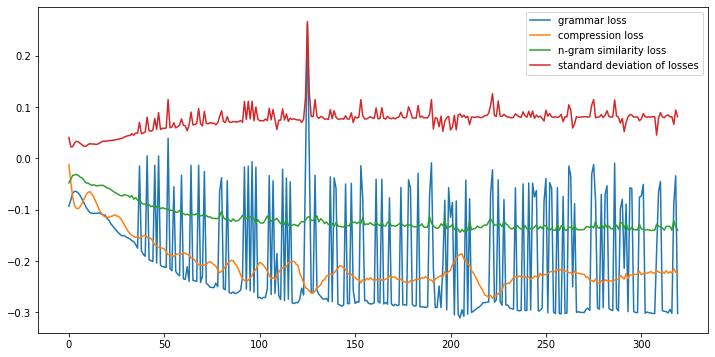

g 3.0384 	s 0.9835 	c 0.3492, score 2.3391, [challenge is it is to portray the reality of spherical world flat map problem haunted centuries and But Africa larger biggest is that impossible to portray the reality of the spherical world on a flat map.]
g 2.0166 	s 0.9900 	c 0.3651, score 2.1912, [challenge is it is to portray the reality of spherical world a flat map problem haunted centuries and But Africa larger biggest is that impossible to portray the reality of the spherical world on map.]
g -4.4134 	s 0.9897 	c 0.3905, score 1.1446, [is it is to portray the reality spherical world a flat map problem haunted centuries and But Africa larger biggest is that impossible to portray the reality of the spherical world on flat map.]
g 2.8862 	s 0.9920 	c 0.3524, score 2.3254, [challenge it is to portray the reality of spherical world a flat map problem haunted centuries and But Africa larger biggest is that impossible to portray the reality of the spherical world on a flat map.]
g 2.5485 	

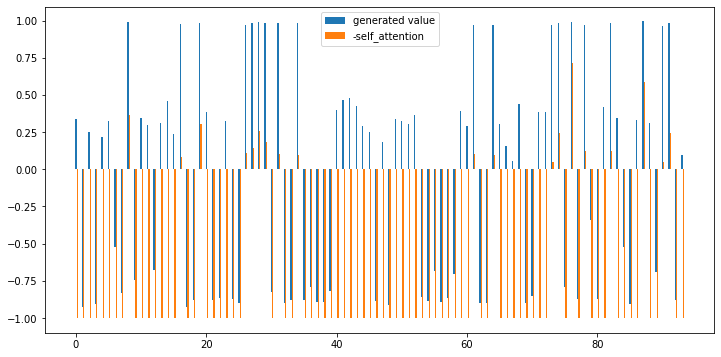

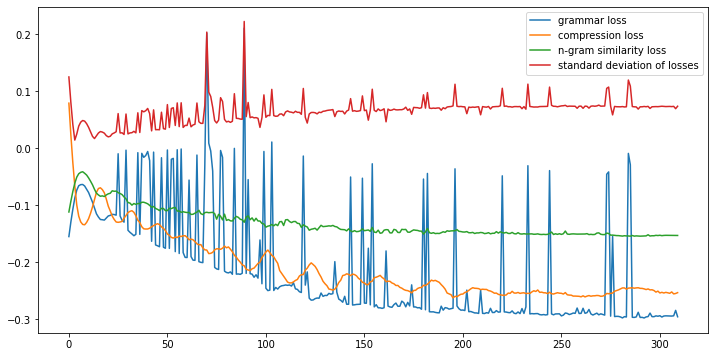

g 2.5924 	s 0.9772 	c 0.3710, score 2.2803, [The is result of projection map most seen hanging in classrooms text books created to help sailors navigate world Maps a never-ending quest for the perfect but Brotton historian of cartography of the World Maps isnt so and suggests that Scandinavian countries larger India reality India is the size of Scandinavian countries together.]
g 3.7134 	s 0.9786 	c 0.3785, score 2.4761, [is result of projection map most seen hanging in classrooms text books created to help sailors navigate world Maps a never-ending quest for the perfect but Brotton historian of cartography of the World Maps isnt so and suggests that Scandinavian countries larger India reality India is the size of Scandinavian countries together.]
g 2.6284 	s 0.9726 	c 0.3955, score 2.3061, [The is result of projection map most seen hanging in classrooms text books created to help sailors navigate world Maps a quest for the perfect but Brotton historian of cartography of the World Maps

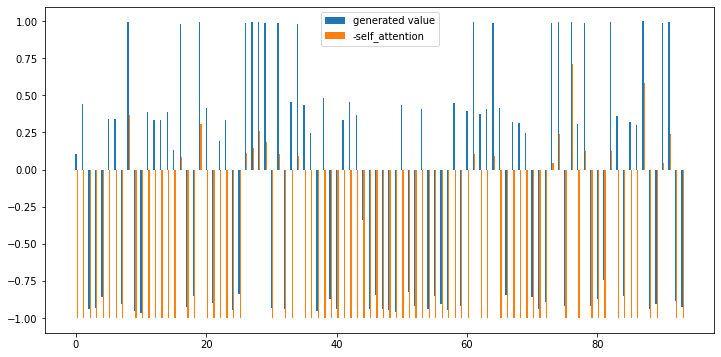

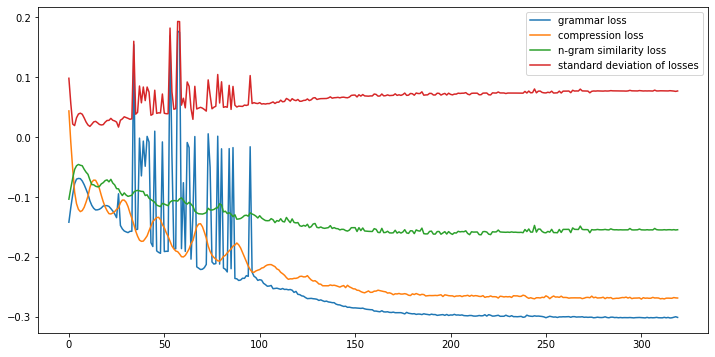

g 4.6127 	s 0.9462 	c 0.3785, score 2.5935, [The distortion of the projection most commonly seen hanging in classrooms text books was created to help sailors navigate world Google Maps claims that is never-ending quest for historian and History the World in Twelve Maps isnt sure and The Scandinavian countries larger than India India is times the size Scandinavian countries]
g 2.5037 	s 0.9490 	c 0.3992, score 2.2655, [The of the projection most commonly seen hanging in classrooms text books was created to help sailors navigate world Google Maps claims that is never-ending quest for historian and History the World in Twelve Maps isnt sure and The Scandinavian countries larger than India India is times the size Scandinavian countries]
g 5.1709 	s 0.9508 	c 0.3842, score 2.6968, [The distortion of the projection most commonly seen hanging in classrooms text books was created to help sailors navigate world Google Maps claims that never-ending quest for historian and History the World in Tw

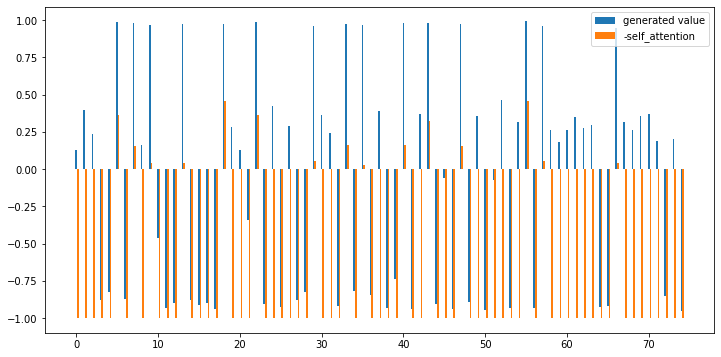

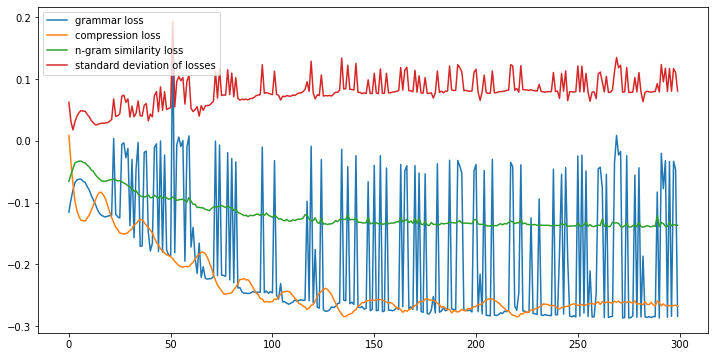

g 3.2851 	s 0.9565 	c 0.4123, score 2.4163, [The map suggests countries larger than India India size of all countries But China is four bigger Greenland is bigger North America Mexico larger Alaska The creators the size China and placed it in the middle world that otherwise consisted mainly of offshore]
g 2.4651 	s 0.9292 	c 0.4237, score 2.2638, [The map suggests countries larger than India India size of all countries together But China four bigger Greenland is bigger North America larger Alaska creators the size China and placed it in the middle world that otherwise consisted mainly of offshore]
g 3.2626 	s 0.9582 	c 0.4077, score 2.4097, [The map suggests countries larger than India India size of all countries together But China is four bigger Greenland is bigger North America larger Alaska The creators the size China and placed it in the middle world that otherwise consisted mainly of offshore]
g 3.3810 	s 0.9565 	c 0.3918, score 2.4118, [The map suggests countries larger than Indi

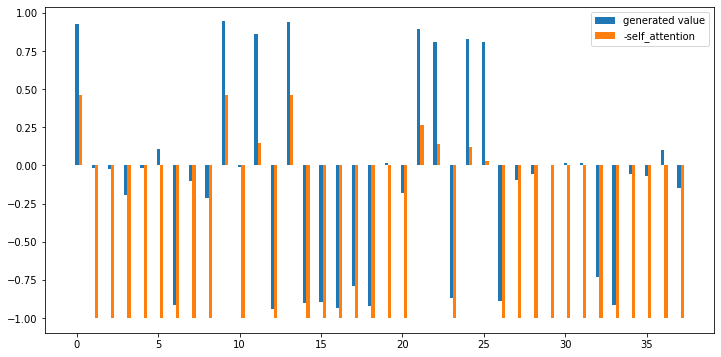

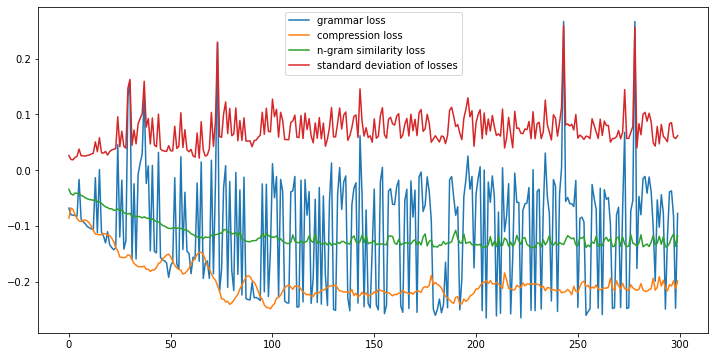

g 1.4544 	s 0.9901 	c 0.2850, score 2.0176, [In their lawsuit Cassell and Edwards Dershowitz and In a sworn in have had sex as minor with U S criminal defense lawyer have filed a counter-defamation.]
g -2.3856 	s 0.9605 	c 0.3879, score 1.4507, [In their lawsuit Cassell and Edwards Dershowitz and In sworn in had sex as minor with S criminal lawyer filed a counter-defamation.]
g -5.8565 	s 0.9558 	c 0.5280, score 0.9517, [In their and Edwards Dershowitz and In sworn in have sex as minor with U criminal lawyer have filed a]
g -5.6610 	s 0.9695 	c 0.4953, score 1.0213, [In lawsuit Cassell and Edwards Dershowitz and In sworn in have had sex as minor with S defense lawyer have a]
g -5.8666 	s 0.9274 	c 0.6916, score 0.7580, [In and Edwards In sworn in sex as minor with criminal defense have]
g -5.7105 	s 0.9519 	c 0.6028, score 0.8973, [In lawsuit Edwards Dershowitz In a sworn in sex as minor with S criminal defense have]
g 2.3198 	s 0.9840 	c 0.2944, score 2.1650, [In their lawsuit Cassell

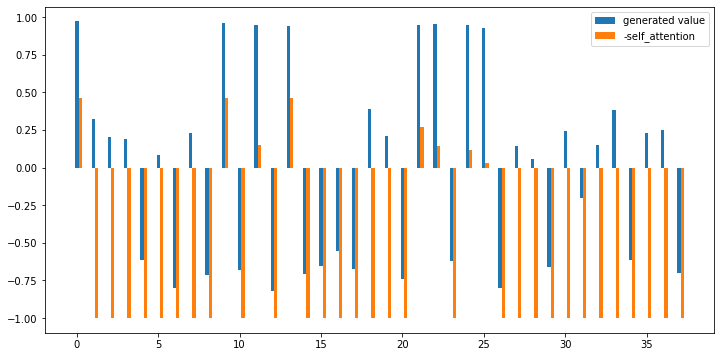

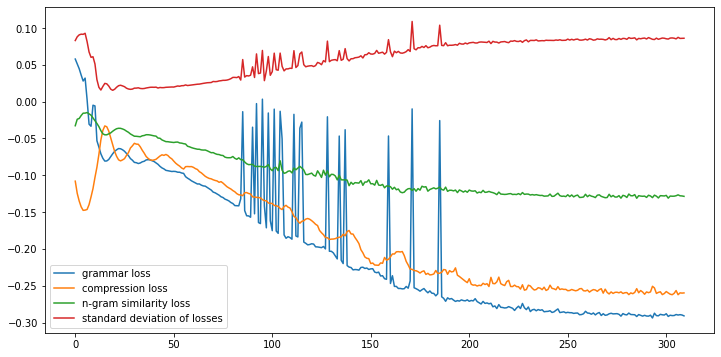

g 4.0504 	s 0.9234 	c 0.4533, score 2.5517, [In their lawsuit Cassell Edwards Dershowitz In sworn in to have sex as minor with U S defense Alan Dershowitz filed a]
g 3.2047 	s 0.9418 	c 0.4720, score 2.4479, [In their lawsuit Cassell Edwards Dershowitz In sworn in to have sex as minor with defense Alan Dershowitz filed a]
g 2.4780 	s 0.9483 	c 0.4626, score 2.3239, [In their lawsuit Cassell Edwards Dershowitz In sworn in to have sex as minor with S defense Alan Dershowitz filed a]
g 4.9893 	s 0.9216 	c 0.4206, score 2.6737, [In their lawsuit Cassell Edwards Dershowitz In sworn in to have sex as minor with U S defense lawyer Alan Dershowitz filed a]
g 2.6450 	s 0.9095 	c 0.4626, score 2.3130, [In their lawsuit Cassell Edwards Dershowitz In sworn in to have sex as minor with U defense Alan Dershowitz filed a]
g 4.7562 	s 0.9014 	c 0.4907, score 2.6847, [In their lawsuit Cassell Dershowitz In sworn in to have sex as minor with U S defense Alan Dershowitz filed a]
g 3.7504 	s 0.9322 	c 0.5

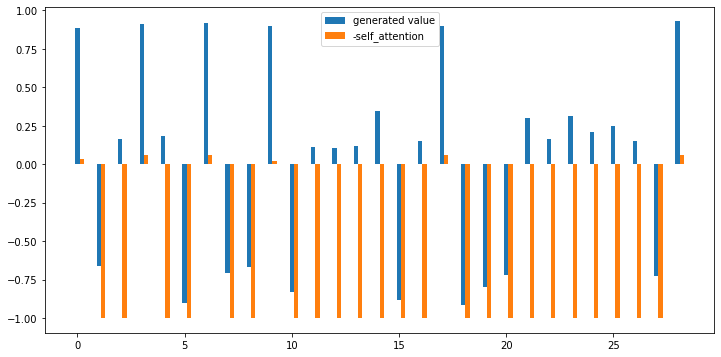

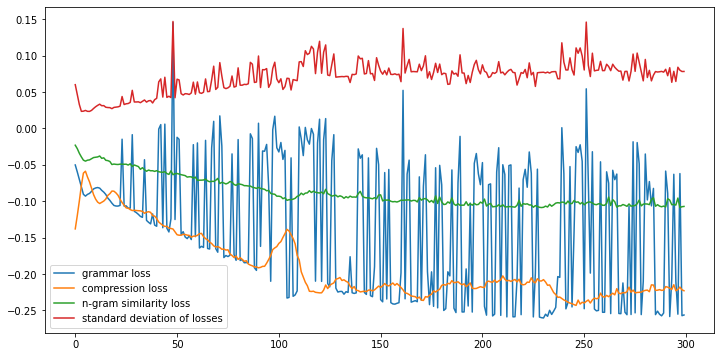

g 3.9369 	s 0.9536 	c 0.3515, score 2.4613, [people Dershowitz and Prince and Monday filed a motion in court and in Florida federal court last week and.]
g -1.4525 	s 0.9639 	c 0.4727, score 1.6945, [people Dershowitz and Prince and Monday filed a motion and federal court last week and.]
g 0.7285 	s 0.9704 	c 0.3939, score 1.9858, [people Dershowitz and and Monday filed a motion in court and in Florida federal court last week and.]
g -5.3920 	s 0.9444 	c 0.4424, score 0.9882, [people Dershowitz and Prince and Monday filed a motion in and Florida federal last week and.]
g -5.1838 	s 0.9789 	c 0.4364, score 1.0513, [people Dershowitz and and Monday filed motion in court and in Florida federal court week and.]
g -5.2790 	s 0.9538 	c 0.5152, score 1.0588, [people and and Monday filed a motion in court and Florida federal last week and.]
g -4.1373 	s 0.9287 	c 0.5576, score 1.1816, [people Dershowitz and Prince and Monday filed in and in federal week and.]
g -5.0636 	s 0.9551 	c 0.4727, sco

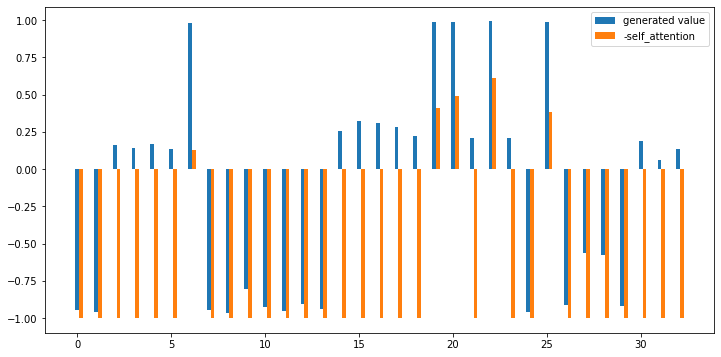

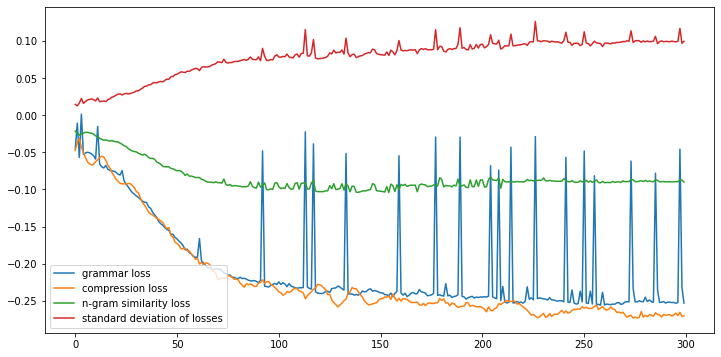

g 3.3865 	s 0.9613 	c 0.4620, score 2.4877, [judge Cassell and Florida had sex with an underage girl on and Roberts accused prince sex with her.]
g 4.0244 	s 0.9738 	c 0.4348, score 2.5793, [judge Paul Cassell and Florida had sex with an underage girl on and Roberts accused prince sex with her.]
g 3.5817 	s 0.9598 	c 0.4565, score 2.5132, [judge Paul Cassell and Florida had sex with an underage girl on and Roberts accused prince with her.]
g 2.6424 	s 0.9823 	c 0.4565, score 2.3792, [judge Paul Cassell Florida had sex with an underage girl on and Roberts accused prince sex with her.]
g 1.2337 	s 0.9665 	c 0.4620, score 2.1341, [judge Paul Cassell and Florida had sex with an underage girl on and Roberts accused prince sex her.]
g -1.4500 	s 0.9629 	c 0.4891, score 1.7103, [judge Cassell and Florida had sex with an underage girl on and Roberts accused prince sex her.]
g 2.2543 	s 0.9764 	c 0.4565, score 2.3086, [judge Paul Cassell and Florida sex with an underage girl on and Roberts accu

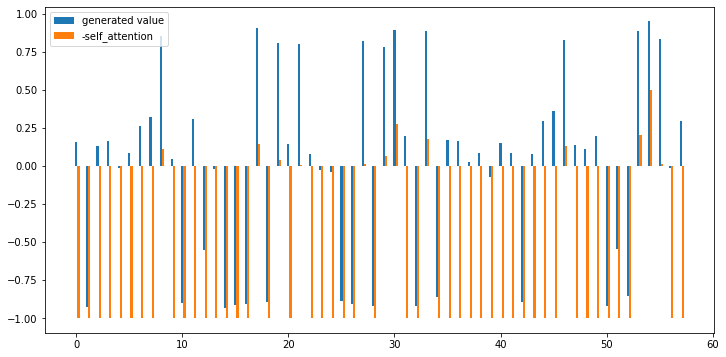

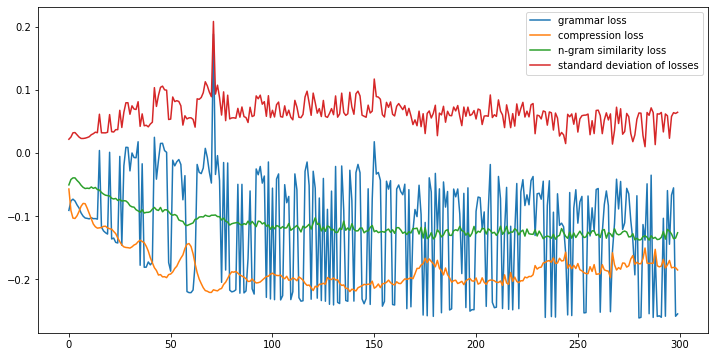

g 4.6069 	s 0.9918 	c 0.2451, score 2.5047, [Theres very personal meaning behind it and Id like it Her booked the session as a gift had beautiful sunny and service become so popular that Mrs Ernhart has a directory of photographers around the world ill pets with their owners.]
g 4.1689 	s 0.9840 	c 0.2320, score 2.4108, [Theres very personal meaning behind it and Id like share it Her booked the session as gift had beautiful sunny and service become so popular that Mrs Ernhart has a directory of photographers around the world ill pets with their owners.]
g 4.4937 	s 0.9913 	c 0.2255, score 2.4657, [Theres very personal meaning behind it and Id like share it Her booked the session as a gift had beautiful sunny and service become so popular that Mrs Ernhart has a directory of photographers around the world ill pets with their owners.]
g -5.8297 	s 0.4756 	c 0.7353, score 0.2687, [Id Her booked session had beautiful sunny service photographers the ill pets with]
g -5.5189 	s 0.9527 	c 0.42

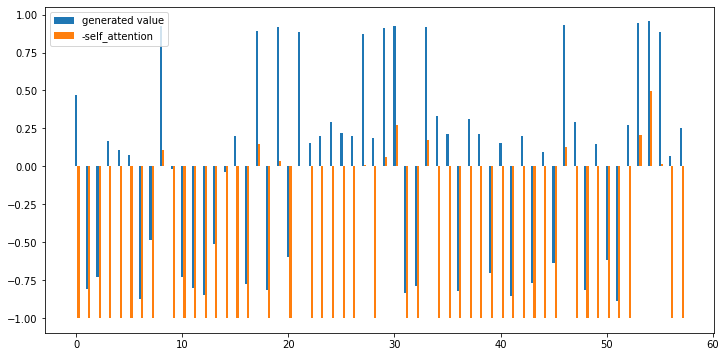

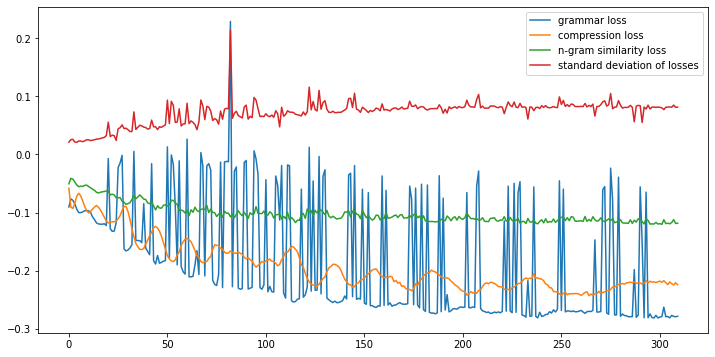

g 4.1176 	s 0.9853 	c 0.2680, score 2.4395, [Theres personal meaning behind Id like began Her booked session as a gift and we had a beautiful sunny service has become popular that Ernhart built directory photographers around world terminally ill pets with their owners.]
g 3.7646 	s 0.9840 	c 0.2549, score 2.3664, [Theres personal meaning behind Id like all began Her booked session as a gift and we had a beautiful sunny service has become popular that Ernhart built directory photographers around world terminally ill pets with their owners.]
g 1.6658 	s 0.9863 	c 0.3301, score 2.0940, [Theres personal meaning Id like began Her booked session as a gift and we had beautiful sunny service has become popular that Ernhart built photographers around world terminally ill pets with their owners.]
g 3.2279 	s 0.9856 	c 0.2876, score 2.3112, [Theres personal meaning behind Id like began Her booked session as a gift and we had a beautiful sunny service has become popular that Ernhart built director

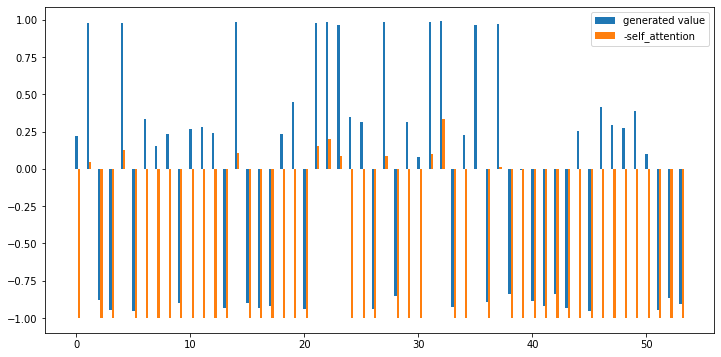

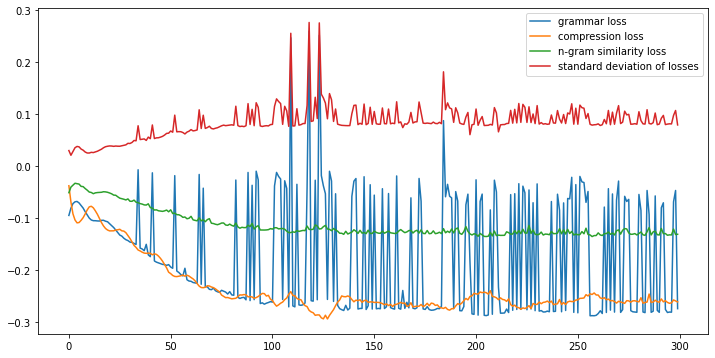

g 3.2129 	s 0.8060 	c 0.3649, score 2.2064, [The service widespread that Mrs Ernhart built a directory photographers who shoot ill pets with their owners Joy place herself under Joan break her stand to this view of what these peoples]
g -2.1211 	s 0.8547 	c 0.5473, score 1.4539, [service widespread that Ernhart photographers who shoot ill pets with their owners Joy under Joan her stand to view what these peoples]
g 3.0906 	s 0.8047 	c 0.3784, score 2.1982, [The service widespread that Ernhart built a directory photographers who shoot ill pets with their owners Joy place herself under Joan break her stand to this view of what these peoples]
g 3.5579 	s 0.7929 	c 0.3851, score 2.2710, [The service widespread that Mrs Ernhart built a directory photographers who shoot ill pets with their owners Joy herself under Joan break her stand to this view of what these peoples]
g -5.0907 	s 0.6147 	c 0.4966, score 0.7629, [The service widespread Mrs Ernhart directory photographers who ill pets with 

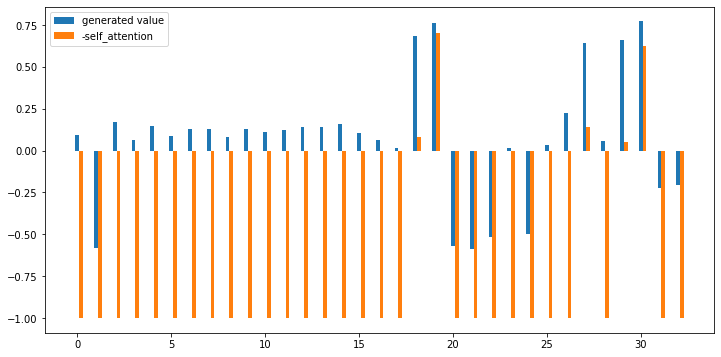

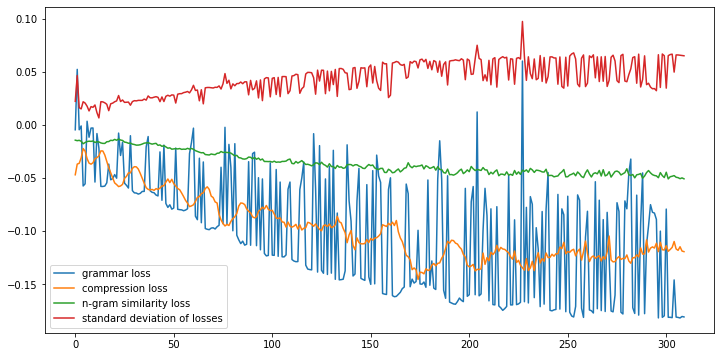

g 5.5935 	s 0.9140 	c 0.1575, score 2.5038, [was blessed to have Joy come into her life and her eyes lit up with and connection as Joan help her Service Dog a Black Lab]
g 0.0223 	s 0.9652 	c 0.3699, score 1.8388, [was blessed to have Joy come life and her eyes lit up with and as Joan Service Dog Black Lab]
g 0.0438 	s 0.9541 	c 0.3973, score 1.8587, [was have Joy come and her eyes lit up with connection as Joan help Service Dog Black Lab]
g -5.8081 	s 0.9387 	c 0.4452, score 0.9159, [was to have her life her up with and connection as Joan her Service Dog Black Lab]
g 4.9425 	s 0.9215 	c 0.1849, score 2.4302, [was blessed to have Joy come into life and her eyes lit up with and connection as Joan help her Service Dog a Black Lab]
g -5.3972 	s 0.8551 	c 0.5822, score 0.8734, [come her up with connection as Joan her Service Dog Black Lab]
g -5.4628 	s 0.9483 	c 0.5068, score 1.0309, [was to Joy come her eyes up and connection as Joan Service Dog Black Lab]
g 6.0073 	s 0.9377 	c 0.2123, sc

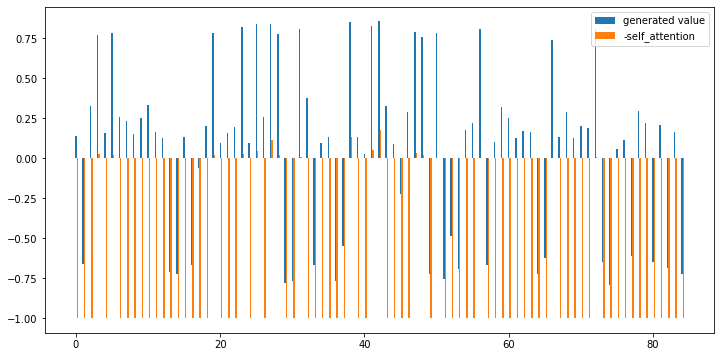

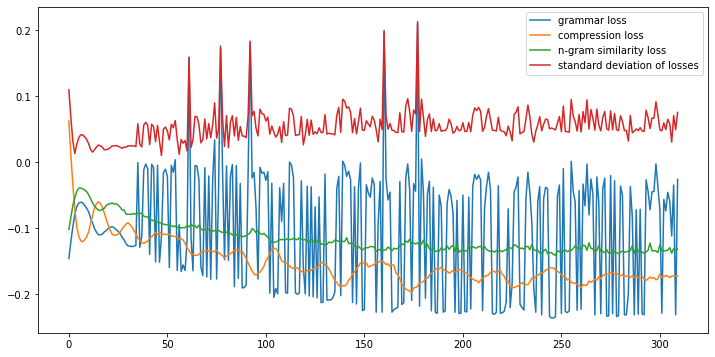

g -2.0383 	s 0.8863 	c 0.3411, score 1.3877, [The was hooked by Van after only 39 minutes St on night during Manchester Uniteds 2-1 victory over the Saints and Robin van either side a Pelle United left the south coast with three and Louis van said option but to Paddy McNair in the first half because the defenders confidence was shot - it benefit the in long]
g 4.3722 	s 0.8068 	c 0.3389, score 2.3744, [The was hooked by Van Gaal after only 39 minutes at St on during Manchester Uniteds 2-1 victory over the Saints and Robin van either side a Pelle United left the south coast with three and Louis van said option but to McNair in the first half because the defenders confidence was shot - that it benefit the in long]
g 3.2512 	s 0.8064 	c 0.3558, score 2.2040, [The was hooked by Van Gaal after only 39 minutes at St on during Manchester Uniteds victory over the Saints and Robin van either side a Pelle United the south coast with three and Louis van said option but to Paddy McNair in the firs

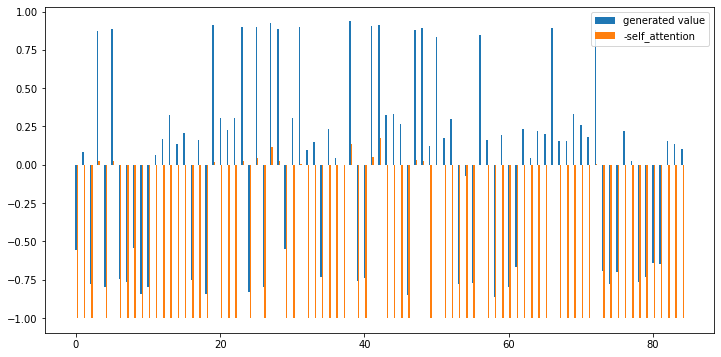

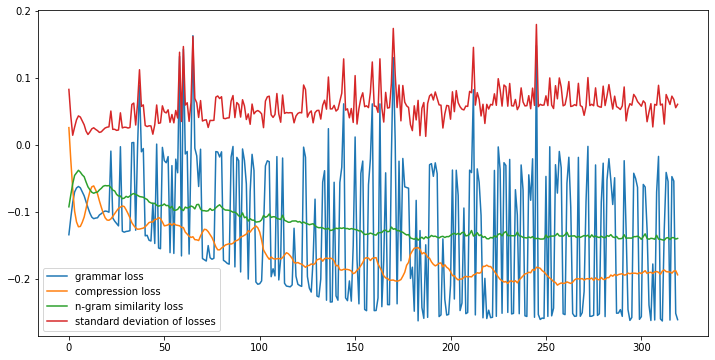

g -4.5644 	s 0.9695 	c 0.4379, score 1.1466, [19-year-old hooked Van at Marys Stadium night Manchester victory over Saints Robin van either side of Pelle ensured United south coast with points Louis van Gaal said he to substitute McNair first half against Southampton because the confidence was shot - it the long]
g -1.8836 	s 0.9620 	c 0.3516, score 1.4996, [19-year-old hooked Van at St Marys on night Manchester Uniteds 2-1 victory over Saints Robin van brace either side of Pelle ensured United south coast with three points Louis van Gaal said he had to substitute McNair first half against Southampton because the defenders confidence was shot - it the long run.]
g 2.8492 	s 0.9384 	c 0.3095, score 2.2227, [19-year-old hooked Van at St Marys Stadium on night Manchester Uniteds 2-1 victory over Saints Robin van brace either side of Pelle strike ensured United south coast with three points Louis van Gaal said he had to substitute McNair first half against Southampton because the defenders

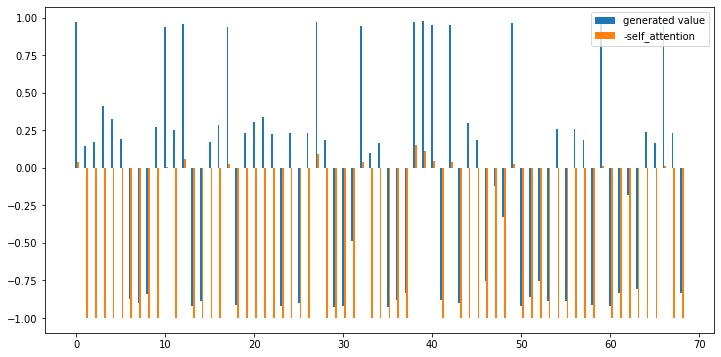

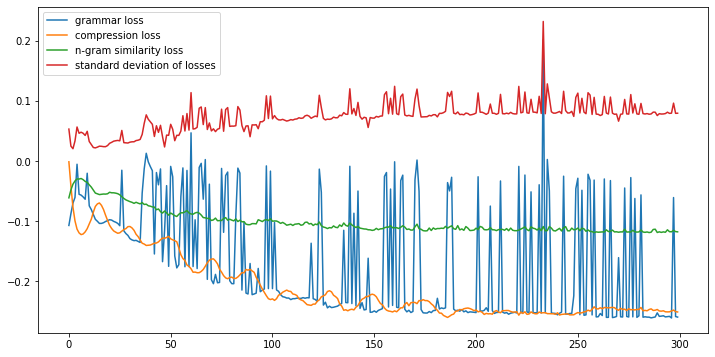

g 1.7756 	s 0.8967 	c 0.4409, score 2.1335, [And despite admitting it will be to accept being replaced Van Gaal insisted it was a necessity will the Northern Irishman and McNair was Southampton strikers Shane and Pelle forcing Gaal replacing Gaal Of tough also in his best]
g 3.8789 	s 0.9319 	c 0.4236, score 2.5020, [And despite admitting it will be to accept being replaced Van Gaal insisted it was a necessity will the Northern Irishman and McNair was Southampton strikers Shane and Pelle forcing Gaal replacing Gaal Of course tough also in his best]
g -4.7501 	s 0.9238 	c 0.4828, score 1.1149, [And admitting it will be to accept being replaced Van Gaal insisted it was necessity will the Northern and McNair was Southampton strikers Shane and Pelle forcing replacing Gaal Of course tough also in his best]
g -5.2775 	s 0.9403 	c 0.5296, score 1.0311, [And admitting it will be accept replaced Van Gaal insisted it was necessity will the Northern Irishman and McNair was Southampton strikers Sh

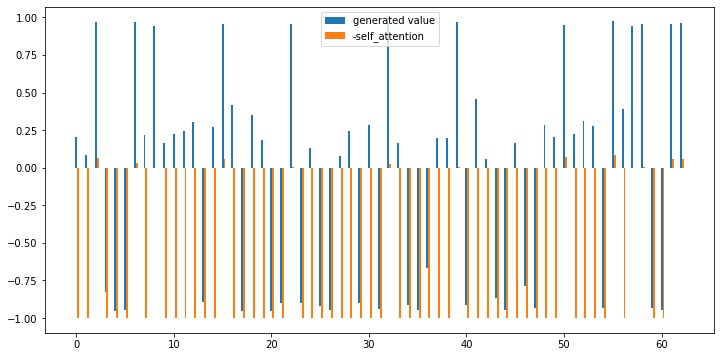

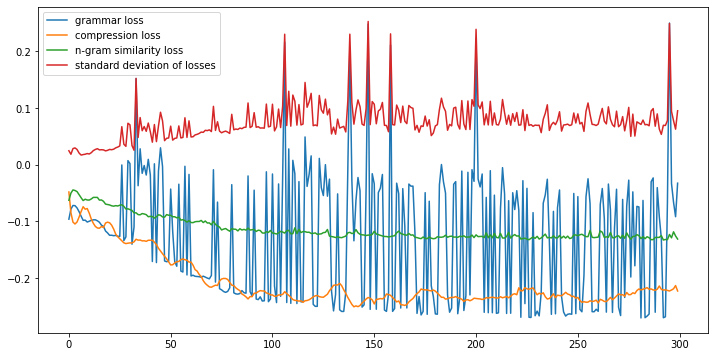

g 2.6492 	s 0.9599 	c 0.3616, score 2.2630, [McNair (right) slices off his foot during the early stages the Southampton clash Jonny Evans to Smalling made way midfielder Herrera as back in to centre of Van system and United boss Louis van admitted he had to against Southampton.]
g -1.8199 	s 0.8188 	c 0.5397, score 1.4758, [McNair (right) slices off foot the early stages the Southampton clash Jonny Evans to Herrera as to centre system and United boss admitted he had to against Southampton.]
g 2.8542 	s 0.9367 	c 0.3726, score 2.2850, [McNair (right) slices off his foot during the early stages the Southampton clash Jonny Evans to Smalling made way midfielder Herrera as back in to centre of system and United boss Louis van admitted he had to against Southampton.]
g -5.5476 	s 0.8641 	c 0.5863, score 0.8532, [McNair slices off his foot early stages the Southampton Jonny Evans to way Herrera to centre Van system and United admitted had to against Southampton.]
g 0.9954 	s 0.9458 	c 0.3753,

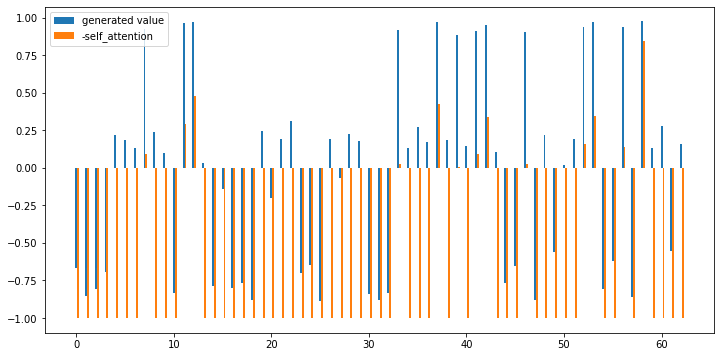

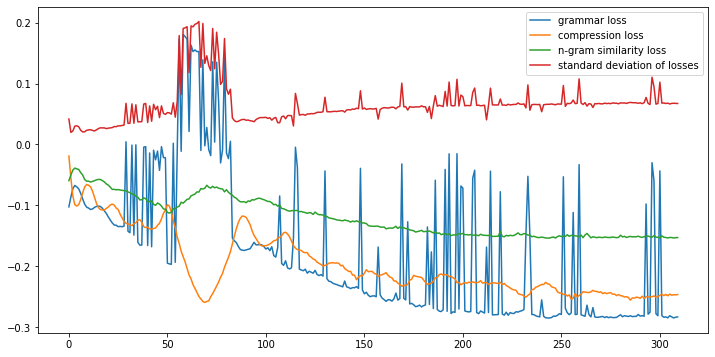

g 3.1570 	s 0.9781 	c 0.3680, score 2.3723, [long there wont be much of corporate tax can fix this with a White House corporations that are obviously American from pretending to be foreign and corporations arent inversions shifting profits offshore U taxes is a problem.]
g 3.3194 	s 0.9772 	c 0.3652, score 2.3956, [long there wont be much of corporate tax left can fix this with a White House corporations that are obviously American from pretending to be foreign corporations arent inversions shifting profits offshore U taxes is a problem.]
g 3.5704 	s 0.9792 	c 0.3539, score 2.4282, [long there wont be much of corporate tax left can fix this with a White House corporations that are obviously American from pretending to be foreign and corporations arent inversions shifting profits offshore U taxes is a problem.]
g -2.0980 	s 0.9803 	c 0.4101, score 1.5407, [long wont be much of corporate tax can fix with a White House corporations that are obviously American from pretending to be foreign

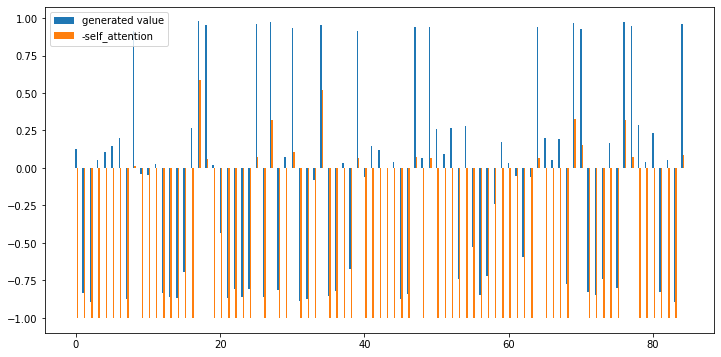

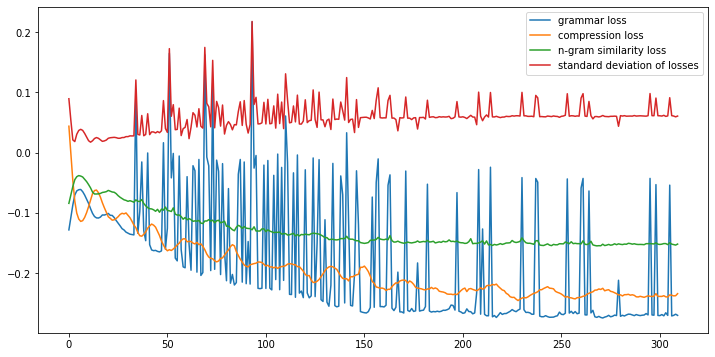

g 2.4950 	s 0.9587 	c 0.4022, score 2.2768, [They exist without investments research and education and makes commerce possible and to profits a country exponentially larger countrys economy further proving companies are using to avoid U S taxes and corporations tricks because they can paying U S taxes on offshore earnings bring profits to the United States happen.]
g 3.6426 	s 0.9753 	c 0.3799, score 2.4622, [They exist without federal investments research and education and makes commerce possible and to profits a country exponentially larger countrys economy further proving companies are using to avoid U S taxes and corporations tricks because they can paying U S taxes on offshore earnings bring profits to the United States may happen.]
g 3.2918 	s 0.9724 	c 0.3911, score 2.4121, [They exist without federal investments research and education and makes commerce possible and to profits a country exponentially larger countrys economy further proving companies are to avoid U S taxes and c

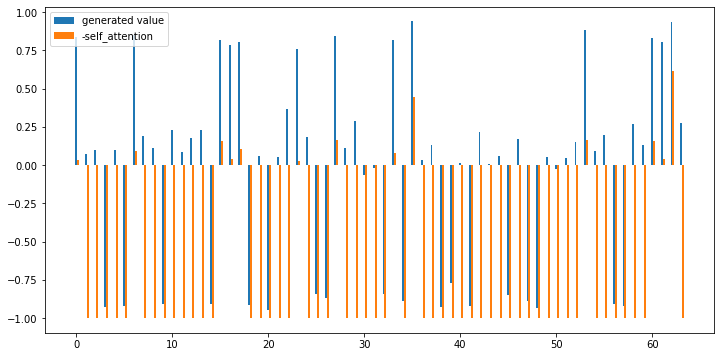

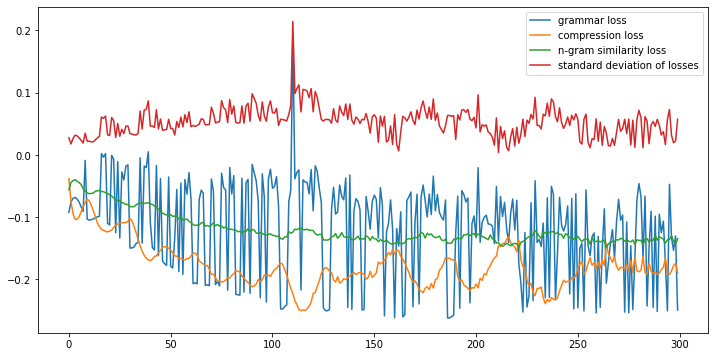

g 4.0635 	s 0.9605 	c 0.2835, score 2.4212, [Taxpayers should be that companies have no about benefiting immensely from U S economic without their fair share and corporations have publicly asserted they moving headquarters but they change way they do and just another ploy that corporations use to eliminate their U S tax bills.]
g -2.9590 	s 0.9789 	c 0.4532, score 1.4389, [Taxpayers should be that companies no about benefiting immensely from U S economic fair share corporations publicly moving headquarters but they change they do and another ploy that corporations use to U S tax bills.]
g -5.9053 	s 0.9360 	c 0.4759, score 0.9277, [Taxpayers should be companies no about immensely from U S economic without their share and corporations have publicly they moving headquarters but they way they do just another corporations use their U S tax]
g -1.8924 	s 0.8677 	c 0.7671, score 1.2853, [Taxpayers companies U S economic share corporations moving headquarters corporations U S tax]
g 3.1092 	s

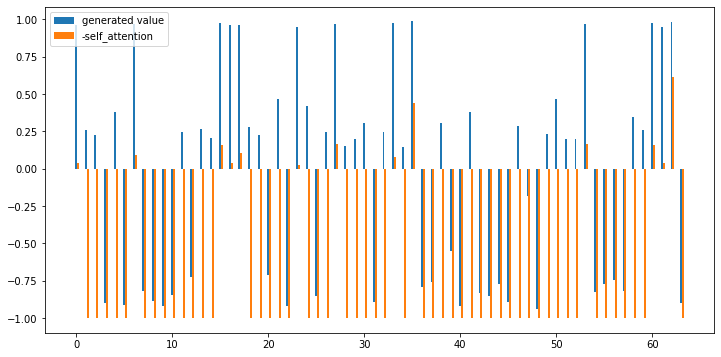

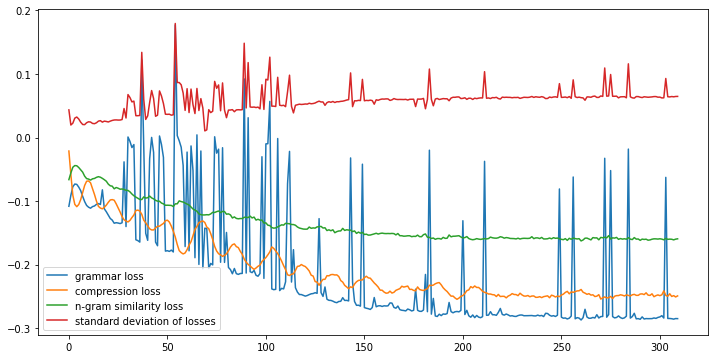

g 3.2591 	s 0.8952 	c 0.3519, score 2.2903, [Taxpayers should be that companies benefiting from the U S economic system without their share and large corporations have publicly asserted are moving their headquarters really the and Inversions just another ploy that corporations eliminate their U S tax]
g 3.4408 	s 0.8748 	c 0.3797, score 2.3280, [Taxpayers should be that companies benefiting from the U S economic system without their share and large corporations have publicly asserted are moving their headquarters really the and just another ploy that corporations eliminate their U S tax]
g 3.2259 	s 0.8565 	c 0.4025, score 2.2967, [Taxpayers should be that companies benefiting from the U S economic system without their share and large corporations have asserted are moving their headquarters really the and just another ploy that corporations eliminate their U S tax]
g 2.0464 	s 0.8425 	c 0.4253, score 2.1089, [Taxpayers should be companies benefiting from the U S economic system without

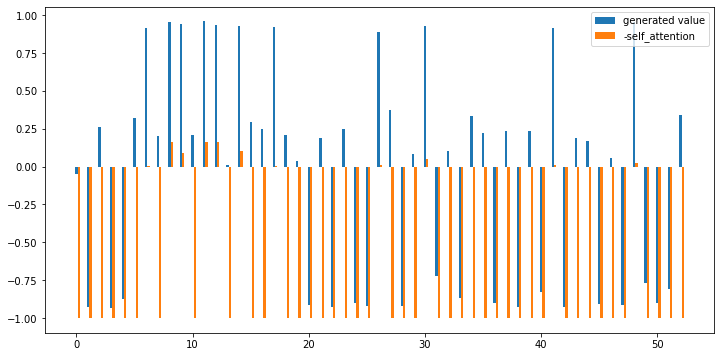

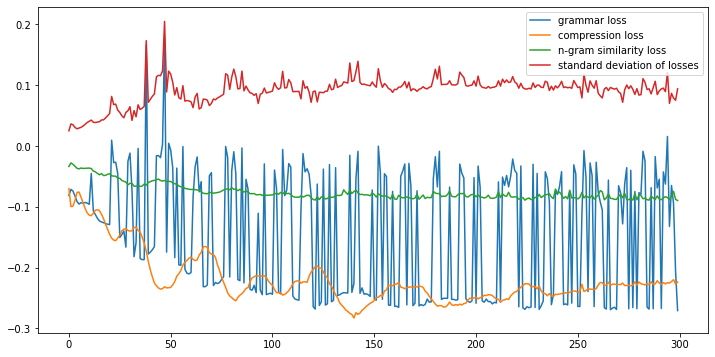

g 2.4175 	s 0.9806 	c 0.3354, score 2.2190, [Recognized one world’s nine amazing yoga retreat destinations Via Yoga in Mexico is the escape you’ve been for For it has a travel and unique luxury nestled British picturesque region the Echo Ranch Spa serenity.]
g -2.2462 	s 0.9711 	c 0.3699, score 1.4666, [Recognized one world’s nine amazing yoga retreat destinations Via Yoga in Mexico is the escape you’ve been for For it a travel and unique nestled British picturesque region the Echo Ranch Spa serenity.]
g -4.9121 	s 0.9653 	c 0.4859, score 1.1326, [one world’s nine amazing yoga retreat destinations Via Yoga in Mexico is the escape been for For it has travel unique nestled picturesque region Ranch Spa serenity.]
g -2.9723 	s 0.9152 	c 0.5361, score 1.3837, [Recognized one nine amazing yoga retreat Via Yoga in Mexico is the escape you’ve been for it a travel and unique luxury picturesque region Ranch Spa]
g 3.3246 	s 0.9878 	c 0.4044, score 2.4463, [one world’s nine amazing yoga retreat d

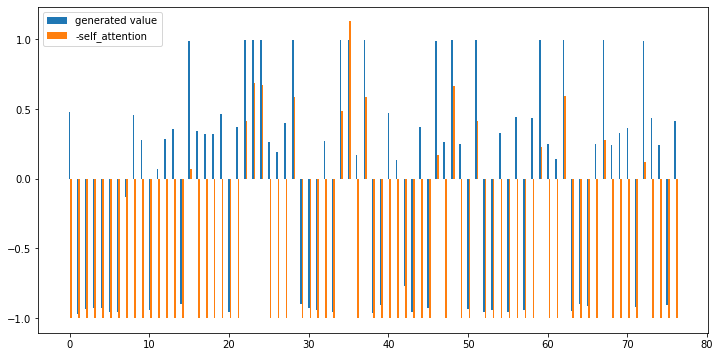

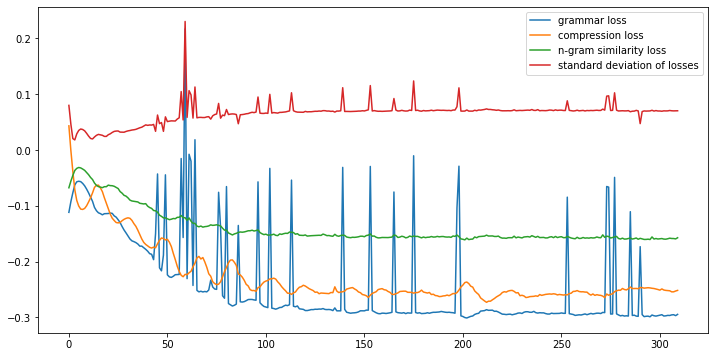

g 2.9664 	s 0.6944 	c 0.3964, score 2.0852, [to unplug of Brits they spending too much on their mobile device while they’re on holiday to work emails on holiday to more people for a digital detox Their reads: you increasingly addicted to your devices selecting hotels that are offering holidays to help de-stress.]
g 3.9543 	s 0.6613 	c 0.3739, score 2.1942, [In to unplug of Brits they regret spending too much on their mobile device while they’re on holiday to work emails on holiday to more people for a digital detox Their reads: you increasingly addicted to your devices selecting hotels that are offering holidays to help de-stress.]
g 3.8798 	s 0.6605 	c 0.3604, score 2.1675, [In to unplug third of Brits they regret spending too much on their mobile device while they’re on holiday to work emails on holiday to more people for a digital detox Their reads: you increasingly addicted to your devices selecting hotels that are offering holidays to help de-stress.]
g 3.2960 	s 0.6485 	c 0.4122,

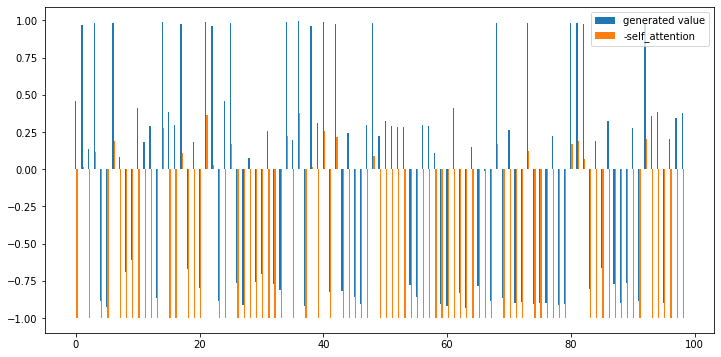

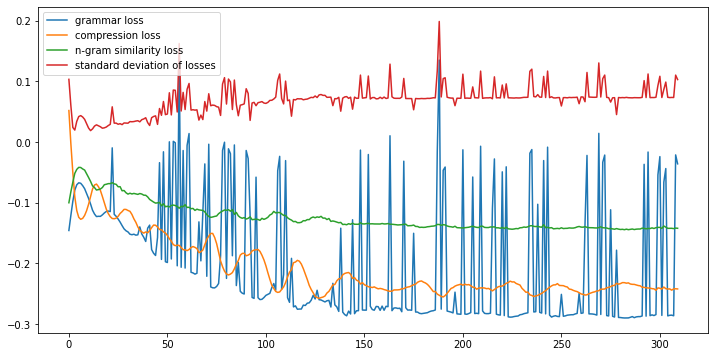

g 0.8655 	s 0.9885 	c 0.3908, score 2.0235, [This spot in Essex Spa has tech-free policy in grounds to enable you be peace with world and have points leave from work them to check weather view seems travellers would benefit from switching off to disconnect more all-important balance and website spots free and phone reception digitaldetoxholidays have increase customers in six report The Independent.]
g 1.8899 	s 0.9889 	c 0.3737, score 2.1776, [This spot in Essex Spa has tech-free policy in grounds to enable you be peace with world and have points leave from work them to check weather view seems travellers would benefit from switching off to disconnect restoring more all-important balance and website spots free and phone reception digitaldetoxholidays have increase customers in six report The Independent.]
g -4.1178 	s 0.9901 	c 0.4317, score 1.2355, [spot in Essex Spa has tech-free policy in grounds to enable you be peace with world and points leave from work them to check weather vie

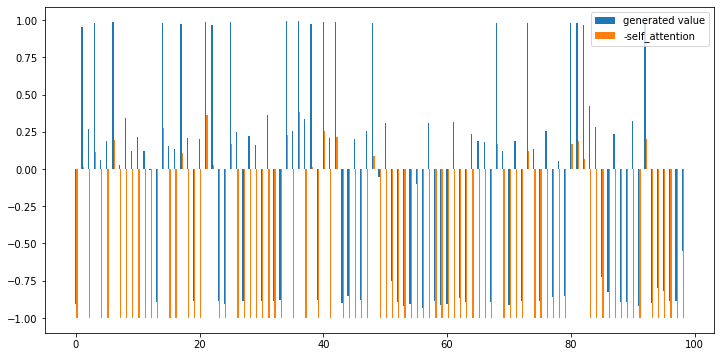

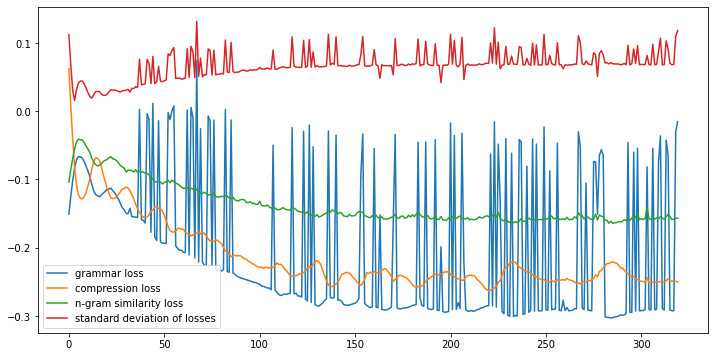

g 3.9283 	s 0.9780 	c 0.3464, score 2.4791, [spot in Essex the Lifehouse Spa has a strict tech-free policy in grounds to enable you to at peace with and ‘While have their points leave from work using them check the weather maps seems travellers would benefit e-mails disconnect more all-important work/life balance and One showcasing spots around world of and phone reception www digitaldetoxholidays reported increase customers]
g 2.4554 	s 0.9724 	c 0.4147, score 2.2963, [spot in Essex Lifehouse Spa has a strict tech-free policy in grounds to enable you to at peace with and ‘While have their points leave from work using them check the weather maps seems travellers would benefit e-mails disconnect work/life balance and showcasing spots of and phone reception www digitaldetoxholidays reported increase customers]
g 3.3531 	s 0.9725 	c 0.3857, score 2.4170, [spot in Essex the Spa has a strict tech-free policy in grounds to enable you to at peace with and ‘While have their points leave from w

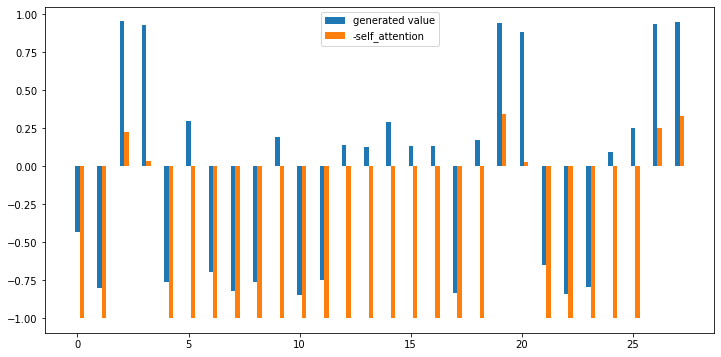

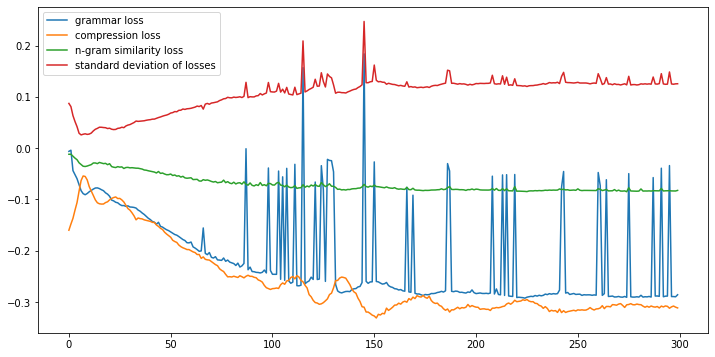

g 3.0131 	s 0.9438 	c 0.4412, score 2.3872, [pop star no that intended as a skin-lightener not a cure for want to buy it.]
g -2.7303 	s 0.8906 	c 0.5735, score 1.3620, [pop star no that intended a not a cure for want to buy it.]
g -1.2911 	s 0.9136 	c 0.4632, score 1.6616, [pop star no that intended as a skin-lightener not a cure for want buy it.]
g 5.2185 	s 0.9287 	c 0.4632, score 2.7617, [pop star that intended as a skin-lightener not a cure for want to buy it.]
g -1.2213 	s 0.9230 	c 0.4706, score 1.6900, [pop star no that intended as a skin-lightener a cure for want to buy it.]
g 3.3897 	s 0.9354 	c 0.4926, score 2.4930, [pop star that intended as a skin-lightener a cure for want to buy it.]
g -3.9813 	s 0.8901 	c 0.4926, score 1.2192, [pop star no that intended as a skin-lightener a cure for want buy it.]
g 3.2452 	s 0.8839 	c 0.4853, score 2.4100, [pop star no that intended as a skin-lightener cure for want to buy it.]
g 3.4340 	s 0.9271 	c 0.4779, score 2.4773, [pop star no int

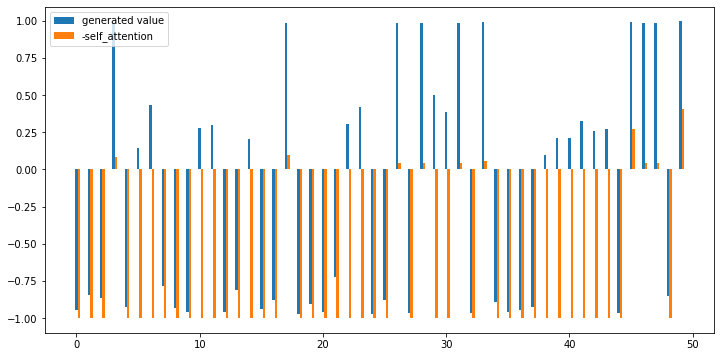

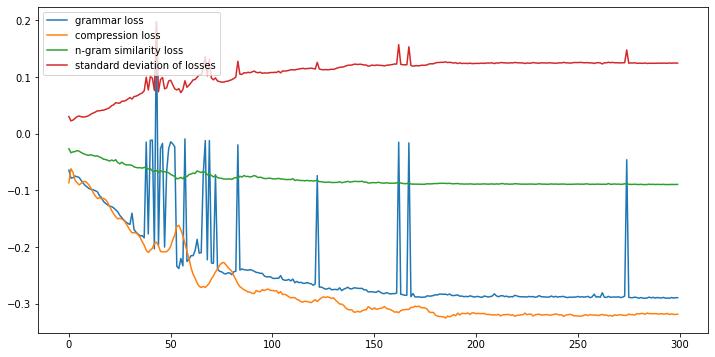

g 3.0901 	s 0.9194 	c 0.5468, score 2.3876, [care Scroll down The comment a Miss who has of her own brand of cream a speech about learning to value color of her skin.]
g 2.5555 	s 0.9303 	c 0.5618, score 2.2944, [care Scroll down The comment a Miss who of her own brand of cream a speech about learning to value color of her skin.]
g 3.4783 	s 0.9200 	c 0.5543, score 2.4454, [care Scroll down The comment a Miss who has of her own brand of cream speech about learning to value color of her skin.]
g 1.9565 	s 0.9313 	c 0.5693, score 2.1881, [care Scroll down The comment a Miss who has of her own brand of cream a speech about learning to color of her skin.]
요약률 0.5543 유사성 0.9200 문법성 3.4783 요약 [care Scroll down The comment a Miss who has of her own brand of cream speech about learning to value color of her skin.]
--------------------------------------------------
care Scroll down The comment a Miss who has of her own brand of cream speech about learning to value color of her skin. 2.445431040

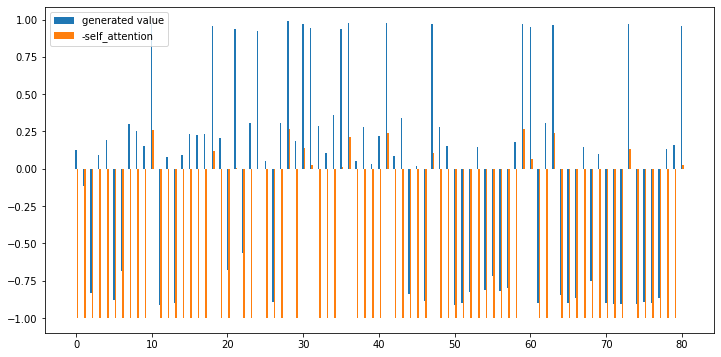

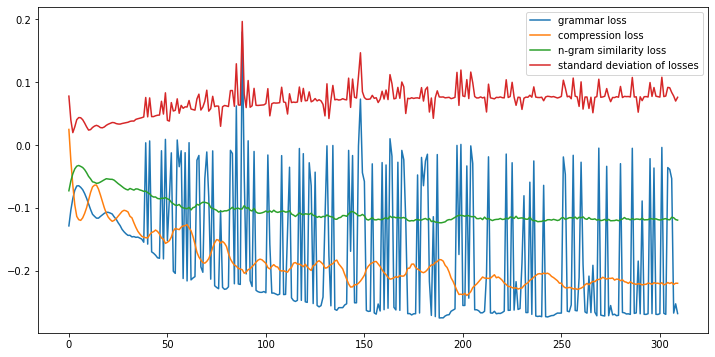

g 1.3710 	s 0.9616 	c 0.3640, score 2.0541, [And as as Dencias Lancome is a white company quick perusal of the website reveals it a number of and foundations in darker skin tones and In her response Dencia said of the cosmetics company: But sell cream tho star Lancomes Blanc Expert of cosmetics advertised brighteners production of the skin.]
g 3.2201 	s 0.9675 	c 0.3576, score 2.3617, [And as Dencias Lancome is a white company quick perusal of the website reveals it a number of and foundations in darker skin tones and In her response Dencia said of the cosmetics company: But sell cream tho [sic] star Lancomes Blanc Expert of cosmetics advertised brighteners production of the skin.]
g -2.3522 	s 0.9494 	c 0.4283, score 1.4856, [And as Lancome is a white quick perusal of website reveals it a number and foundations in darker skin tones and In her response Dencia of the cosmetics company: But cream tho [sic] star Lancomes Blanc Expert of cosmetics advertised brighteners production of the s

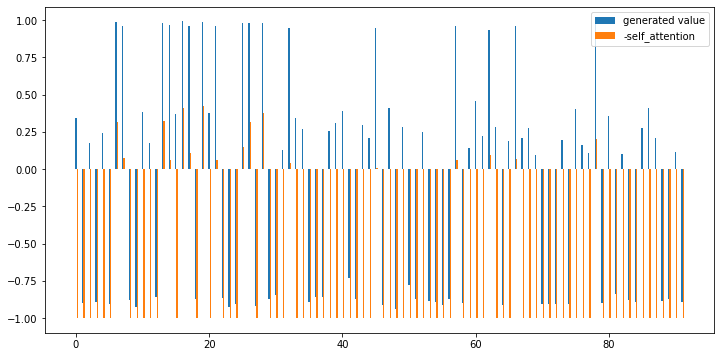

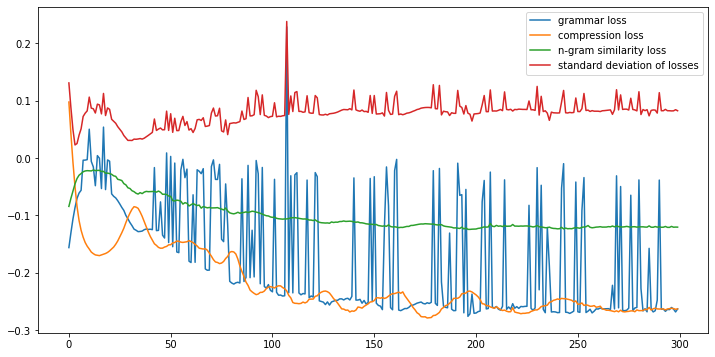

g 1.9899 	s 0.9456 	c 0.4081, score 2.1853, [They be ’ Chief Marshal Graydon a head of the RAF and Commodore Andrew Lambert defence chief commanded Iraq called for Britain military options in The ex-military chiefs suggested up operations of fanatics including British Muslims who swept across northern Iraq and UK Forces on the ground be on to inflict huge advancing]
g 2.2041 	s 0.9425 	c 0.4118, score 2.2216, [They be ’ Chief Marshal Graydon head of the RAF and Commodore Andrew Lambert defence chief commanded Iraq called for Britain military options in The ex-military chiefs suggested up operations of fanatics including British Muslims who swept across northern Iraq and UK Forces on the ground be on to inflict huge advancing]
g -1.6780 	s 0.9427 	c 0.4228, score 1.5859, [They be ’ Chief Marshal Graydon a head of the RAF and Commodore Andrew Lambert defence chief commanded Iraq called for Britain military options in ex-military chiefs suggested up operations of fanatics including Britis

In [ ]:
import io
R1 = []
R2 = []
RL = []
Similarity = []
Grammar = []

result_data = {}
result_data['comp_rate'] = []
result_data['R1'] = []
result_data['R2'] = []
result_data['RL'] = []
result_data['Similarity'] = []
result_data['Grammar'] = []

atten_rate = 0.2
similarity = 1.0
std_factor = 3.0

#es = ExtactiveSummarizer()

logout = True
for rate in range(0,1):
    comp_rate=1.5
    result_data['comp_rate'].append(comp_rate)
    for try_count in range(100):
        
        full_text = get_prepared_doc(sentences_dataset[try_count])
        '''
        try:
            del model
            print('delete model')
        except Exception as ex:
            pass
        model = EncoderDecoderModel.from_pretrained("/content/drive/MyDrive/GAN_ENDE/en_sentence_complete_model")
        '''
        #try:

        #org_text = besm(full_text,num_sentences=9)
        org_text = es.generate_summary(full_text,top_n=9)[0]
        
        org_sentences = np.array(nltk.sent_tokenize(org_text.strip()))
        if logout:
            print('BESM Summary sentance length:',len(org_sentences))
        org_text,grammar,simil = summary(full_text,org_text,steps=3,top_rank=3,comp_rate=comp_rate)
        
        gsmry = gold_summary[try_count]
        
        print('='*50 + ' Original Document ' + str(try_count) + '='*50)
        for txt in np.array(nltk.sent_tokenize(full_text)):
            print(txt)
        print('-'*50 + ' Summary ' + str(try_count) + '-'*50)
        for txt in np.array(nltk.sent_tokenize(org_text.strip())):
            print(txt)
        print('-'*50 + ' Ground truth' + '-'*50)
        print(gsmry)
        print('-'*120)

        with io.open('/content/drive/MyDrive/GAN_ENDE/CNN_Daily_summary_result.txt','a',encoding='utf8') as f:
            f.write(org_text + '\r\n\r\n')
        smry = org_text
        scores = scorer.score(gsmry,smry)
        print(scores['rouge1'].fmeasure)
        if scores['rouge1'].fmeasure > 0.1:
            print('rouge1', scores['rouge1'].fmeasure)
            print('rouge2', scores['rouge2'].fmeasure)
            print('rougeL', scores['rougeL'].fmeasure)
            print('Similarity',simil)
            print('Grammar',grammar)

            R1.append(scores['rouge1'].fmeasure)
            R2.append(scores['rouge2'].fmeasure)
            RL.append(scores['rougeL'].fmeasure)
            Similarity.append(simil)
            Grammar.append(grammar)
            print()
            print('Mean R1',np.mean(R1))
            print('Mean R2',np.mean(R2))
            print('Mean RL',np.mean(RL))
            print('Similarity',np.mean(Similarity))
            print('Grammar',np.mean(Grammar))
        print()               
        #except Exception as ex:
        #    print(ex)

    print()
    print()
    print()
    print("="*50 + "Compression rate:" + str(comp_rate) + "=" * 50)
    print('R1',np.mean(R1))
    print('R2',np.mean(R2))
    print('RL',np.mean(RL))
    print('Similarity',np.mean(Similarity))
    print('Grammar',np.mean(Grammar))    
    print()
    print()
    print()
    result_data['R1'].append(np.mean(R1))
    result_data['R2'].append(np.mean(R2))
    result_data['RL'].append(np.mean(RL))
    result_data['Similarity'].append(np.mean(Similarity))
    result_data['Grammar'].append(np.mean(Grammar))
df_result_data = pd.DataFrame(result_data)
df_result_data